In [1]:
%load_ext autoreload
%autoreload 2
# Above we are adding this autoreload magic command, so we can make changes to tms and it will load them correctly
import warnings
from collections import defaultdict
import matplotlib.pyplot as plt
import matplotlib.cm as cm

import numpy as np
import pandas as pd
from scipy.spatial import ConvexHull
import torch
import torch.nn as nn
import os
from typing import List, Dict, Any, Tuple

from tms.utils.utils import load_results, get_first, iterate_container
from tms.training.experiments import run_experiments
from tms.utils.utils import generate_sparsity_values
from tms.data.dataset import SyntheticBinaryValued
from tms.models.autoencoder import ToyAutoencoder
from tms.llc import estimate_llc, get_llc_data, preaggregate_llc
from tms.plots.kgons import plot_losses_and_polygons
from tms.plots.losses import compare_dataframes_and_results

In [2]:
def get_or_create_preaggregated_llc_csv(results, version: str, data_dir: str) -> pd.DataFrame:
    """Load preaggregated LLC values from CSV, or generate and save them."""
    preagg_path = os.path.join(data_dir, f"llc_preagg_{version}.csv")
    
    if os.path.exists(preagg_path):
        print(f"Loading preaggregated LLC from {preagg_path}")
        return pd.read_csv(preagg_path)
    
    print("Preaggregated file not found — computing from raw results...")
    llc_estimates = get_llc_data(results, version, data_dir)

    # Preaggregate (returns dict), convert to DataFrame for CSV
    preagg = preaggregate_llc(llc_estimates)
    preagg_df = pd.DataFrame([
        {'index': k[0], 'batch_size': k[1], 'lr': k[2], 'snapshot_index': k[3], 'llc': v}
        for k, v in preagg.items()
    ])

    print(f"Saving preaggregated LLC to {preagg_path}")
    preagg_df.to_csv(preagg_path, index=False)

    return preagg_df

In [30]:

data_path = "../../data/"
version = "1.8.0"

results_1_8= load_results(data_path, version)
llc_estimates_1_8 = get_or_create_preaggregated_llc_csv(results_1_8, version, data_path)

version = "1.7.0"

results_1_7= load_results(data_path, version)
llc_estimates_1_7 = get_or_create_preaggregated_llc_csv(results_1_7, version, data_path)

version = "1.11.0"

results_1_11= load_results(data_path, version)
llc_estimates_1_11 = get_or_create_preaggregated_llc_csv(results_1_11, version, data_path)

version = "1.12.0"

results_1_12= load_results(data_path, version)
llc_estimates_1_12 = get_or_create_preaggregated_llc_csv(results_1_12, version, data_path)

version = "1.13.0"

results_1_13= load_results(data_path, version)
llc_estimates_1_13 = get_or_create_preaggregated_llc_csv(results_1_13, version, data_path)

version = "1.14.0"

results_1_14= load_results(data_path, version)
llc_estimates_1_14 = get_or_create_preaggregated_llc_csv(results_1_14, version, data_path)

version = "1.15.0"

results_1_15= load_results(data_path, version)
llc_estimates_1_15 = get_or_create_preaggregated_llc_csv(results_1_15, version, data_path)


Loading preaggregated LLC from ../../data/llc_preagg_1.8.0.csv
Loading preaggregated LLC from ../../data/llc_preagg_1.7.0.csv
Loading preaggregated LLC from ../../data/llc_preagg_1.11.0.csv
Loading preaggregated LLC from ../../data/llc_preagg_1.12.0.csv
Loading preaggregated LLC from ../../data/llc_preagg_1.13.0.csv
Loading preaggregated LLC from ../../data/llc_preagg_1.14.0.csv
Loading preaggregated LLC from ../../data/llc_preagg_1.15.0.csv


In [31]:
results_1_15[0]['parameters'].keys()

dict_keys(['m', 'n', 'num_samples', 'num_samples_test', 'batch_size', 'num_epochs', 'sparsity', 'lr', 'momentum', 'weight_decay', 'init_kgon', 'no_bias', 'init_zerobias', 'prior_std', 'seed', 'use_optimal_solution', 'data_generating_class', 'log_ivl'])

In [32]:
results_random_init = results_1_13
llc_estimates_random_init = llc_estimates_1_13

results_optimal_init = results_1_14
llc_estimates_optimal_init = llc_estimates_1_14

Batch size: 300, Learning rate: 0.001



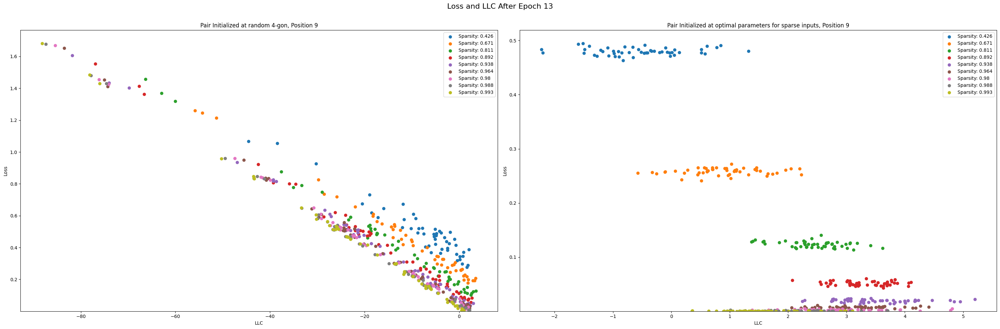

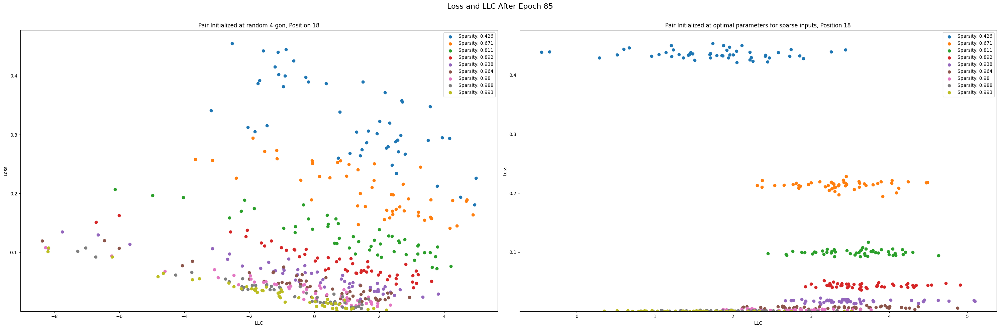

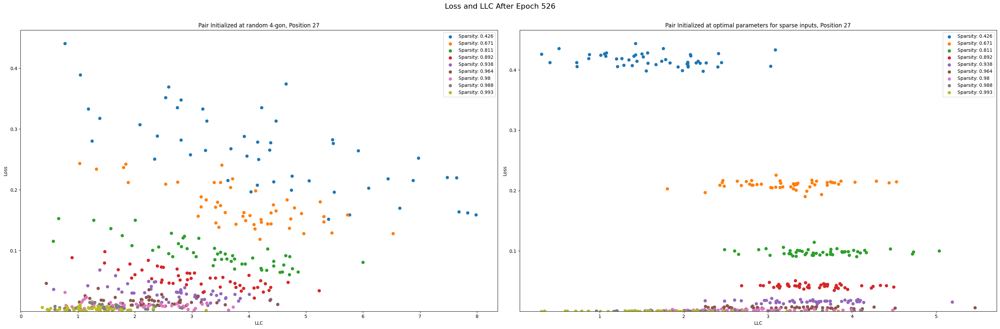

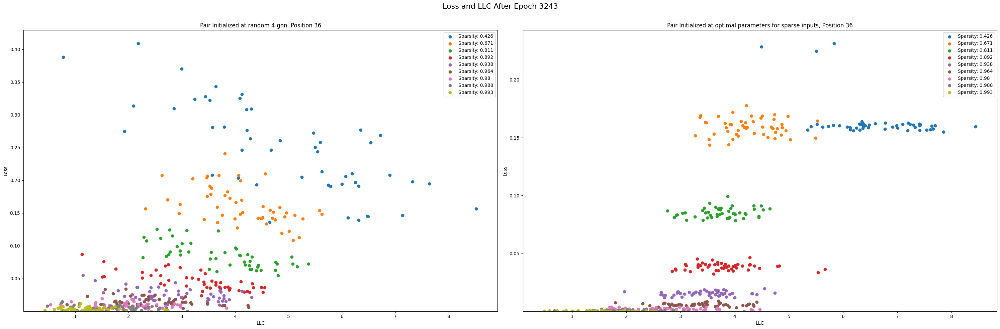

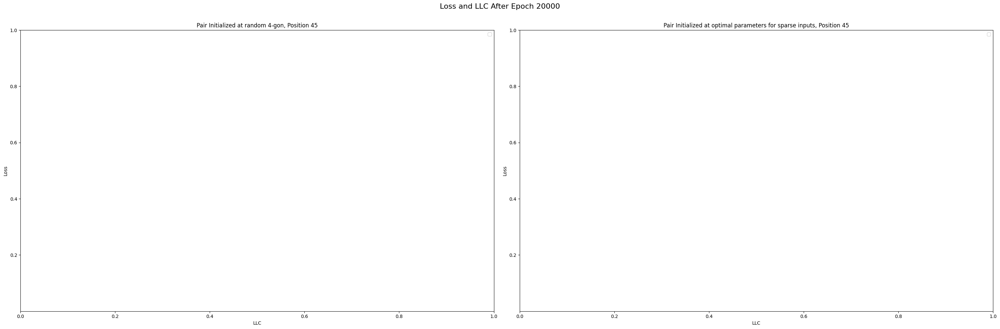

In [33]:
compare_dataframes_and_results(
    [(llc_estimates_1_8, results_1_8), (llc_estimates_1_7, results_1_7)], result_path='../../results'
)

Batch size: 300, Learning rate: 0.001



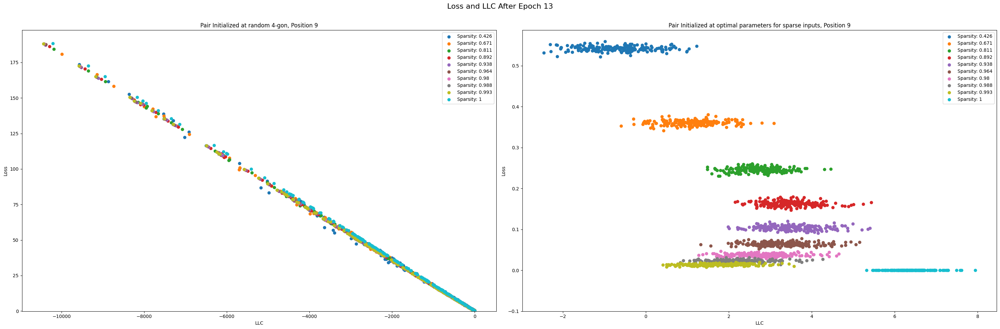

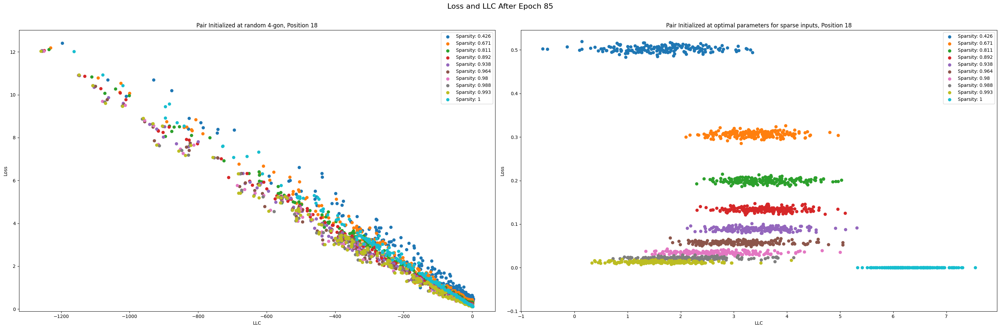

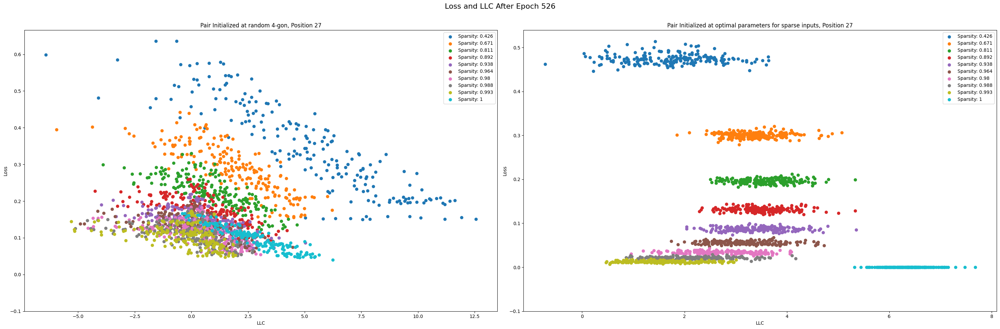

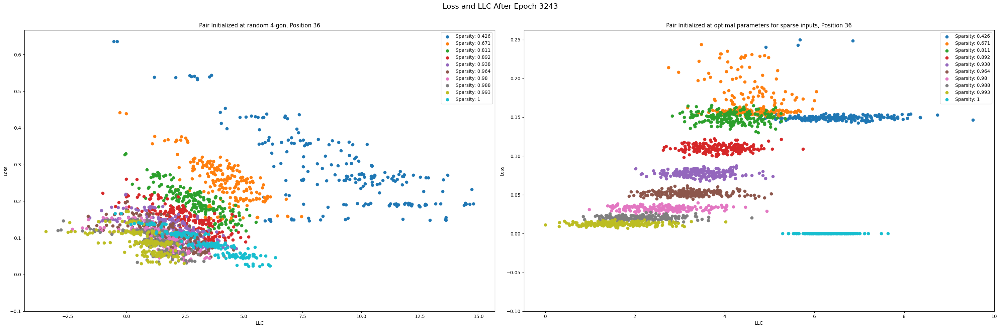

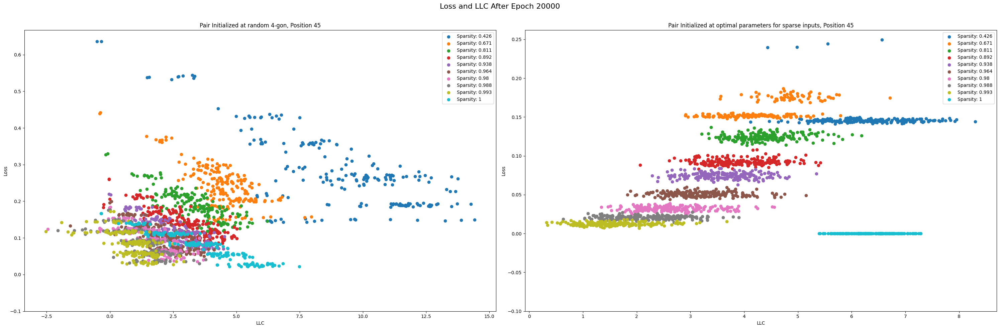

In [84]:
compare_dataframes_and_results(
    [(llc_estimates_1_13, results_1_13), (llc_estimates_1_14, results_1_14)], result_path='../../results', ymin=-0.1
)

In [35]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors

import torch
import torch.nn as nn

import numpy as np

from typing import Any, Dict, List, Tuple
import warnings
from collections import defaultdict

from tms.models.autoencoder import ToyAutoencoder
from tms.data.dataset import SyntheticBinaryValued
from tms.plots.kgons import plot_losses_and_polygons
from tms.utils.utils import iterate_container, get_first
import pandas as pd
DfResultPair = Tuple[pd.DataFrame, Dict[str, Any]]

def create_position_color_mapping(positions):
    """Create color mapping for different positions/timesteps."""
    cmap = plt.get_cmap("tab10")  
    n_colors = cmap.N 
    return {pos: cmap(i % n_colors) for i, pos in enumerate(sorted(positions))}


def plot_for_sparsity(sparsity, df_results_pairs: Tuple[DfResultPair, DfResultPair], 
                     batch_size, learning_rate, position_to_color, positions, 
                     x_scale, y_scale, sharex, sharey, ymin):
    """Plot LLC vs Loss for a specific sparsity, with different positions as colors."""
    fig, axes = plt.subplots(1, len(df_results_pairs), figsize=(15*len(df_results_pairs), 10), 
                            sharey=sharey, sharex=sharex)
    if len(df_results_pairs) == 1:
        axes = [axes]

    for pair_index, (llc_estimates, results) in enumerate(df_results_pairs):
        steps = get_first(results)['parameters']['log_ivl']
        
        llc_estimates_dict = {
            (row['index'], row['batch_size'], row['lr'], row['snapshot_index']): row['llc']
            for _, row in llc_estimates.iterrows()
        }
        
        # Group by position instead of sparsity
        llc_loss_by_position = defaultdict(list)
        
        for result in iterate_container(results):
            index = result["run_id"]
            result_sparsity = results[index]['parameters']['sparsity']
            
            # Only plot results matching the target sparsity
            if abs(result_sparsity - sparsity) > 1e-6:  # Allow for floating point precision
                continue
                
            for position in positions:
                llc = llc_estimates_dict.get((index, batch_size, learning_rate, position), np.nan)
                if position < len(results[index]['logs']):
                    loss = results[index]['logs']['loss'].values[position]
                    llc_loss_by_position[position].append((llc, loss))

        # Plot each position with different colors
        for position, llc_loss in llc_loss_by_position.items():
            if not llc_loss:  # Skip if no data
                continue
                
            arr = np.asarray(llc_loss)
            mask = ~np.isnan(arr[:, 0])
            if not mask.any():
                continue
                
            llcs, losses = arr[mask].T
            color = position_to_color.get(position, 'gray')
            epoch = steps[position] if position < len(steps) else position
            axes[pair_index].scatter(llcs, losses, label=f"Epoch {epoch}", color=color, alpha=0.7)

        if pair_index == 0:
            title = "Initialized at random 4-gon"
        elif pair_index == 1:
            title = "Initialized at optimal parameters for sparse inputs"
        else:
            title = f"Pair {pair_index}"
            
        axes[pair_index].set_title(f"{title}, Sparsity {sparsity:.3f}")
        axes[pair_index].set_xlabel("LLC")
        axes[pair_index].set_ylabel("Loss")
        axes[pair_index].legend()
        axes[pair_index].set_xscale(x_scale)
        axes[pair_index].set_yscale(y_scale)
        axes[pair_index].set_ylim(ymin=ymin)

    plt.tight_layout()
    plt.suptitle(f"Loss vs LLC for Sparsity {sparsity:.3f} (Different Colors = Different Epochs)", fontsize=16)
    plt.subplots_adjust(top=0.9)

    return fig


def compare_dataframes_by_sparsity(
    df_results_pairs: Tuple[DfResultPair, DfResultPair],
    positions=[9, 18, 27, 36, 45],
    hyperparam_combos=[(300, 0.001)],
    x_scale="linear",
    y_scale="linear",
    sharey=False,
    sharex=False,
    ymin=1e-4
):
    """
    Create separate plots for each sparsity value, with positions shown as different colors.
    This is the inverse of the original function where sparsity was colored.
    """
    warnings.simplefilter(action='ignore', category=UserWarning)

    # Collect all unique sparsities across all results
    unique_sparsities = collect_global_sparsities(df_results_pairs)
    position_to_color = create_position_color_mapping(positions)

    for batch_size, learning_rate in hyperparam_combos:
        print(f"Batch size: {batch_size}, Learning rate: {learning_rate}\n")

        for sparsity in unique_sparsities:
            fig = plot_for_sparsity(
                sparsity,
                df_results_pairs,
                batch_size,
                learning_rate,
                position_to_color,
                positions,
                x_scale,
                y_scale,
                sharex,
                sharey,
                ymin
            )

            param_string = f"bs{batch_size}_lr{learning_rate}_sparsity{sparsity:.3f}"
            if x_scale != "linear" or y_scale != "linear":
                param_string += f"_x{x_scale}_y{y_scale}"
            if ymin != 1e-4:
                param_string += f"_ymin{ymin}"

            save_path = f'../../results/loss_vs_llc_by_sparsity_{param_string}'
            fig.savefig(f'{save_path}.svg', bbox_inches='tight', format='svg')
            fig.savefig(f'{save_path}.png', dpi=300, bbox_inches='tight', format='png')
            plt.show()


def plot_single_sparsity_position(
    sparsity: float,
    position: int,
    df_results_pairs: Tuple[DfResultPair, DfResultPair],
    batch_size: int = 300,
    learning_rate: float = 0.001,
    x_scale: str = "linear",
    y_scale: str = "linear",
    sharex: bool = False,
    sharey: bool = False,
    ymin: float = 1e-4,
    figsize: Tuple[float, float] = (15, 6)
):
    """
    Plot LLC vs Loss for a single specific sparsity and position combination.
    
    Parameters
    ----------
    sparsity : float
        The specific sparsity value to plot
    position : int
        The specific position/timestep to plot
    df_results_pairs : Tuple[DfResultPair, DfResultPair]
        The data pairs to plot
    batch_size : int, optional
        Batch size parameter, by default 300
    learning_rate : float, optional
        Learning rate parameter, by default 0.001
    x_scale : str, optional
        X-axis scale, by default "linear"
    y_scale : str, optional
        Y-axis scale, by default "linear"
    sharex : bool, optional
        Share x-axis, by default False
    sharey : bool, optional
        Share y-axis, by default False
    ymin : float, optional
        Minimum y value, by default 1e-4
    figsize : Tuple[float, float], optional
        Figure size, by default (15, 6)
    """
    warnings.simplefilter(action='ignore', category=UserWarning)
    
    fig, axes = plt.subplots(1, len(df_results_pairs), figsize=figsize, 
                            sharey=sharey, sharex=sharex)
    if len(df_results_pairs) == 1:
        axes = [axes]

    for pair_index, (llc_estimates, results) in enumerate(df_results_pairs):
        steps = get_first(results)['parameters']['log_ivl']
        
        llc_estimates_dict = {
            (row['index'], row['batch_size'], row['lr'], row['snapshot_index']): row['llc']
            for _, row in llc_estimates.iterrows()
        }
        
        llcs = []
        losses = []
        
        for result in iterate_container(results):
            index = result["run_id"]
            result_sparsity = results[index]['parameters']['sparsity']
            
            # Only include results matching the target sparsity
            if abs(result_sparsity - sparsity) > 1e-6:
                continue
                
            llc = llc_estimates_dict.get((index, batch_size, learning_rate, position), np.nan)
            if not np.isnan(llc) and position < len(results[index]['logs']):
                loss = results[index]['logs']['loss'].values[position]
                llcs.append(llc)
                losses.append(loss)

        if llcs:  # Only plot if we have data
            axes[pair_index].scatter(llcs, losses, alpha=0.7, s=50)

        if pair_index == 0:
            title = "Initialized at random 4-gon"
        elif pair_index == 1:
            title = "Initialized at optimal parameters for sparse inputs"
        else:
            title = f"Pair {pair_index}"
            
        epoch = steps[position] if position < len(steps) else position
        axes[pair_index].set_title(f"{title}")
        axes[pair_index].set_xlabel("LLC")
        axes[pair_index].set_ylabel("Loss")
        axes[pair_index].set_xscale(x_scale)
        axes[pair_index].set_yscale(y_scale)
        axes[pair_index].set_ylim(ymin=ymin)

    plt.tight_layout()
    plt.suptitle(f"Loss vs LLC - Sparsity {sparsity:.3f}, Epoch {epoch}", fontsize=16)
    plt.subplots_adjust(top=0.85)

    return fig


# Keep the existing helper functions
def collect_global_sparsities(df_results_pairs):
    sparsities = set()
    for _, results in df_results_pairs:
        for result in iterate_container(results):
            sparsity = results[result["run_id"]]['parameters']['sparsity']
            if sparsity != 0:
                sparsities.add(sparsity)
    return sorted(sparsities)




Batch size: 300, Learning rate: 0.001



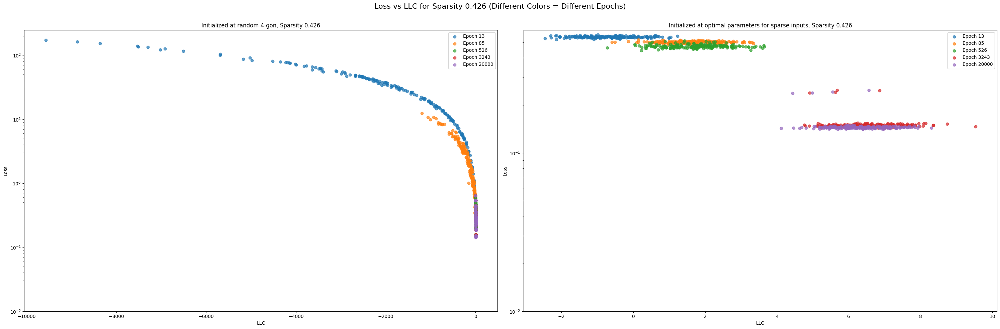

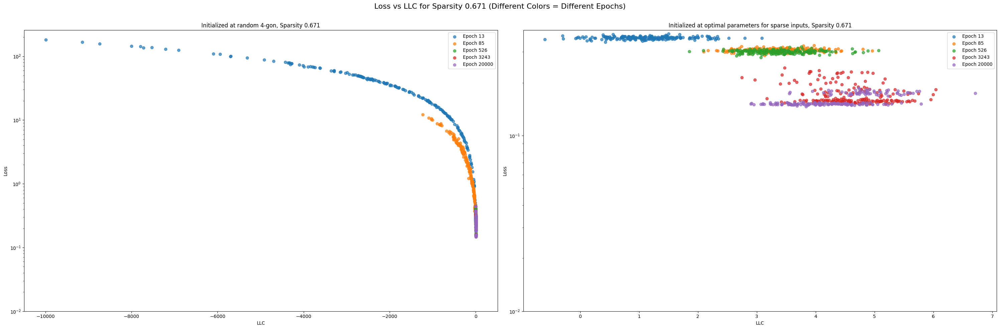

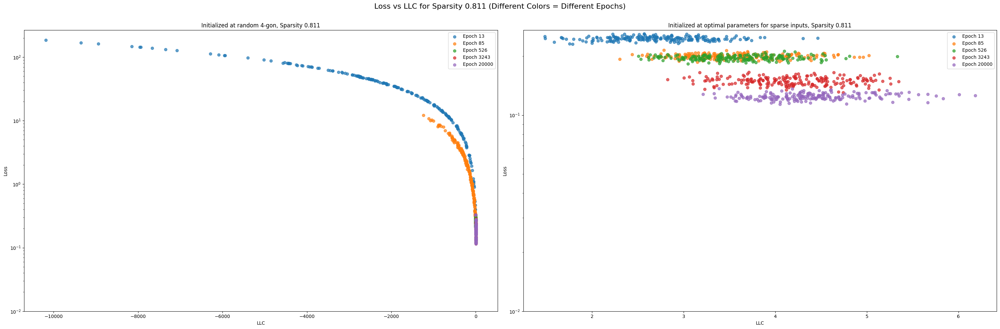

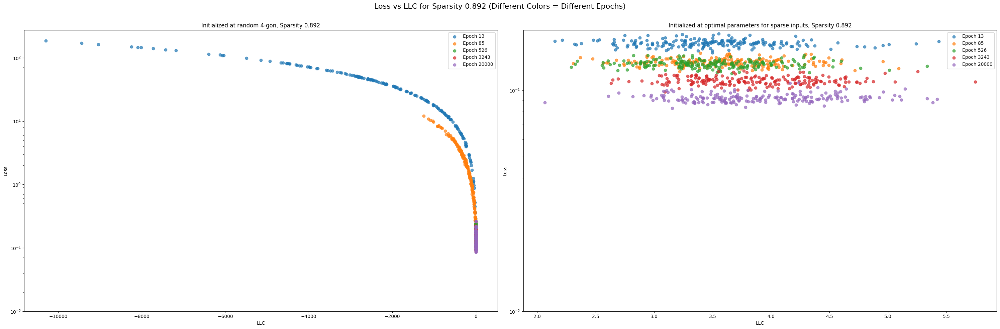

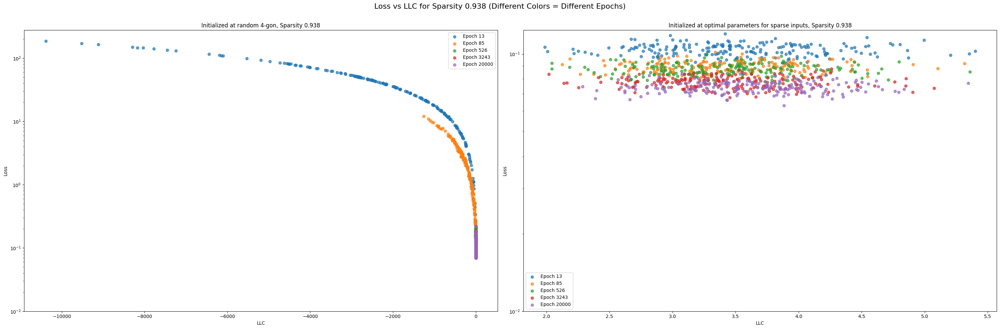

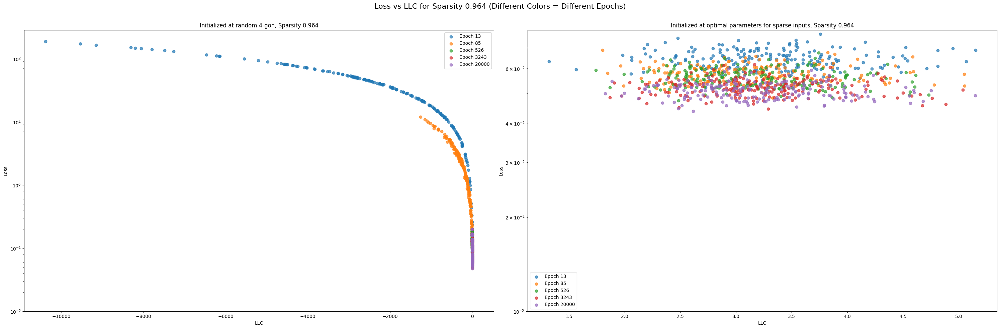

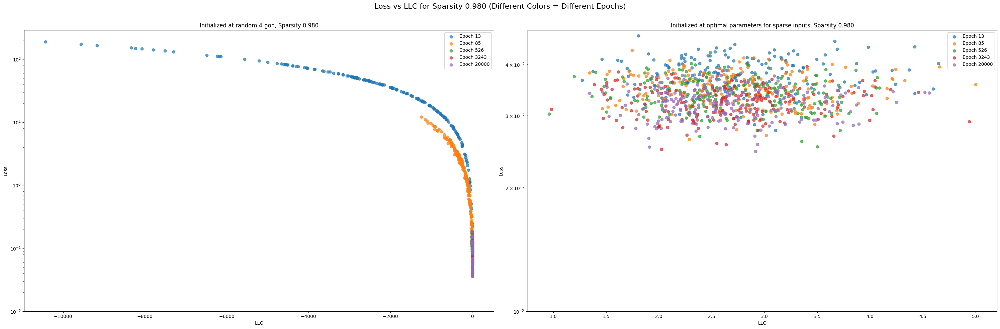

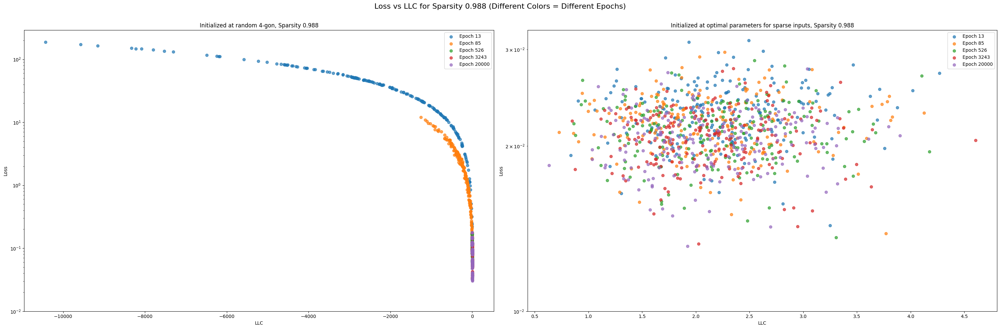

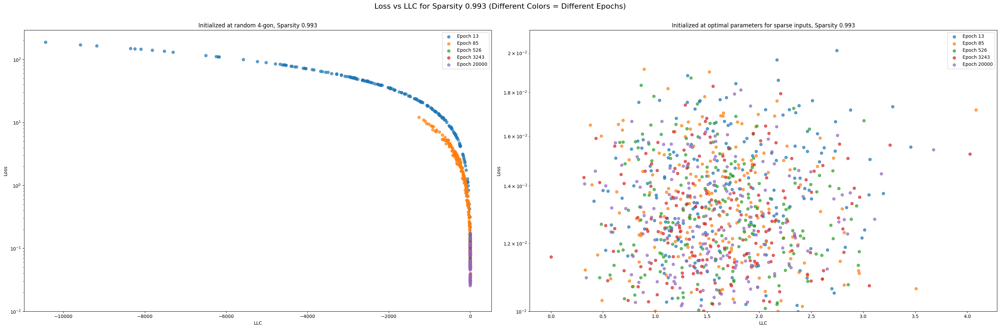

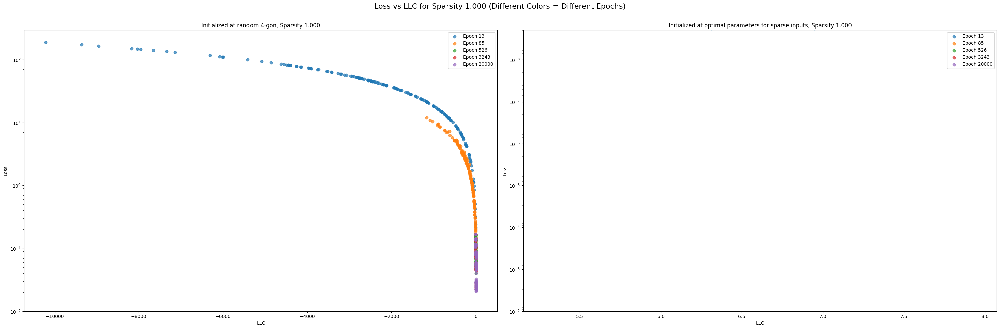

In [8]:
compare_dataframes_by_sparsity([(llc_estimates_1_13, results_1_13), (llc_estimates_1_14, results_1_14)], hyperparam_combos=[(300, 0.001)],ymin=1e-2,y_scale='log')

- lower left is not really nicely visible. 
- Pair of plots for epoch, inside different sparsity
- we could also do different sparsities as plots and epochs as colors

What are observations we make:
- there seem to be clusters of loss levels, 

Observation:
- there is a transition for sparsity 0.67. Hypothesis: Instead of directions it is encoding averages. (Note, it seems the toy models of superposition paper is saying actually something slightly differnet with their prediction?)
- competing predictions: you can either get lower loss by only representing a subset of the features, or you can get a lower loss by predicting all of them. (How do we figure out which one makes more sense?)

In [17]:
def plot_results(results, plot_number =5, step =-1, loss_window = (0.14, .16), weird_indices = [], sparsities= [0.426, 0.671, 0.811, 0.892, 0.938, 0.964, 0.98 , 0.988, 0.993], epsilon=0.001):
    # loss_hist = []
    for sparse_value in sparsities:
        plotted =0
        print(f"Plot polygons for sparsity={sparse_value}")
        for index in range(len(results)):
            
            STEPS = results[index]['parameters']['log_ivl']
            logs = results[index]['logs']
            losses = [logs.loc[logs['step'] == s, 'loss'].values[0] for s in STEPS]
            
            outside_loss_window = losses[step] < loss_window[0] or losses[step] > loss_window[1]
            non_matching_sparsity = abs(results[index]['parameters']['sparsity'] - sparse_value) > epsilon
            if non_matching_sparsity or outside_loss_window:
                continue
            else:
                if plotted>=plot_number:
                    continue
                plotted+=1

            print(f"Loss: {losses[step]}")

            NUM_EPOCHS = 20000
            PLOT_STEPS = [min(STEPS, key=lambda s: abs(s-i)) for i in [0, 200, 2000, 10000, NUM_EPOCHS - 1]]
            PLOT_INDICES = [STEPS.index(s) for s in PLOT_STEPS]
            Ws = [results[index]['weights'][i]['embedding.weight'] for i in PLOT_INDICES]
            biases = [results[index]['weights'][i]['unembedding.bias'] for i in PLOT_INDICES]
            
            model = ToyAutoencoder(6, 2, final_bias=True)
            new_weights ={}
            for idx, ndarray in results[index]['weights'][PLOT_INDICES[-1]].items():
                new_weights[idx] = torch.from_numpy(ndarray)

            # criterion=nn.MSELoss()
        
            # model.load_state_dict(new_weights)

            # # print(sample)
            # # print(model(sample))
            # test_set = SyntheticBinaryValued(10000, 6, sparse_value)
            # mean_loss_test = 0
            # for sample in test_set:
            #     output = model(sample)
            #     mean_loss_test += criterion(output, sample)
            # # print("Mean loss test:")
            # loss_hist.append(mean_loss_test)
            # print(f"index: {index}")
            # print(mean_loss_test/10000)
            # # if mean_loss_test<20:
            # #     continue
            # # else:
            # #     weird_indices.append(index)
            

            print(f'index: {index}')
            #all_weights = [[results[j]['weights'][i] for i in PLOT_INDICES] for j in range(len(results))]
            plot_losses_and_polygons(STEPS, losses, PLOT_STEPS, Ws, biases)
            plt.show()

In [18]:
def plot_specific_index(results, index, step=-1):
    """
    Plot results for a specific index in the results list.
    
    Parameters
    ----------
    results : list
        List of experiment results
    index : int
        Specific index to plot
    step : int, optional
        Step index for loss checking. Default is -1 (last step)
    """
    if index >= len(results):
        print(f"Index {index} out of range for results of length {len(results)}")
        return
    
    result = results[index]
    
    STEPS = result['parameters']['log_ivl']
    logs = result['logs']
    losses = [logs.loc[logs['step'] == s, 'loss'].values[0] for s in STEPS]
    
    sparsity = result['parameters']['sparsity']
    
    print(f"Plotting index {index}")
    print(f"Sparsity: {sparsity}")
    print(f"Loss at step {step}: {losses[step]}")
    
    NUM_EPOCHS = 20000
    PLOT_STEPS = [min(STEPS, key=lambda s: abs(s-i)) for i in [0, 200, 2000, 10000, NUM_EPOCHS - 1]]
    PLOT_INDICES = [STEPS.index(s) for s in PLOT_STEPS]
    
    Ws = [result['weights'][i]['embedding.weight'] for i in PLOT_INDICES]
    biases = [result['weights'][i]['unembedding.bias'] for i in PLOT_INDICES]
    
    # Optional: Load model weights
    model = ToyAutoencoder(6, 2, final_bias=True)
    new_weights = {}
    for idx, ndarray in result['weights'][PLOT_INDICES[-1]].items():
        new_weights[idx] = torch.from_numpy(ndarray)
    
    plot_losses_and_polygons(STEPS, losses, PLOT_STEPS, Ws, biases)
    plt.show()


In [19]:
def get_weights(results, index, step=-1):
    """
    Get the weights of a model at a specific index and timestep.
    
    Parameters
    ----------
    results : list
        List of experiment results
    index : int
        Index of the experiment in results
    step : int, optional
        Step index to get weights from. Default is -1 (last step)
        
    Returns
    -------
    dict
        Dictionary containing the weights at the specified step
    """
    if index >= len(results):
        raise IndexError(f"Index {index} out of range for results of length {len(results)}")
    
    weights_list = results[index]['weights']
    
    if step >= len(weights_list):
        raise IndexError(f"Step {step} out of range for weights list of length {len(weights_list)}")
    
    weights = weights_list[step]
    return weights['embedding.weight'], weights['unembedding.bias']


In [20]:
results_random_init[0]['weights'][-1]

{'embedding.weight': array([[-1.7692752e+00,  9.2687383e-03,  8.9990683e-02,  2.4882682e-02,
          1.7680083e-01,  1.5124761e-02],
        [ 1.1742718e-01,  2.0920094e-03,  1.3579468e+00,  4.1154254e-04,
          2.6423438e+00, -2.1318220e-02]], dtype=float32),
 'unembedding.weight': array([[-1.7692752e+00,  1.1742718e-01],
        [ 9.2687383e-03,  2.0920094e-03],
        [ 8.9990683e-02,  1.3579468e+00],
        [ 2.4882682e-02,  4.1154254e-04],
        [ 1.7680083e-01,  2.6423438e+00],
        [ 1.5124761e-02, -2.1318220e-02]], dtype=float32),
 'unembedding.bias': array([-2.0856333 ,  0.65502065, -4.4433703 ,  0.67647177, -9.590675  ,
         0.7164468 ], dtype=float32)}

In [21]:
results_optimal_init[0]['weights'][-1]

{'embedding.weight': array([[ 0.4891772 ,  0.3230613 , -0.5116094 , -0.61848116,  0.08805073,
          0.09144005],
        [-0.06290167,  0.50254714,  0.10838244,  0.08309775,  0.45407838,
         -0.724059  ]], dtype=float32),
 'unembedding.weight': array([[ 0.4891772 , -0.06290167],
        [ 0.3230613 ,  0.50254714],
        [-0.5116094 ,  0.10838244],
        [-0.61848116,  0.08309775],
        [ 0.08805073,  0.45407838],
        [ 0.09144005, -0.724059  ]], dtype=float32),
 'unembedding.bias': array([0.6931932 , 0.5643093 , 0.57706773, 0.56557167, 0.55478907,
        0.8313791 ], dtype=float32)}

In [22]:
get_weights(results_1_13, 0)

(array([[-1.7692752e+00,  9.2687383e-03,  8.9990683e-02,  2.4882682e-02,
          1.7680083e-01,  1.5124761e-02],
        [ 1.1742718e-01,  2.0920094e-03,  1.3579468e+00,  4.1154254e-04,
          2.6423438e+00, -2.1318220e-02]], dtype=float32),
 array([-2.0856333 ,  0.65502065, -4.4433703 ,  0.67647177, -9.590675  ,
         0.7164468 ], dtype=float32))

Negative bias red, positive in green:

Plot polygons for sparsity=0.426
Loss: 0.6360676884651184
index: 8


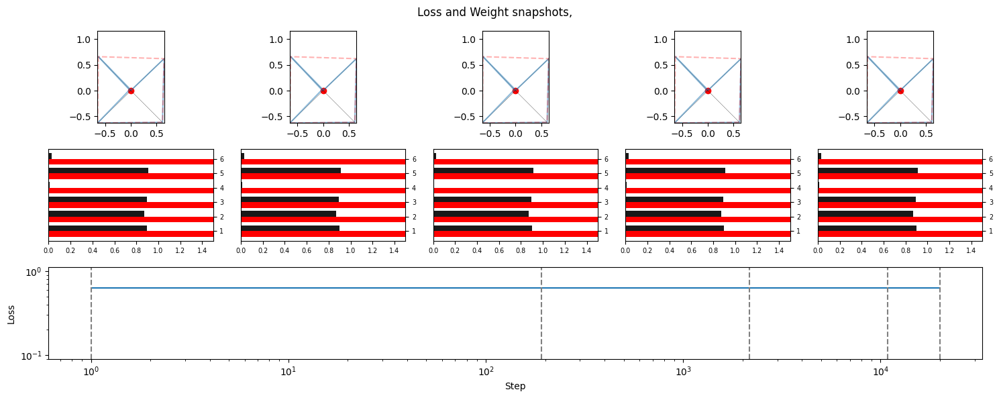

Loss: 0.63623046875
index: 198


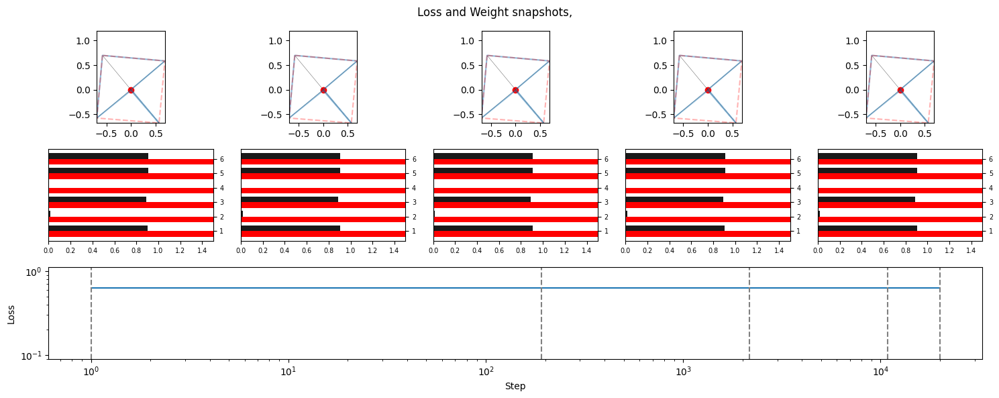

In [23]:
plot_results(results_1_13, plot_number=5, loss_window=(0.6,1), sparsities=[0.426])

Plot polygons for sparsity=0.426
Loss: 0.14984993636608124


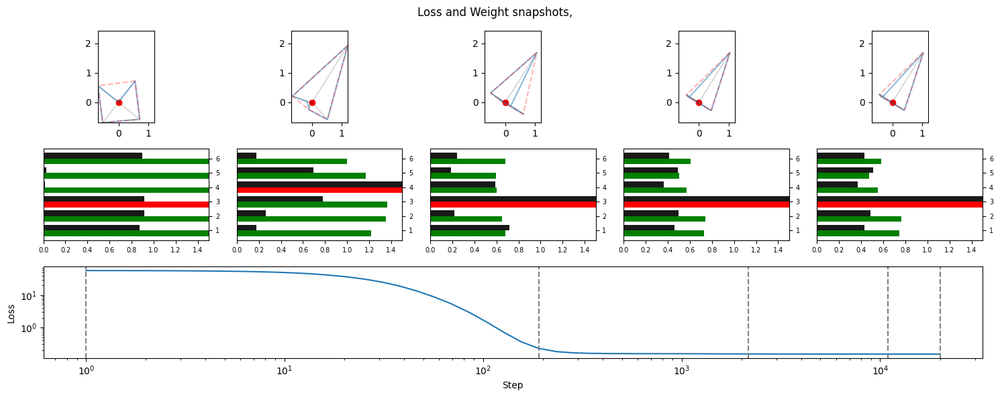

Loss: 0.1511111855506897


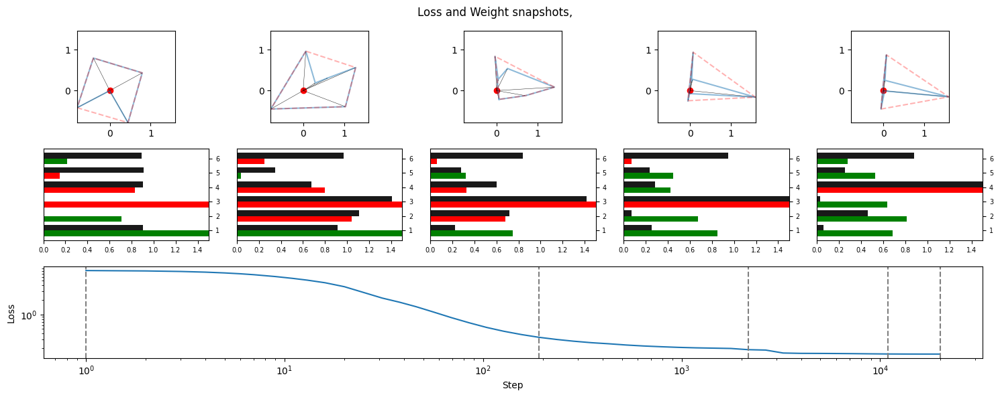

Loss: 0.15149912238121033


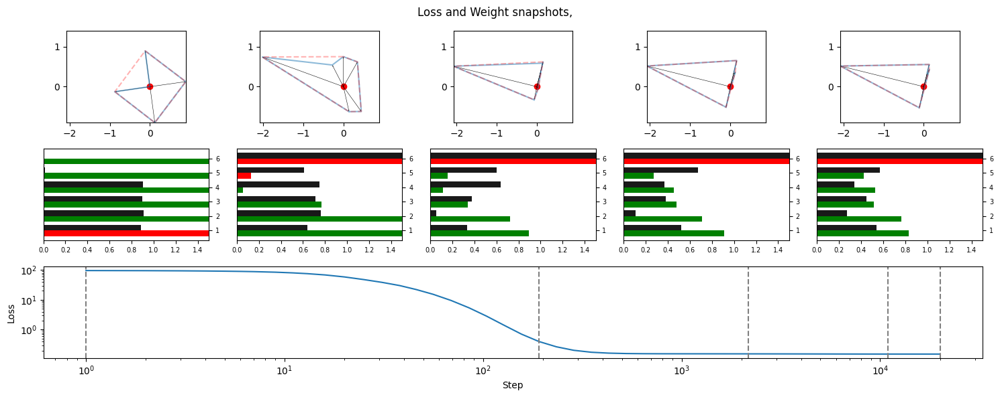

Loss: 0.14821267127990723


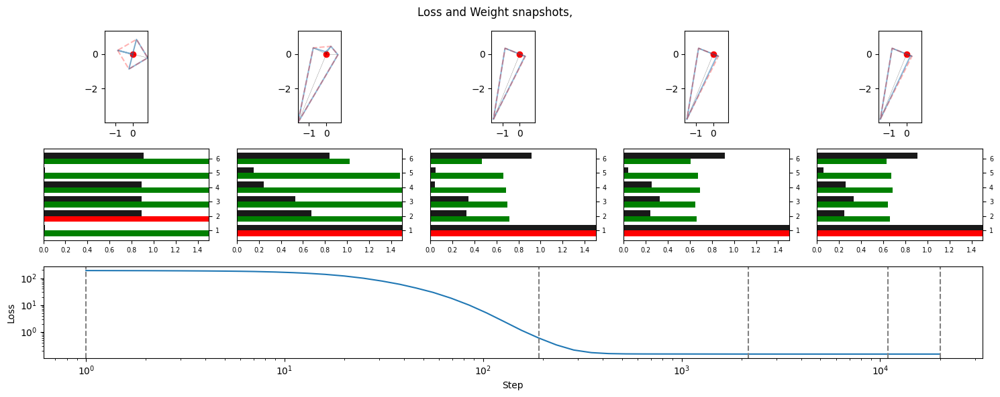

Loss: 0.14944662153720856


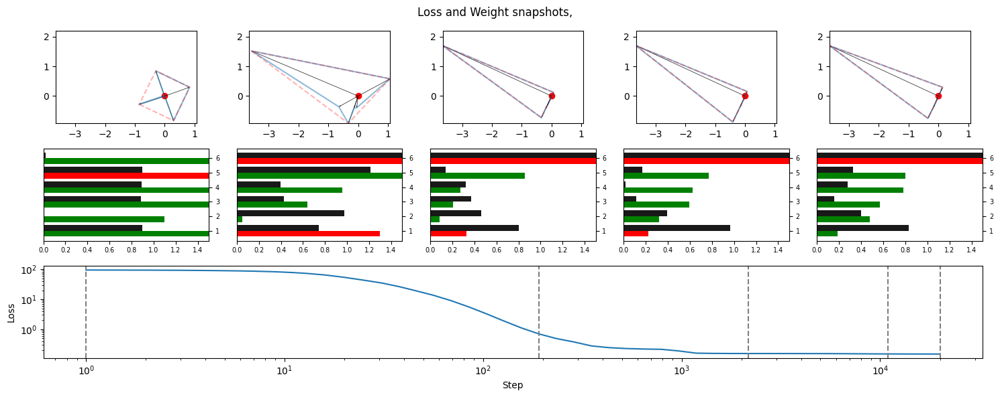

In [9]:
plot_results(results_1_13, plot_number=5, loss_window=(0.1,0.17), sparsities=[0.426])

Plot polygons for sparsity=0.426
Loss: 0.54052734375


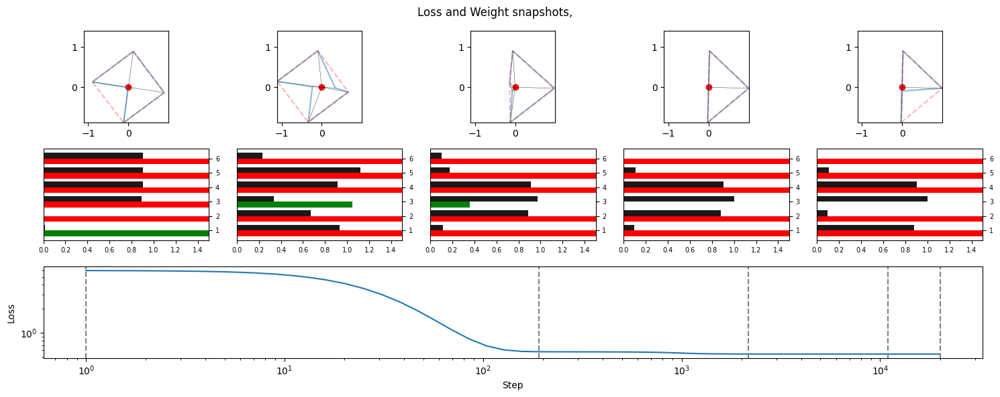

Loss: 0.5437825918197632


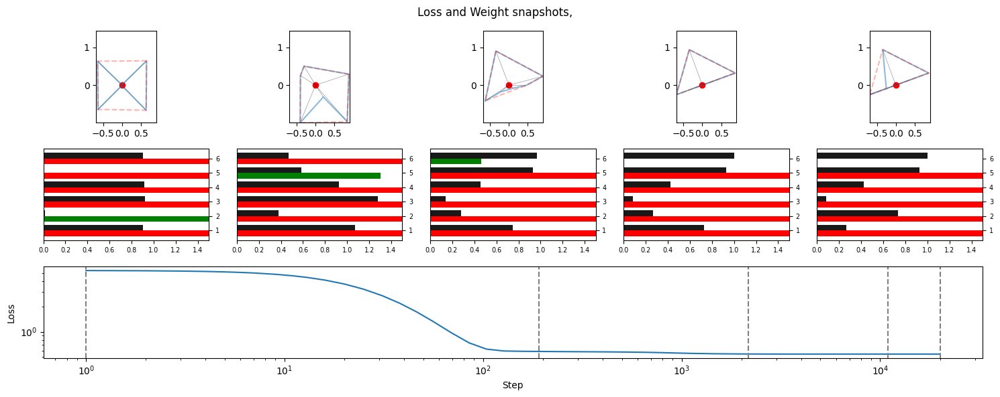

Loss: 0.53759765625


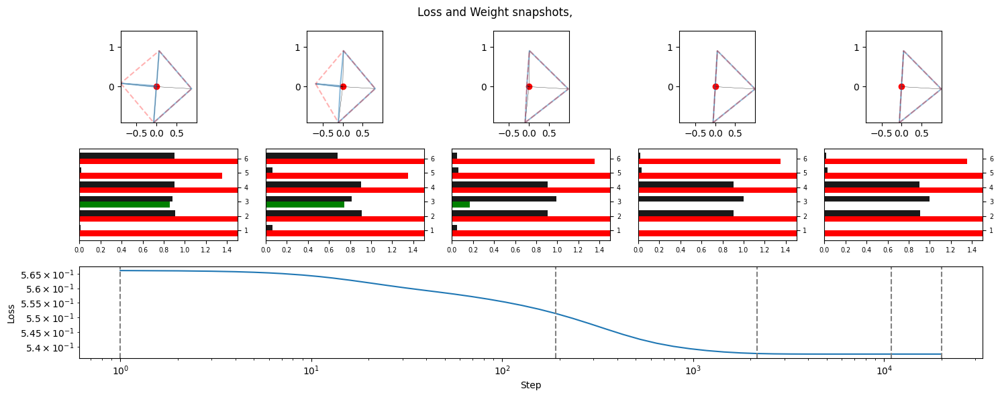

Loss: 0.53857421875


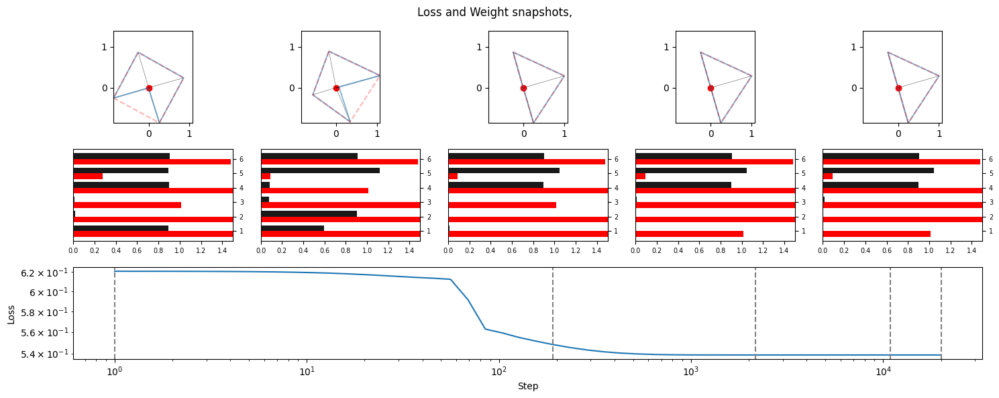

Loss: 0.5358073115348816


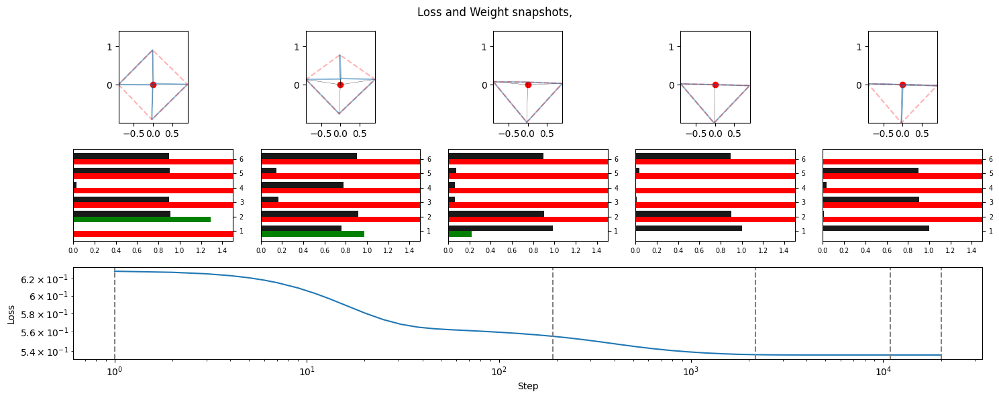

Loss: 0.5319010615348816


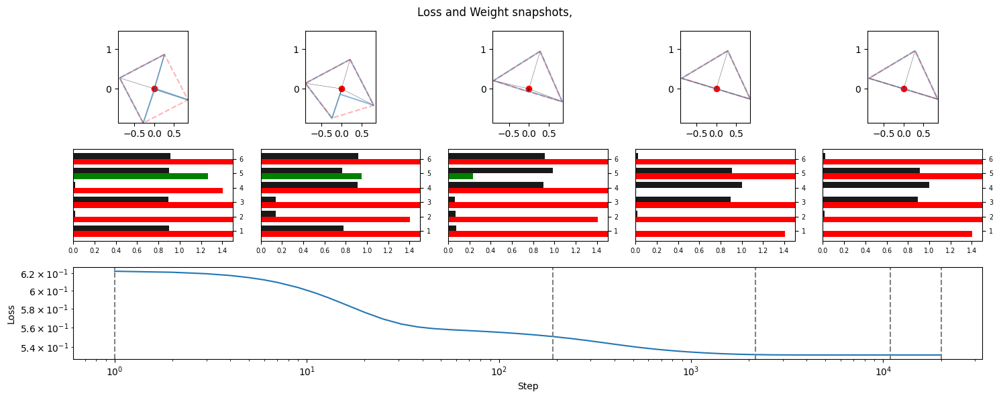

Loss: 0.541015625


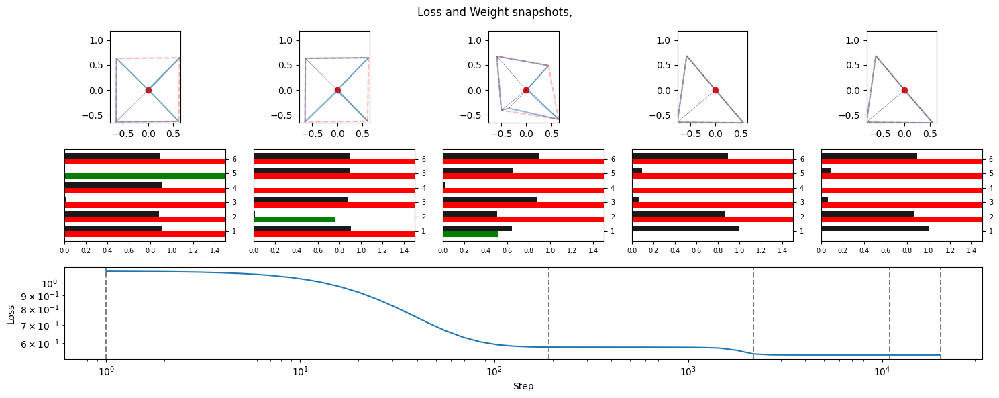

Loss: 0.5397135615348816


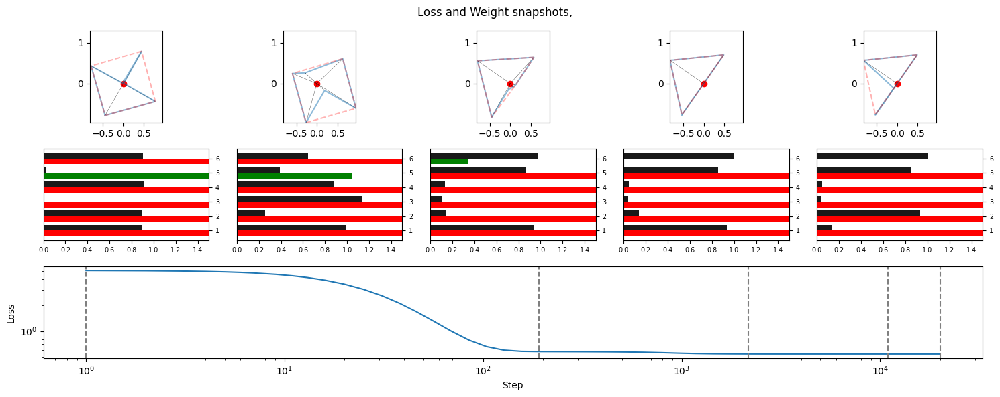

Loss: 0.54248046875


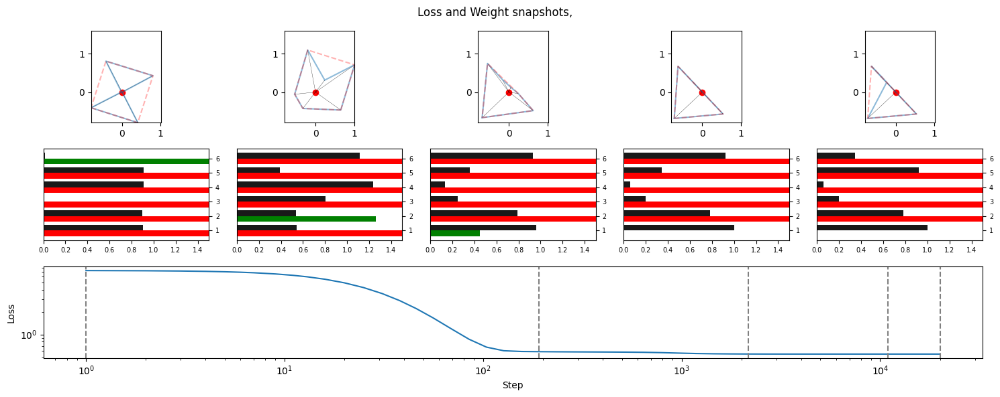

In [31]:
plot_results(results_random_init, plot_number=10, loss_window=(.5,.63), sparsities=[0.426])

Plot polygons for sparsity=0.426
Loss: 0.45310381054878235


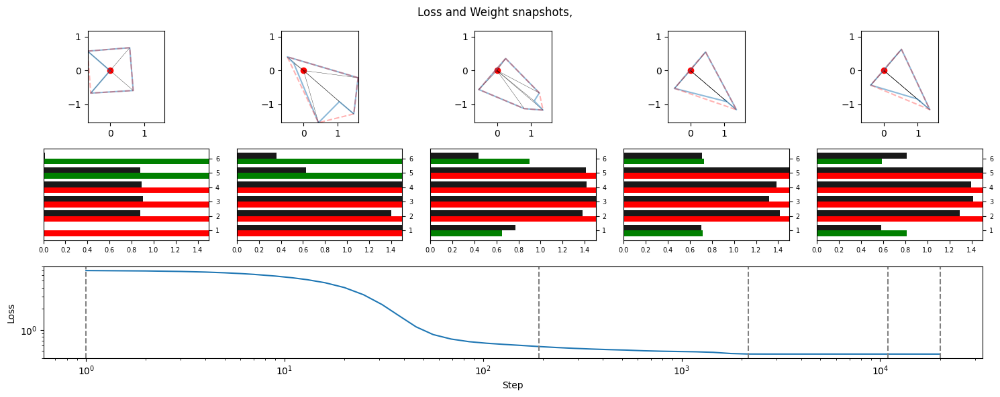

In [ ]:
plot_results(results_random_init, plot_number=20, loss_window=(.45,.5), sparsities=[0.426])

Plot polygons for sparsity=0.426
Loss: 0.4295247495174408
index: 11


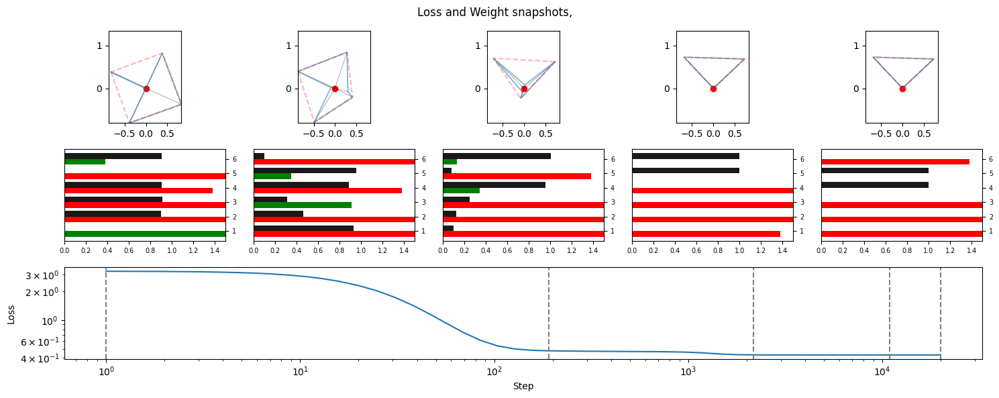

Loss: 0.42822265625
index: 43


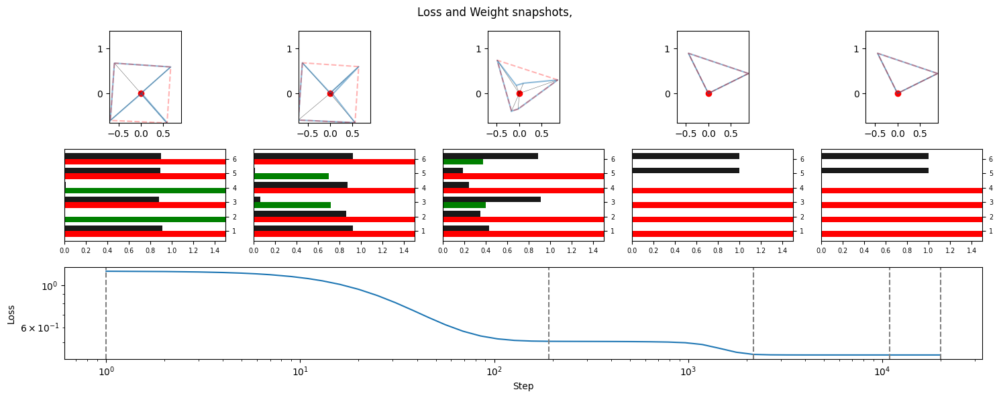

Loss: 0.4288736879825592
index: 57


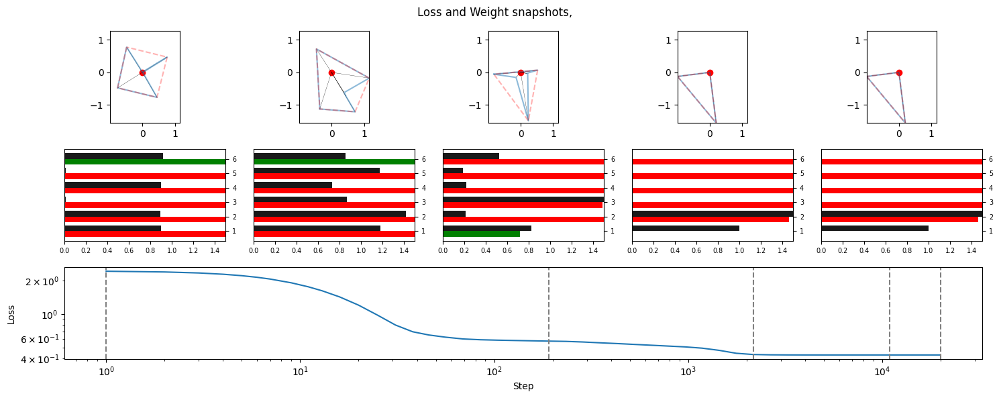

Loss: 0.4305013120174408
index: 62


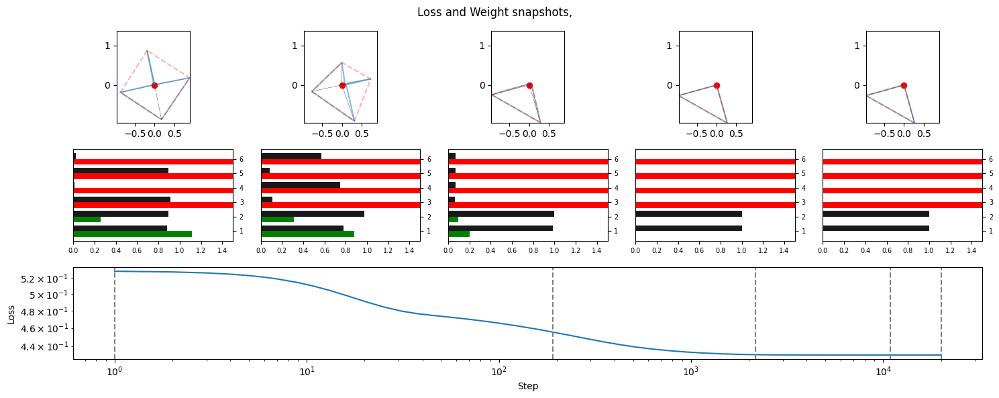

Loss: 0.4318033754825592
index: 73


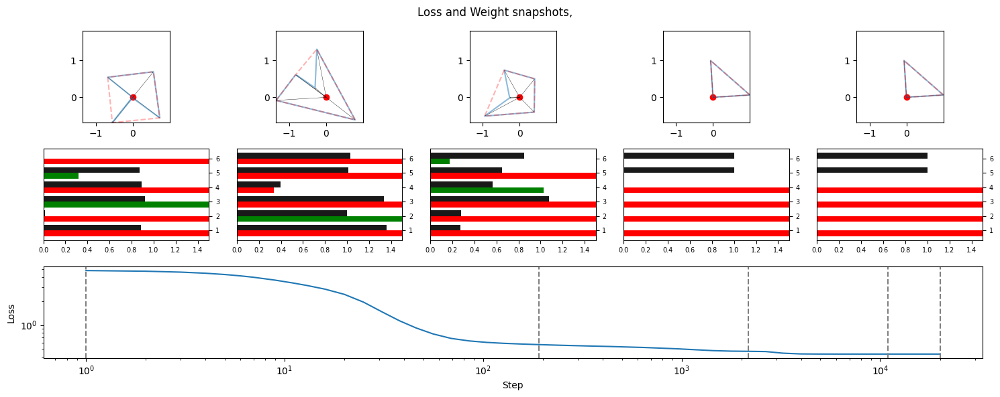

Loss: 0.4287109375
index: 75


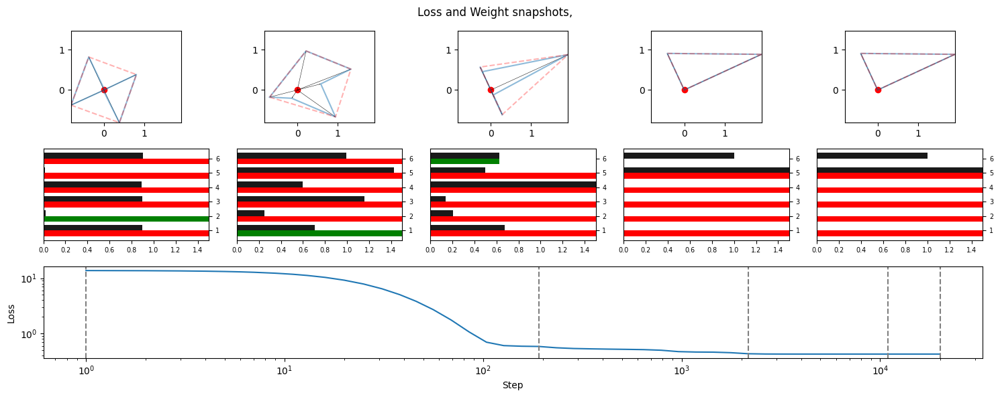

Loss: 0.4285481870174408
index: 82


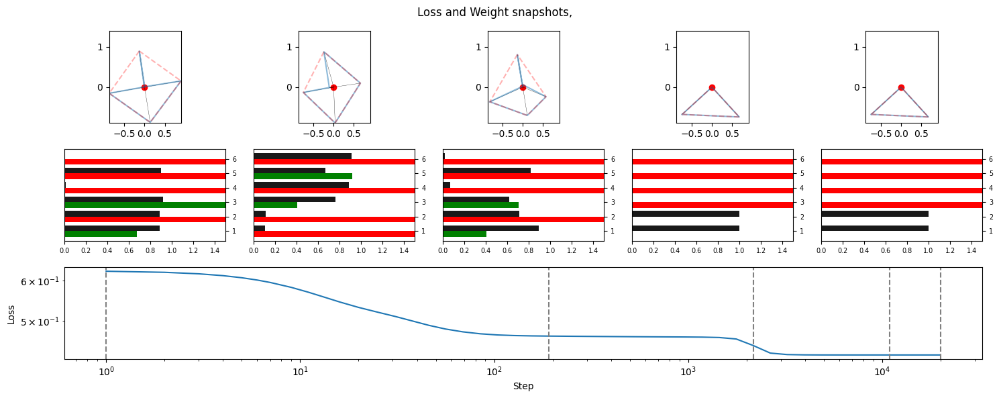

Loss: 0.4327799379825592
index: 85


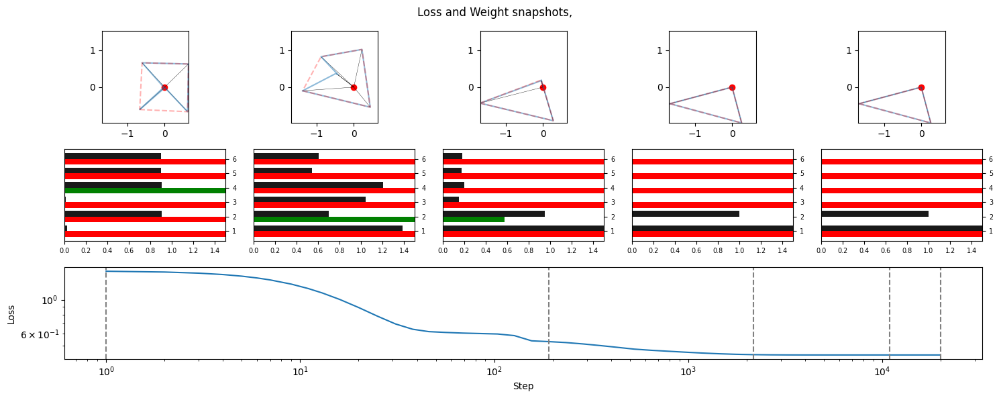

Loss: 0.4357096254825592
index: 100


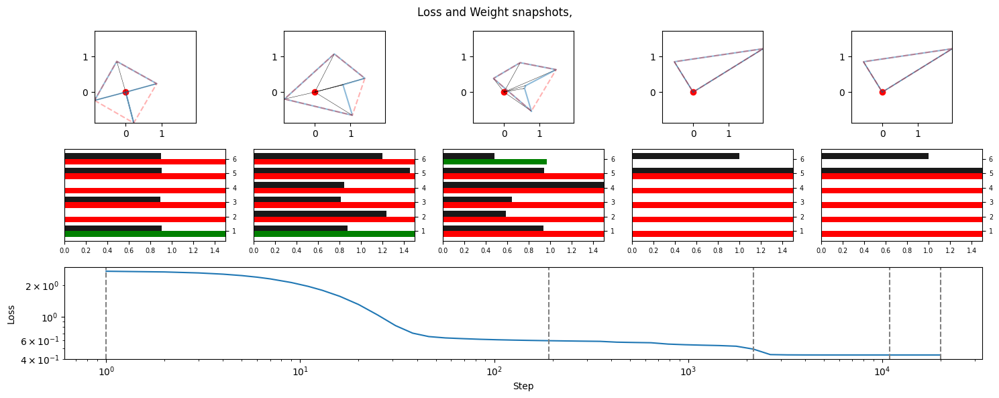

Loss: 0.4378255307674408
index: 102


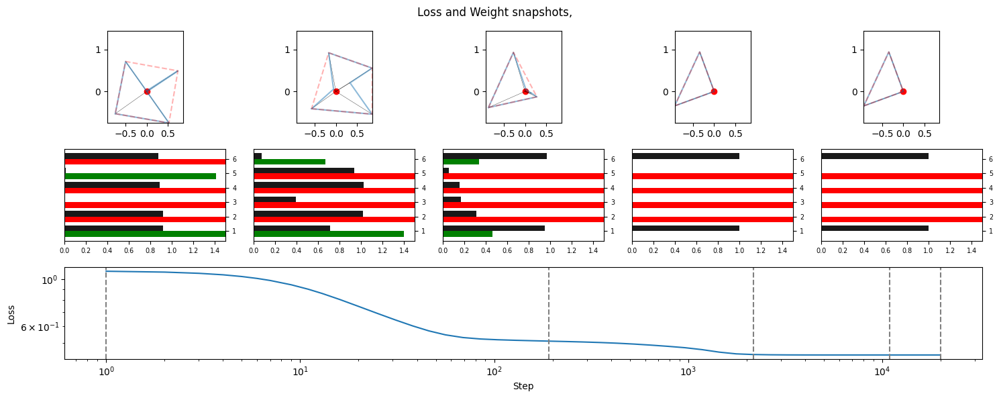

Loss: 0.4261067807674408
index: 162


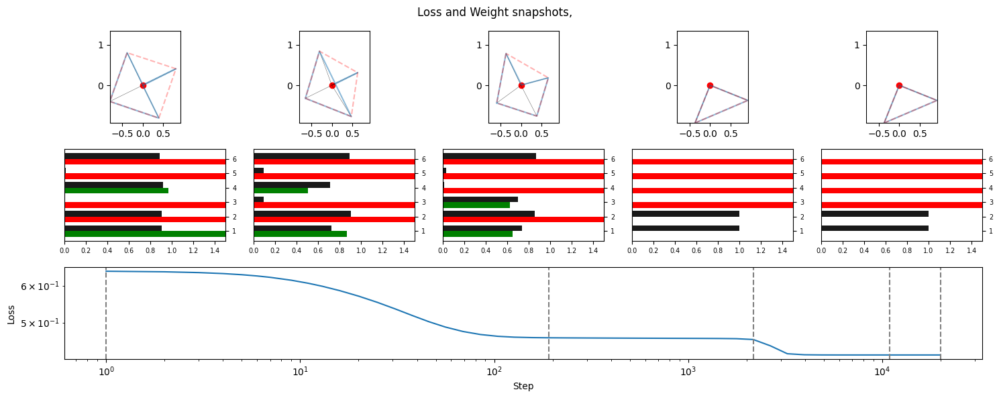

Loss: 0.4326171875
index: 186


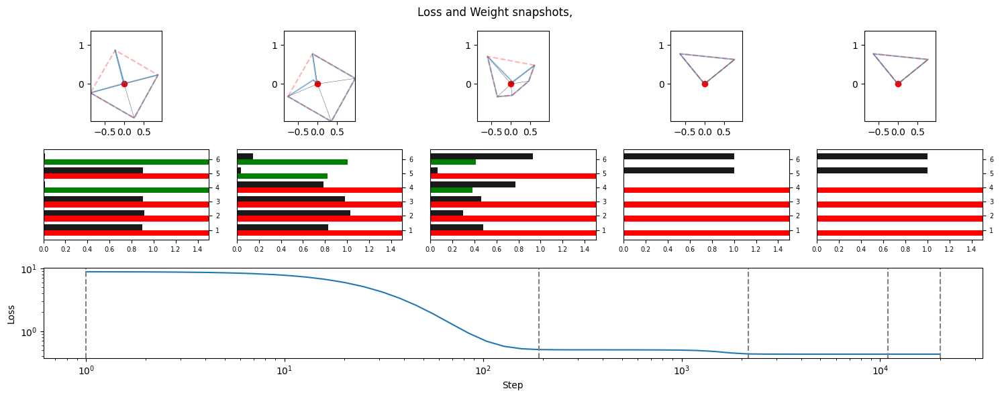

Loss: 0.4249674379825592
index: 193


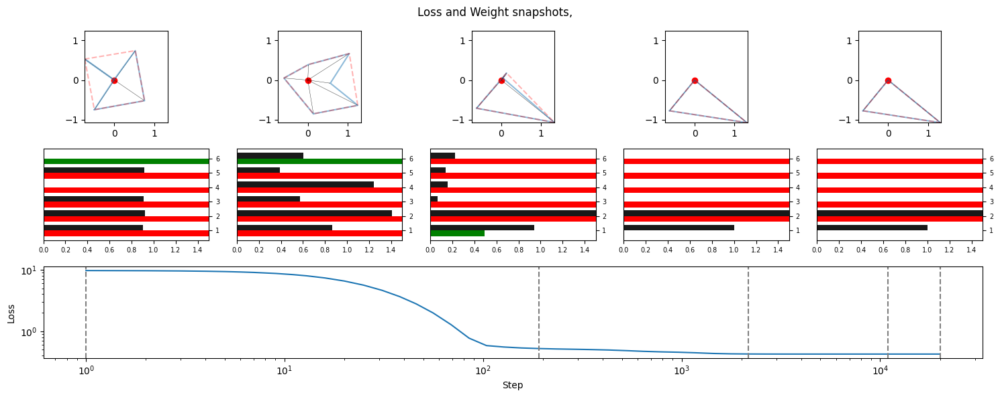

In [24]:
plot_results(results_random_init, plot_number=20, loss_window=(.4,.45), sparsities=[0.426])

Plot polygons for sparsity=0.426
Loss: 0.39389440417289734
index: 25


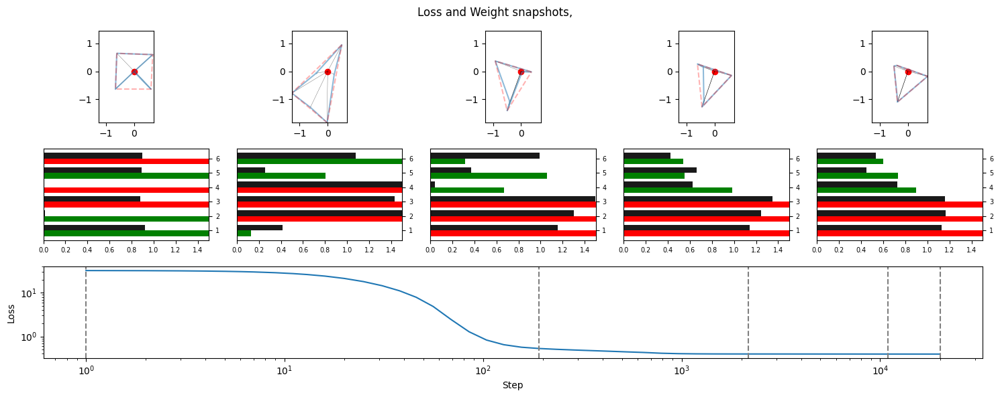

Loss: 0.39728617668151855
index: 69


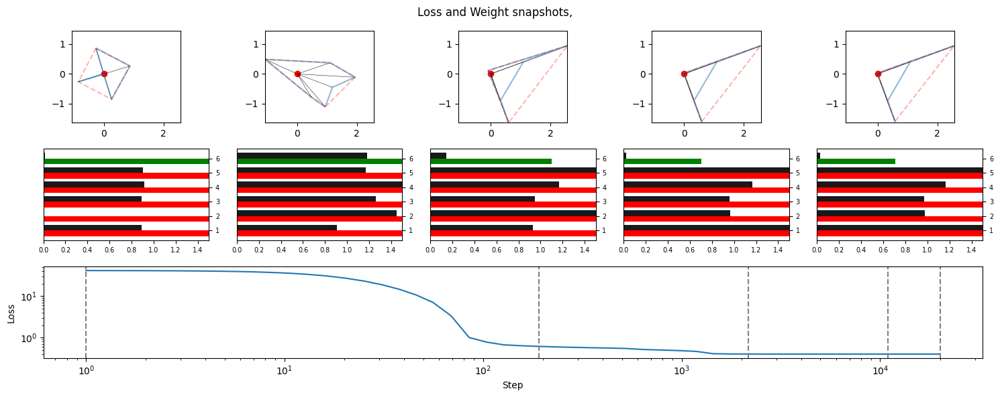

Loss: 0.39689159393310547
index: 158


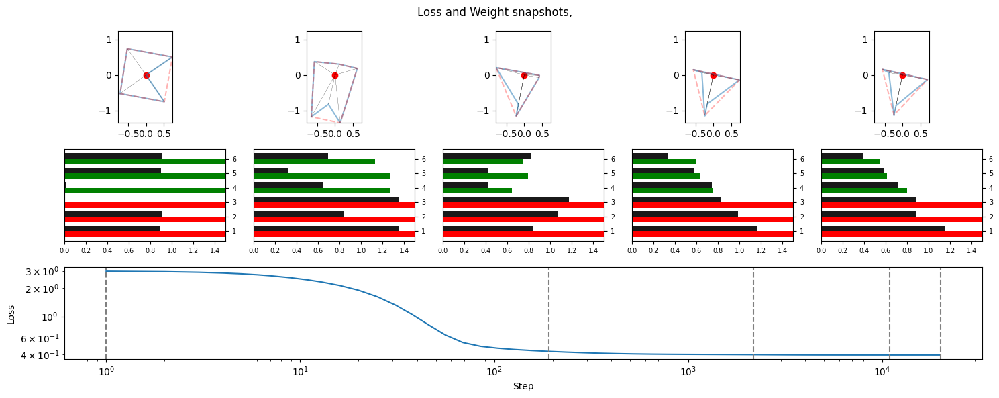

In [25]:
plot_results(results_random_init, plot_number=5, loss_window=(.375,.4), sparsities=[0.426])

In [26]:
plot_results(results_random_init, plot_number=1, loss_window=(0, 0.1375), sparsities=[0.426])

Plot polygons for sparsity=0.426


I am trying to see what types of solutions we see. Especially, I want to see the first non-sparse solution that does not look like the optimal solution. perhaps it would also help if we computed if the optimal solution was still useful.

Plot polygons for sparsity=0.938
Loss: 0.07962816208600998
index: 800


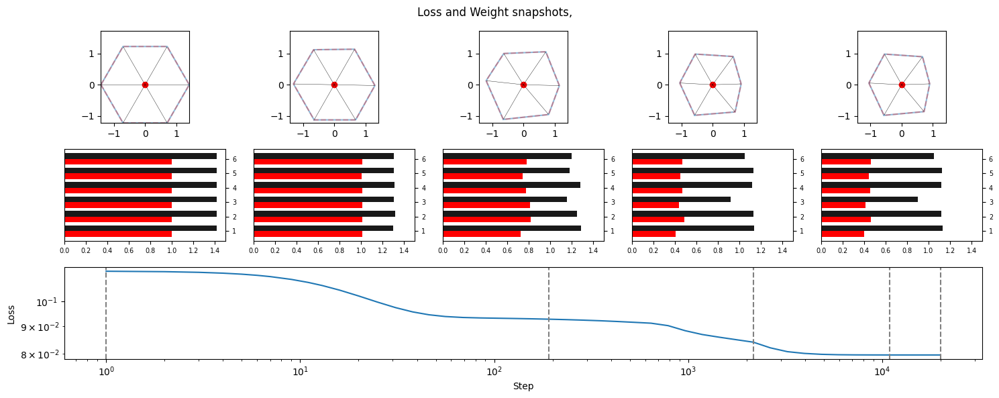

Loss: 0.06650777906179428
index: 801


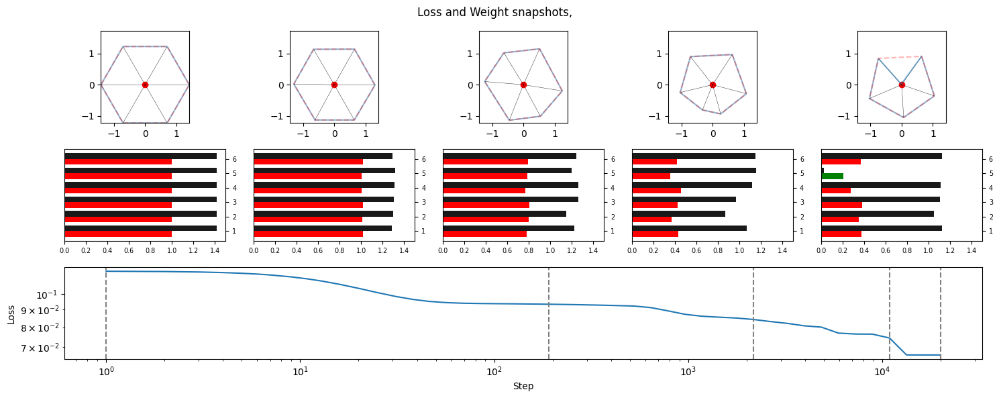

In [27]:
plot_results(results_optimal_init, plot_number=2, loss_window=(0, 1), sparsities=[0.938])

Plot polygons for sparsity=0.993
Loss: 0.016013309359550476
index: 1600


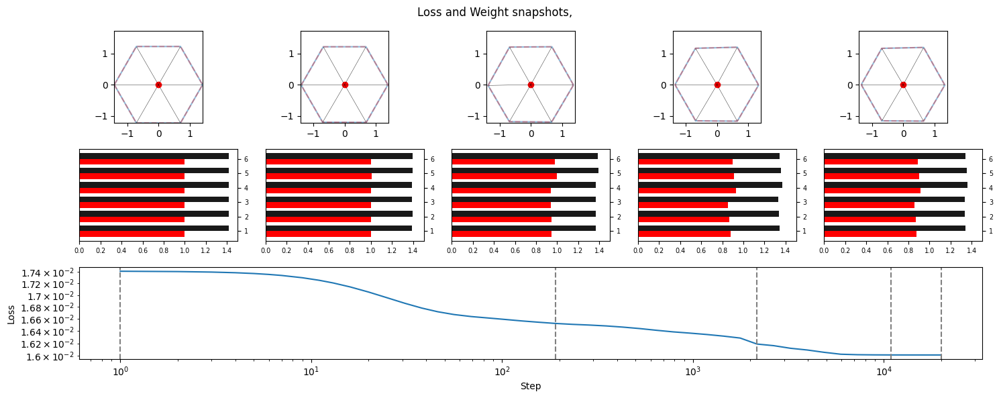

Loss: 0.01543294358998537
index: 1601


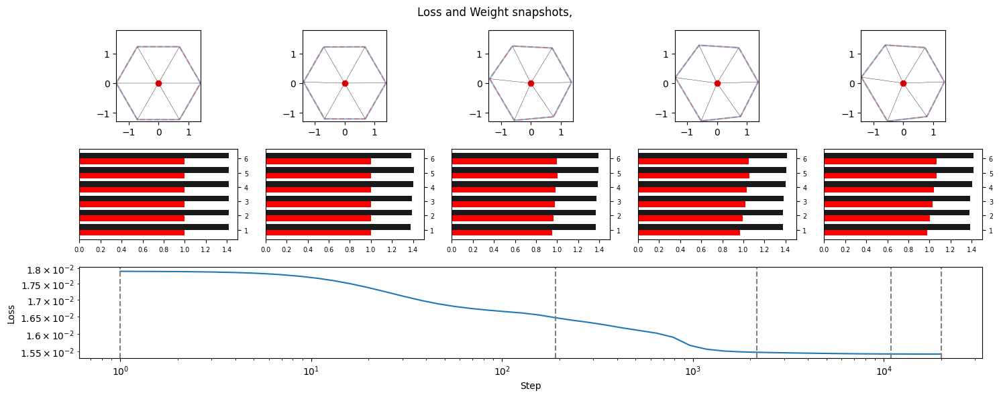

Plot polygons for sparsity=1
Loss: 3.518522417866876e-10
index: 1800


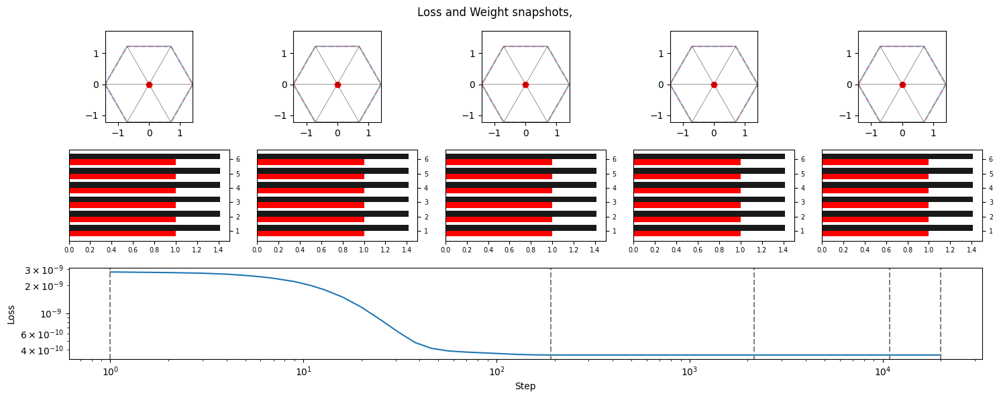

Loss: 3.4814687244200115e-10
index: 1801


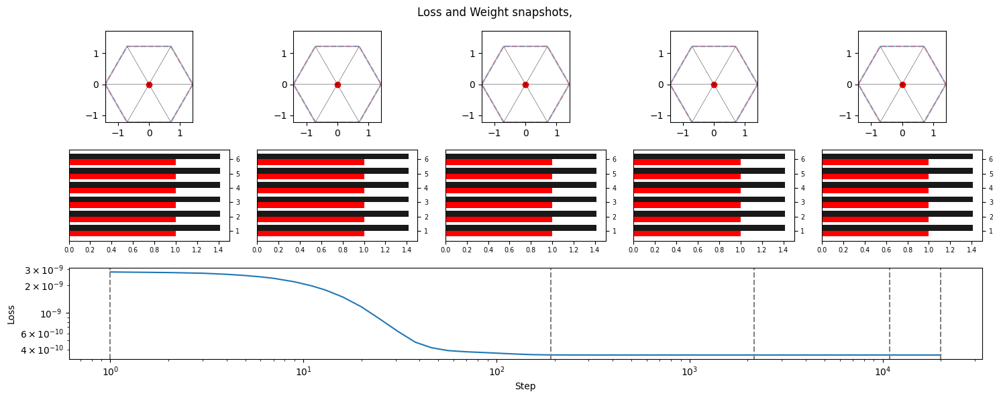

In [28]:

plot_results(results_optimal_init, plot_number=2, loss_window=(0, 1), sparsities=[0.993, 1])

In [29]:
plot_results(results_1_13, plot_number=5, loss_window=(.63), sparsities=[0.426])

Plot polygons for sparsity=0.426


TypeError: 'float' object is not subscriptable

In [37]:
def calculate_convex_hull_vertices(W):

    """
    Calculate the number of vertices of the convex hull of the points represented by the columns of W.
    
    Parameters:
    W (torch.Tensor): A 2xN matrix where each column represents a point in 2D space.
    
    Returns:
    int: The number of vertices of the convex hull.
    """
    if W.shape[0] != 2:
        raise ValueError("The weight matrix W must have 2 rows.")
    
    # Convert the tensor to a numpy array if it isn't already
    if isinstance(W, torch.Tensor):
        W = W.cpu().detach().numpy()
    
    hull = ConvexHull(W.T)
    return len(hull.vertices)  # The number of vertices is the same as the number of edges

def count_kgons(W):
    edge_counts = {}
    
    # Process each weight matrix
    for full_w in W:
        num_edges = classify_kgon(full_w)
        if num_edges in edge_counts:
            edge_counts[num_edges] += 1
        else:
            edge_counts[num_edges] = 1

    return edge_counts

def classify_5_gon(W, b, differentiate_5_plus=False):
    """
    Classify a 5-gon based on the weights and biases. 
    """

    # Convert tensor to numpy if it isn't already
    if isinstance(W, torch.Tensor):
        W = W.cpu().detach().numpy()
    
    if W.shape[0] == 2:
        W = W.T

    # Compute the convex hull
    hull = ConvexHull(W)
    
    # Check if the number of vertices is equal to 5
    if len(hull.vertices) != 5:
        return "not a 5-gon"
    
    # Convert biases to a numpy array if it isn't already
    if isinstance(b, torch.Tensor):
        b = b.cpu().detach().numpy()


    # Check if any of the non-vertex biases are large negative
    non_vertex_biases = np.delete(b, hull.vertices)

    # Check for any positive bias that is not part of the convex hull vertices
    non_hull_positive_bias = np.any(non_vertex_biases > 0)

    if not non_hull_positive_bias:
        return 5
    elif non_hull_positive_bias and differentiate_5_plus:
        return "5+"
    elif non_hull_positive_bias and not differentiate_5_plus:
        return 5
    else:

        return 'not a 5-gon'



def classify_kgon(W):
    embedding_w = W["embedding.weight"]
    edges = calculate_convex_hull_vertices(embedding_w)
    if edges == 5:
        return classify_5_gon(embedding_w, W["unembedding.bias"])
    return edges

In [38]:
def calculate_kgon_percentages(results, step =-1, sparsities= [0.426, 0.671, 0.811, 0.892, 0.938, 0.964, 0.98 , 0.988, 0.993], epsilon=0.001):
    # loss_hist = []
    for sparse_value in sparsities:
        plotted =0
        print(f"Plot polygons for sparsity={sparse_value}")
        weights = []

        STEPS = results[0]['parameters']['log_ivl']
        NUM_EPOCHS = 20000
        PLOT_STEPS = [min(STEPS, key=lambda s: abs(s-i)) for i in [0, 200, 2000, 10000, NUM_EPOCHS - 1]]
        PLOT_INDICES = [STEPS.index(s) for s in PLOT_STEPS]
        for PLOT_INDEX in range(len(STEPS)):
            weights = []
            for index in range(len(results)):
                non_matching_sparsity = abs(results[index]['parameters']['sparsity'] - sparse_value) > epsilon
                if non_matching_sparsity:
                    continue


                # Ws = [results[index]['weights'][i]['embedding.weight'] for i in PLOT_INDICES]
                # weights = [results[index]['weights'][i] for i in PLOT_INDICES]

                
                weights.append(results[index]['weights'][PLOT_INDEX])
            print(count_kgons(weights))

            


In [39]:
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter

def plot_kgon_percentages(results, sparsities=[0.426, 0.671, 0.811, 0.892, 0.938, 0.964, 0.98, 0.988, 0.993], epsilon=0.001):
    STEPS = results[0]['parameters']['log_ivl']
    NUM_EPOCHS = 20000
    PLOT_STEPS = [min(STEPS, key=lambda s: abs(s - i)) for i in [0, 200, 2000, 10000, NUM_EPOCHS - 1]]
    PLOT_INDICES = [STEPS.index(s) for s in PLOT_STEPS]

    for sparse_value in sparsities:
        print(f"Processing sparsity = {sparse_value}")
        kgon_frequencies = []

        for step_idx in PLOT_INDICES:
            weights_at_step = []
            for result in results:
                if abs(result['parameters']['sparsity'] - sparse_value) > epsilon:
                    continue
                weights_at_step.append(result['weights'][step_idx])

            # Count kgons
            counts = count_kgons(weights_at_step)
            total = sum(counts.values())
            frequencies = {k: v / total * 100 for k, v in counts.items()}
            kgon_frequencies.append(frequencies)

        # Normalize keys (ensure all k-gon types are present in each step)
        all_kgons = sorted(set(k for freqs in kgon_frequencies for k in freqs))
        for freqs in kgon_frequencies:
            for k in all_kgons:
                freqs.setdefault(k, 0)

        # Convert to plot format
        plot_data = {k: [freqs[k] for freqs in kgon_frequencies] for k in all_kgons}

        # Plot
        plt.figure()
        for k, values in plot_data.items():
            plt.plot(PLOT_STEPS, values, label=f'{k}-gon')
        plt.title(f'% Frequency of k-gons over training steps\n(sparsity={sparse_value})')
        plt.xlabel('Training Step')
        plt.ylabel('Percentage Frequency')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.savefig(f'kgon_frequencies_sparsity_{sparse_value}.png', dpi=300)
        plt.show()


Processing sparsity = 0.426


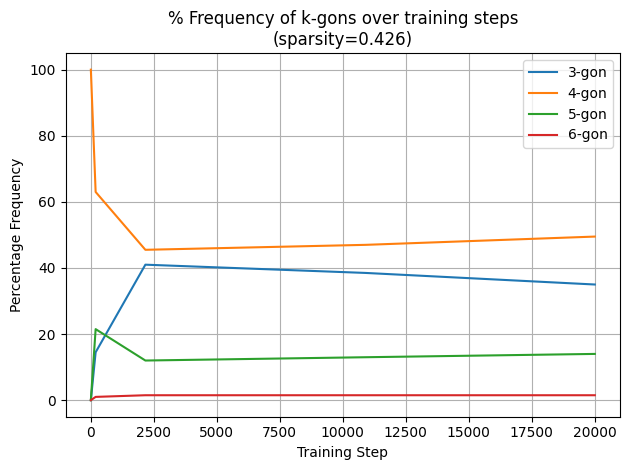

Processing sparsity = 0.671


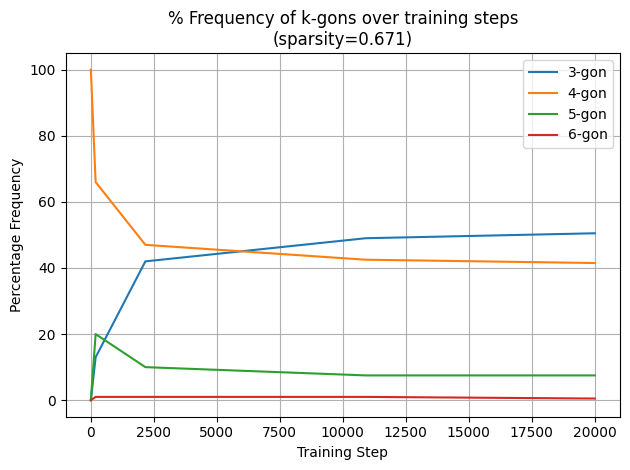

Processing sparsity = 0.811


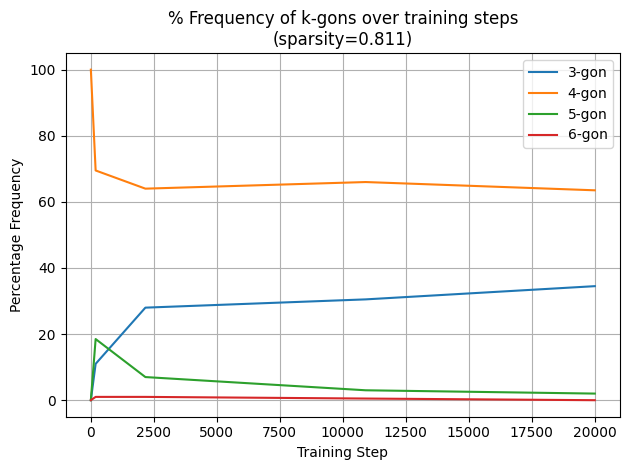

Processing sparsity = 0.892


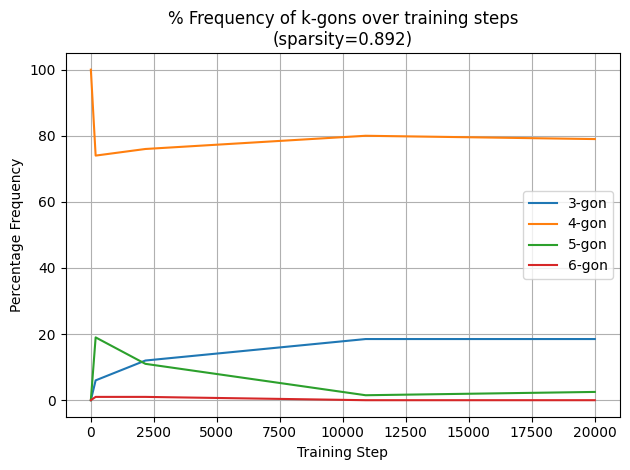

Processing sparsity = 0.938


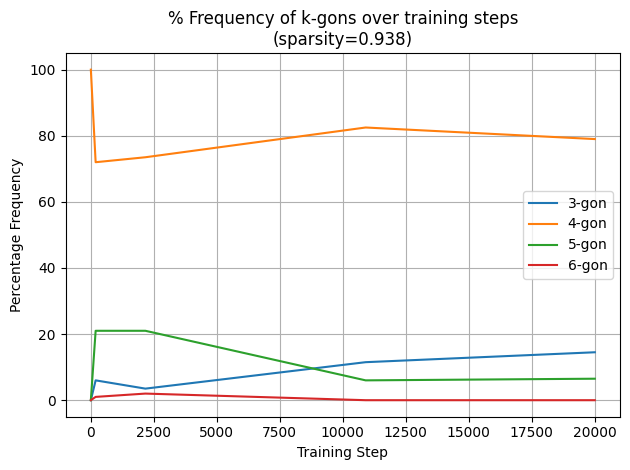

Processing sparsity = 0.964


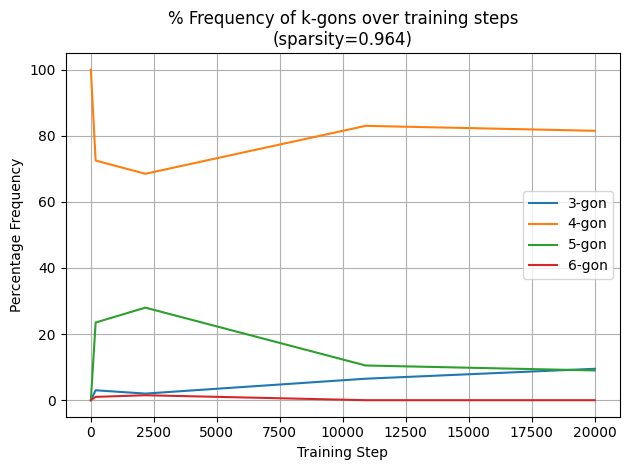

Processing sparsity = 0.98


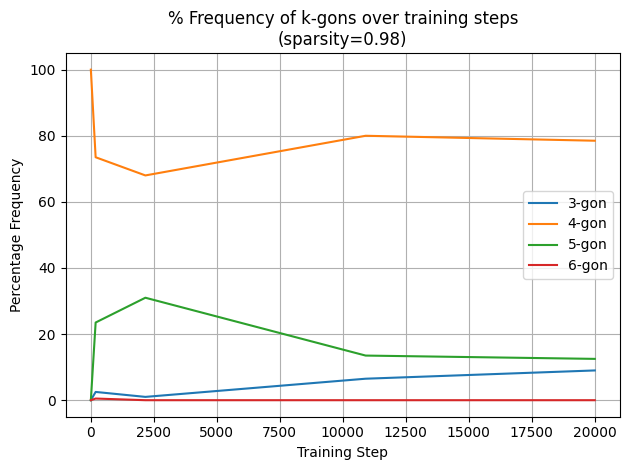

Processing sparsity = 0.988


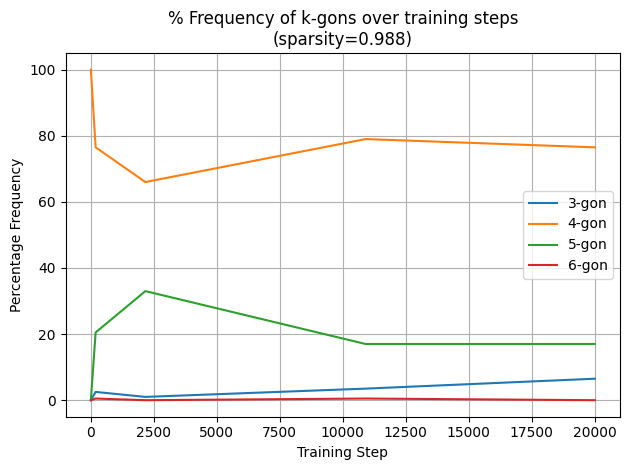

Processing sparsity = 0.993


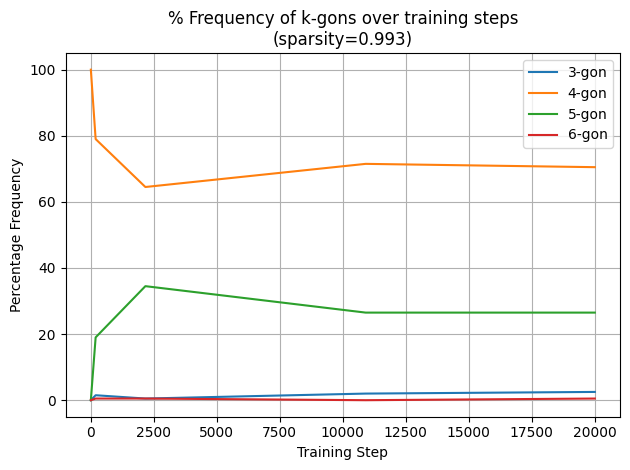

In [40]:
plot_kgon_percentages(
    results_1_13
)

Processing sparsity = 0.426


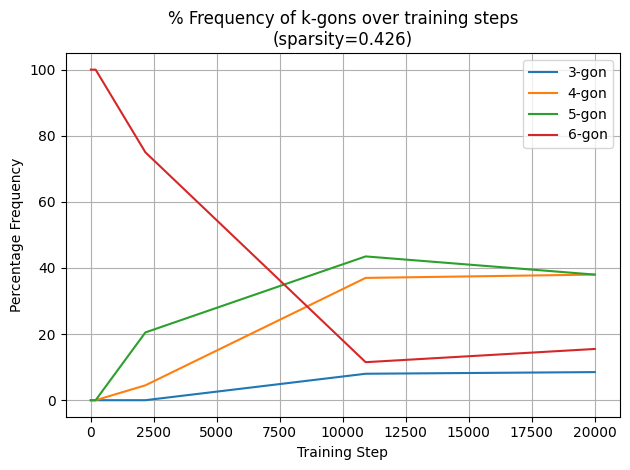

Processing sparsity = 0.671


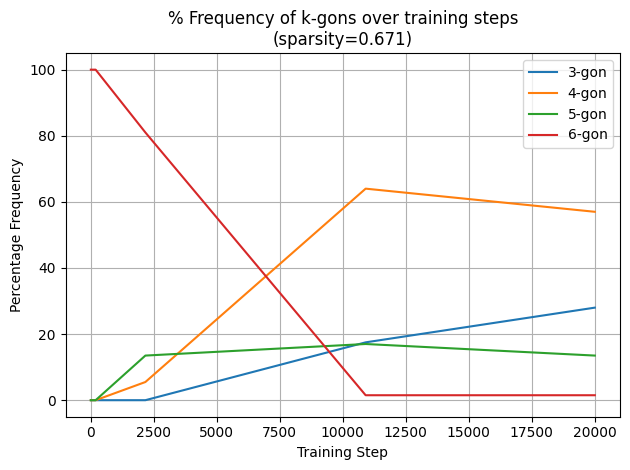

Processing sparsity = 0.811


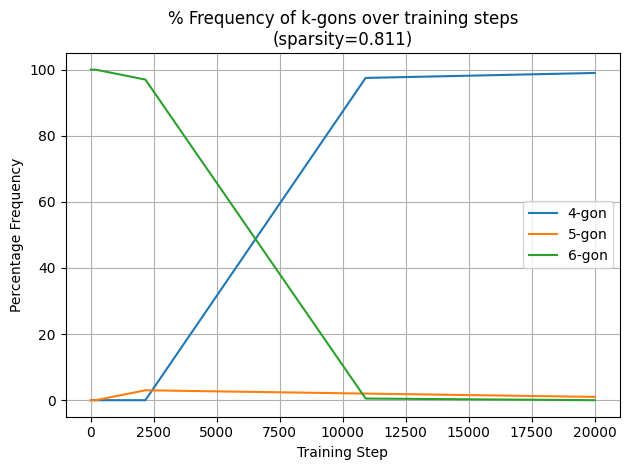

Processing sparsity = 0.892


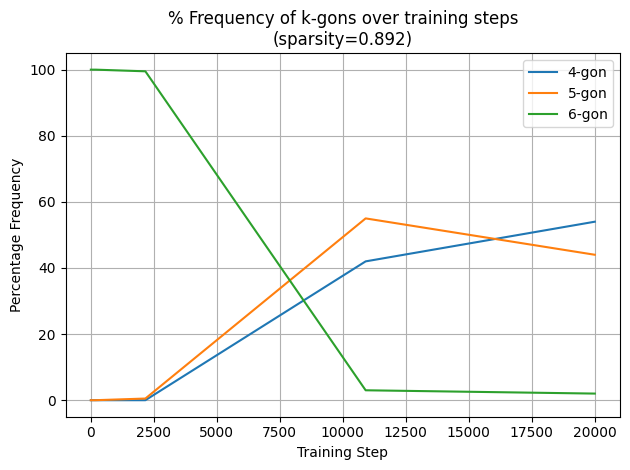

Processing sparsity = 0.938


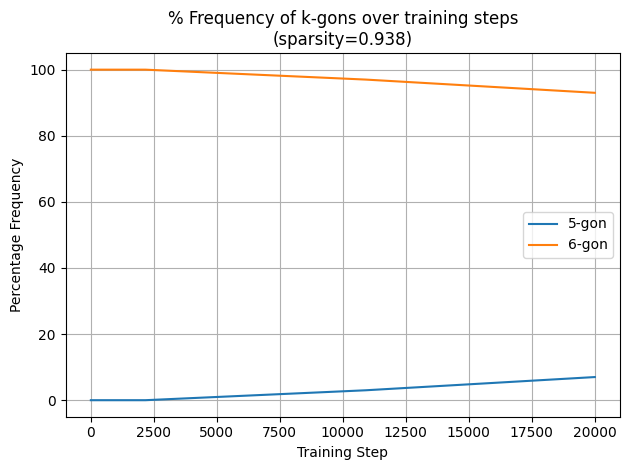

Processing sparsity = 0.964


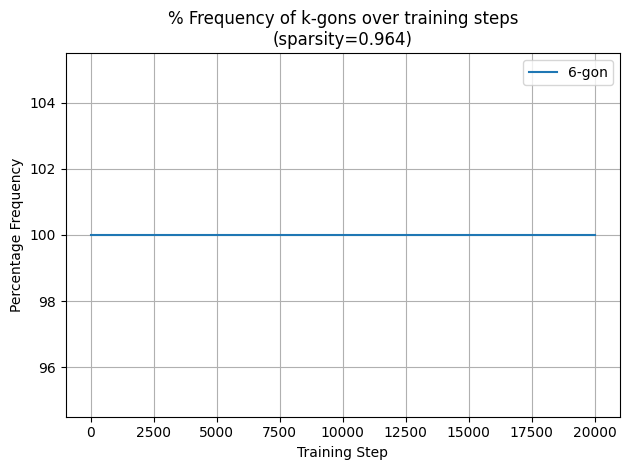

Processing sparsity = 0.98


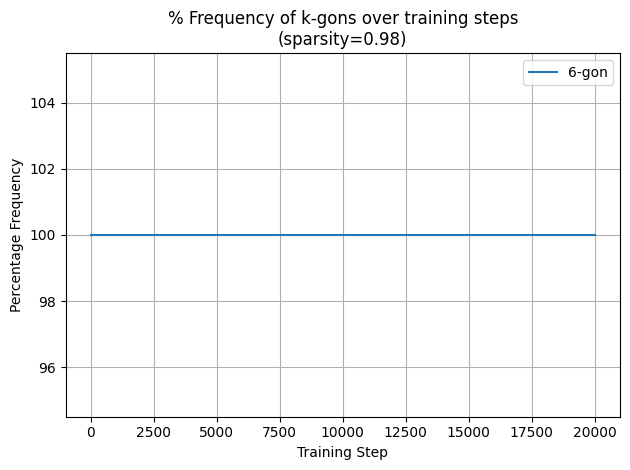

Processing sparsity = 0.988


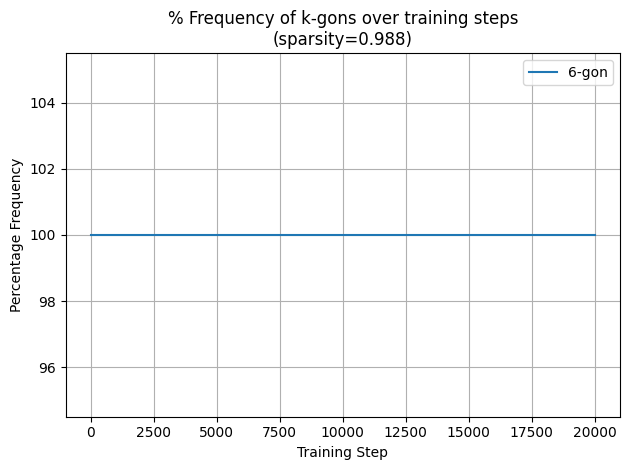

Processing sparsity = 0.993


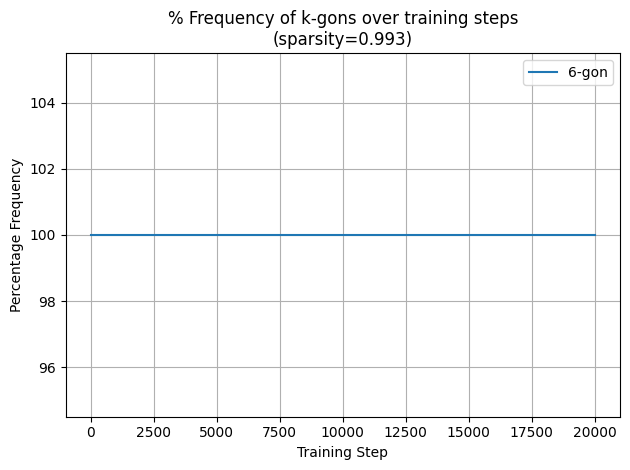

In [41]:
plot_kgon_percentages(
    results_optimal_init
)

In [42]:
def generate_2d_kgon_vertices(k, rot=0., pad_to=None, force_length=0.9):
    """Set the weights of a 2D k-gon to be the vertices of a regular k-gon."""
    # Angles for the vertices
    theta = np.linspace(0, 2*np.pi, k, endpoint=False) + rot

    # Generate the vertices
    x = np.cos(theta)
    y = np.sin(theta)
    result = np.vstack((x, y))

    if pad_to is not None and k < pad_to:
        num_pad = pad_to - k
        result = np.hstack([result, np.zeros((2, num_pad))])

    return (result * force_length)

def generate_init_param(m, n, init_kgon, prior_std=1., no_bias=True, init_zerobias=True, seed=0, force_negb=False, noise=0.01):
    np.random.seed(seed)

    if init_kgon is None or m != 2:
        init_W = np.random.normal(size=(m, n)) * prior_std
    else:
        assert init_kgon <= n
        rand_angle = np.random.uniform(0, 2 * np.pi, size=(1,))
        noise = np.random.normal(size=(m, n)) * noise
        init_W = generate_2d_kgon_vertices(init_kgon, rot=rand_angle, pad_to=n) + noise

    if no_bias:
        param = {"W": init_W}
    else:
        init_b = np.random.normal(size=(n, 1)) * prior_std
        if force_negb:
            init_b = -np.abs(init_b)
        if init_zerobias:
            init_b = init_b * 0
        param = {
            "W": init_W,
            "b": init_b
        }
    return param

def generate_optimal_solution(m,n,rot=0.0):
    assert m == 2
    assert n==6 # Possibly implement other values of n later. See page 46 of dynamical bayseanism paper and code that automatically finds solution(s).
    # Solutions exist for multiples of 4 and 5,6 and 7
    if n == 6:
        l =1.4142 # confusion: I get as the optimal parameter for the length: 1.4142, but the paper says 1.32053
        init_b = - np.ones((n,1)) *0.9999 # confusion: I get through training, that the optimal bias is -0.9999 instead of 0.61814
        

    init_w = generate_2d_kgon_vertices(n, rot=rot, force_length=l, pad_to=n)
    param = {
        "W": init_w,
        "b": init_b
    }
    return param

In [43]:

m = 6
n = 2
l = 1.4142
b = -1

w = torch.from_numpy(generate_2d_kgon_vertices(m, rot=0., force_length=l, pad_to=m)).float()
bias = torch.ones((m)) * b

sample = torch.tensor([1,0,0,0,0,0]).float()

print(sample)
output =(w.T  @ ( w @ sample)) + b
print(output)



tensor([1., 0., 0., 0., 0., 0.])
tensor([ 9.9996e-01, -1.9252e-05, -2.0000e+00, -3.0000e+00, -2.0000e+00,
        -1.9252e-05])


In [44]:
model = lambda w, b: (lambda sample:(torch.Tensor(w).T  @ ( torch.Tensor(w) @ torch.Tensor(sample))) + torch.Tensor(b))

In [45]:
from tms.data.dataset import SyntheticBinarySparseValued

In [46]:
dataset = SyntheticBinarySparseValued(num_samples=1000, num_features=6, sparsity=0.42)

In [47]:
dataset[0]

tensor([1., 1., 0., 1., 1., 0.])

In [48]:
w, b = get_weights(results_1_13, 0)

In [49]:
sample = torch.tensor([1,0,0,0,0,0]).float()

Plotting index 0
Sparsity: 0.426
Loss at step -1: 0.18979541957378387


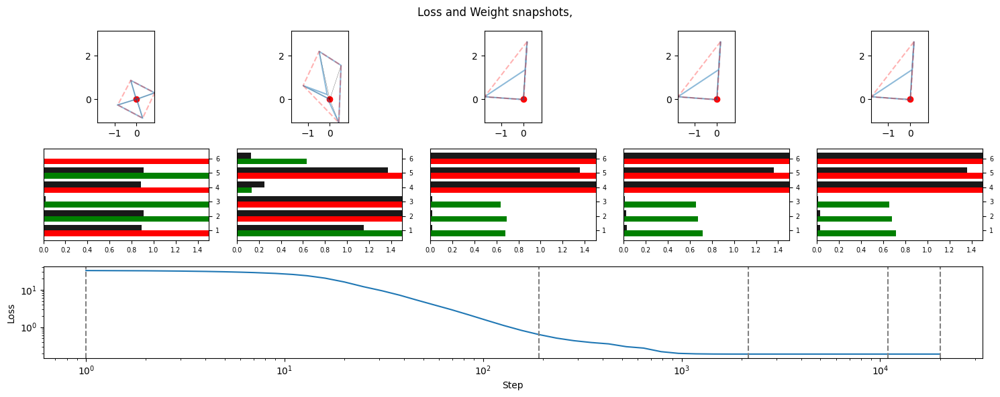

In [50]:
plot_specific_index(results_1_13, 0)

How do I qualify this solution? I guess we have the loss space:
params -> loss (given dataset)
We could also look at given 

In [51]:
model(w,b)(dataset[0])

tensor([ 0.9958,  0.6464, -0.8326,  0.6388, -2.5673,  0.6340])

In [77]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

def get_weights(results, index, step=-1):
    """
    Get the weights of a model at a specific index and timestep.
    """
    if index >= len(results):
        raise IndexError(f"Index {index} out of range for results of length {len(results)}")
    
    weights_list = results[index]['weights']
    
    if step >= len(weights_list):
        raise IndexError(f"Step {step} out of range for weights list of length {len(weights_list)}")
    
    weights = weights_list[step]
    embedding_weight = torch.from_numpy(weights['embedding.weight']).float()
    unembedding_bias = torch.from_numpy(weights['unembedding.bias']).float()
    
    return embedding_weight, unembedding_bias

def test_get_weights(results):
    """Test the get_weights function"""
    print("=== Testing get_weights ===")
    try:
        W, b = get_weights(results, 0)
        print(f"✓ Model 0 weights shape: {W.shape}, bias shape: {b.shape}")
        
        W2, b2 = get_weights(results, 1)
        print(f"✓ Model 1 weights shape: {W2.shape}, bias shape: {b2.shape}")
        
        # Test that different models have different weights
        weights_different = not torch.allclose(W, W2)
        print(f"✓ Different models have different weights: {weights_different}")
        
        return True
    except Exception as e:
        print(f"✗ Error: {e}")
        return False

def autoencoder_forward(input_vec, W, b):
    """
    Single forward pass: output = W.T @ (W @ input_vec) + b
    
    W is shape (2, 6) - encoder weights
    For autoencoder: encode with W, decode with W.T
    """
    # W is (2, 6), input_vec is (6,)
    # Encode: W @ input_vec 
    encoded = W @ input_vec    # (2, 6) @ (6,) = (2,)
    # Decode: W.T @ encoded
    decoded = W.T @ encoded    # (6, 2) @ (2,) = (6,)
    # Add bias
    output = torch.relu(decoded + b)       # (6,) + (6,) = (6,)
    return output

def test_autoencoder_forward():
    """Test the autoencoder forward pass"""
    print("\n=== Testing autoencoder_forward ===")
    
    # Create test data with correct dimensions
    W = torch.randn(2, 6)  # Encoder weights: (latent_dim, input_dim)
    b = torch.randn(6)     # Bias for reconstruction
    input_vec = torch.tensor([1., 0., 0., 0., 0., 0.])
    
    try:
        output = autoencoder_forward(input_vec, W, b)
        print(f"✓ Forward pass successful, output shape: {output.shape}")
        
        # Test with different input
        input_vec2 = torch.tensor([0., 1., 0., 0., 0., 0.])
        output2 = autoencoder_forward(input_vec2, W, b)
        
        # Outputs should be different for different inputs
        outputs_different = not torch.allclose(output, output2)
        print(f"✓ Different inputs give different outputs: {outputs_different}")
        
        return True
    except Exception as e:
        print(f"✗ Error: {e}")
        return False

def generate_all_inputs():
    """Generate all 64 possible 6-bit binary inputs"""
    all_inputs = []
    for i in range(64):
        binary = format(i, '06b')
        input_vec = torch.tensor([float(int(b)) for b in binary])
        all_inputs.append(input_vec)
    return all_inputs

def test_generate_all_inputs():
    """Test input generation"""
    print("\n=== Testing generate_all_inputs ===")
    
    inputs = generate_all_inputs()
    print(f"✓ Generated {len(inputs)} inputs")
    
    # Check first few
    print(f"✓ Input 0: {inputs[0].numpy()}")  # Should be [0,0,0,0,0,0]
    print(f"✓ Input 1: {inputs[1].numpy()}")  # Should be [0,0,0,0,0,1]
    print(f"✓ Input 63: {inputs[63].numpy()}")  # Should be [1,1,1,1,1,1]
    
    # Check all are different
    unique_inputs = len(set([tuple(inp.numpy()) for inp in inputs]))
    print(f"✓ All inputs unique: {unique_inputs == 64}")
    
    return inputs

def create_loss_matrix_simple(results, max_models=200, step=-1):
    """
    Create loss matrix for first max_models models only
    """
    print(f"\n=== Creating loss matrix for first {max_models} models ===")
    
    # Generate all inputs
    all_inputs = generate_all_inputs()
    
    # Limit to first max_models
    num_models = min(max_models, len(results))
    print(f"Processing {num_models} models...")
    
    # Initialize loss matrix
    loss_matrix = torch.zeros(64, num_models)
    sparsities = []
    
    for model_idx in range(num_models):
        if model_idx % 50 == 0:
            print(f"Processing model {model_idx}...")
            
        try:
            # Get model weights
            W, b = get_weights(results, model_idx, step)
            sparsities.append(results[model_idx]['parameters']['sparsity'])
            
            # Compute loss for all 64 inputs
            for input_idx, input_vec in enumerate(all_inputs):
                output = autoencoder_forward(input_vec, W, b)
                mse_loss = torch.mean((output - input_vec) ** 2)
                loss_matrix[input_idx, model_idx] = mse_loss
                
        except Exception as e:
            print(f"Error processing model {model_idx}: {e}")
            loss_matrix[:, model_idx] = float('nan')
            sparsities.append(float('nan'))
    
    return loss_matrix.numpy(), all_inputs, np.array(sparsities)

def test_loss_matrix(results):
    """Test loss matrix creation"""
    print("\n=== Testing loss matrix creation ===")
    
    # Test with just 3 models first
    loss_matrix, inputs, sparsities = create_loss_matrix_simple(results, max_models=3)
    
    print(f"✓ Loss matrix shape: {loss_matrix.shape}")
    print(f"✓ Sparsities shape: {sparsities.shape}")
    
    # Check for variation
    loss_variance_across_models = np.var(loss_matrix, axis=1)
    loss_variance_across_inputs = np.var(loss_matrix, axis=0)
    
    print(f"✓ Loss variance across models (first 5): {loss_variance_across_models[:5]}")
    print(f"✓ Loss variance across inputs (all 3): {loss_variance_across_inputs}")
    
    # Check if we have variation (not all zeros/identical)
    has_model_variation = np.any(loss_variance_across_models > 0.001)
    has_input_variation = np.any(loss_variance_across_inputs > 0.001)
    
    print(f"✓ Has variation across models: {has_model_variation}")
    print(f"✓ Has variation across inputs: {has_input_variation}")
    
    return loss_matrix, inputs, sparsities

def visualize_first_sparsity(results, max_models=200):
    """
    Visualize the first sparsity group (first 200 models)
    """
    print(f"\n=== Visualizing first {max_models} models ===")
    
    # Create loss matrix
    loss_matrix, inputs, sparsities = create_loss_matrix_simple(results, max_models)
    
    # Remove any NaN models
    valid_models = ~np.isnan(loss_matrix).any(axis=0)
    loss_matrix = loss_matrix[:, valid_models]
    sparsities = sparsities[valid_models]
    
    print(f"Valid models: {valid_models.sum()}/{max_models}")
    
    if valid_models.sum() < 2:
        print("Not enough valid models for visualization")
        return
    
    # Create visualization
    fig, axes = plt.subplots(2, 2, figsize=(12, 8))
    
    # 1. Loss matrix heatmap
    ax = axes[0, 0]
    im = ax.imshow(loss_matrix, aspect='auto', cmap='viridis')
    ax.set_title(f'Loss Matrix (64 inputs × {valid_models.sum()} models)')
    ax.set_xlabel('Model Index')
    ax.set_ylabel('Input Index')
    plt.colorbar(im, ax=ax, label='Loss')
    
    # 2. PCA of models
    ax = axes[0, 1]
    if loss_matrix.shape[1] >= 2:
        pca = PCA(n_components=2)
        model_pca = pca.fit_transform(loss_matrix.T)
        
        scatter = ax.scatter(model_pca[:, 0], model_pca[:, 1], c=sparsities, cmap='plasma', alpha=0.7)
        ax.set_title(f'PCA of Models (var: {pca.explained_variance_ratio_.sum():.2f})')
        ax.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.2f})')
        ax.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.2f})')
        plt.colorbar(scatter, ax=ax, label='Sparsity')
    
    # 3. Input discrimination
    ax = axes[1, 0]
    input_variance = np.var(loss_matrix, axis=1)
    bars = ax.bar(range(64), input_variance)
    
    # Highlight top 5 discriminative inputs
    top_discriminative = np.argsort(input_variance)[-5:]
    for idx in top_discriminative:
        bars[idx].set_color('red')
    
    ax.set_title('Input Discrimination Power')
    ax.set_xlabel('Input Index')
    ax.set_ylabel('Loss Variance Across Models')
    
    # 4. Sample losses across models
    ax = axes[1, 1]
    # Plot losses for a few sample inputs
    sample_inputs = [0, 1, 31, 63]  # Binary: 000000, 000001, 011111, 111111
    for inp_idx in sample_inputs:
        if inp_idx < loss_matrix.shape[0]:
            binary = format(inp_idx, '06b')
            ax.plot(loss_matrix[inp_idx, :], label=f'Input {inp_idx} ({binary})', alpha=0.7)
    
    ax.set_title('Loss Patterns for Sample Inputs')
    ax.set_xlabel('Model Index')
    ax.set_ylabel('Loss')
    ax.legend()
    
    plt.tight_layout()
    plt.show()
    
    # Print analysis
    print(f"\nSparsity range: {sparsities.min():.3f} to {sparsities.max():.3f}")
    print(f"Loss range: {loss_matrix.min():.4f} to {loss_matrix.max():.4f}")
    
    print(f"\nTop 5 discriminative inputs:")
    for i, idx in enumerate(top_discriminative):
        binary = format(idx, '06b')
        num_ones = binary.count('1')
        print(f"  {i+1}. Input {idx:2d} ({binary}) - {num_ones} ones - var: {input_variance[idx]:.4f}")
    
    return loss_matrix, sparsities

def run_all_tests(results):
    """Run all test functions"""
    print("🧪 Running all tests...\n")
    
    # Test individual functions
    test1 = test_get_weights(results)
    test2 = test_autoencoder_forward()
    test3 = test_generate_all_inputs()
    test4 = test_loss_matrix(results)
    
    print(f"\n📊 Test Results:")
    print(f"✓ get_weights: {test1}")
    print(f"✓ autoencoder_forward: {test2}")
    print(f"✓ generate_all_inputs: {test3}")
    print(f"✓ loss_matrix: {test4}")
    
    if all([test1, test2, test3, test4]):
        print("\n🎉 All tests passed! Running full visualization...")
        return visualize_first_sparsity(results, max_models=2000)  # Pass max_models explicitly
    else:
        print("\n❌ Some tests failed. Fix issues before proceeding.")
        return None

# Example usage:
#loss_matrix, sparsities = run_all_tests(results)

In [90]:
loss_matrices=[]
sparsities=[]
for i in range(10):
    loss_matrix,_, sparsity = create_loss_matrix_simple(results_1_13[i*200:(i+1)*200], 200)
    loss_matrices.append(loss_matrix)
    sparsities.append(sparsity)



=== Creating loss matrix for first 200 models ===
Processing 200 models...
Processing model 0...
Processing model 50...
Processing model 100...
Processing model 150...

=== Creating loss matrix for first 200 models ===
Processing 200 models...
Processing model 0...
Processing model 50...
Processing model 100...
Processing model 150...

=== Creating loss matrix for first 200 models ===
Processing 200 models...
Processing model 0...
Processing model 50...
Processing model 100...
Processing model 150...

=== Creating loss matrix for first 200 models ===
Processing 200 models...
Processing model 0...
Processing model 50...
Processing model 100...
Processing model 150...

=== Creating loss matrix for first 200 models ===
Processing 200 models...
Processing model 0...
Processing model 50...
Processing model 100...
Processing model 150...

=== Creating loss matrix for first 200 models ===
Processing 200 models...
Processing model 0...
Processing model 50...
Processing model 100...
Processing

In [61]:
# def create_dendrogram_visualization(matrix, metric='euclidean', method='ward', 
#                                   title="Dendrogram Clustering", axis=0):
#     """
#     Create a dendrogram visualization where distance between entries 
#     corresponds to the height of branches in the tree.
    
#     Args:
#         matrix: 2D array to cluster
#         metric: distance metric ('correlation', 'cosine', 'euclidean', 'hamming')
#         method: linkage method ('ward', 'complete', 'average', 'single')
#         title: plot title
#         axis: 0 for rows, 1 for columns
#     """
#     from scipy.cluster.hierarchy import dendrogram, linkage
#     from scipy.spatial.distance import pdist
    
#     # Select rows or columns
#     data = matrix if axis == 0 else matrix.T
    
#     # Compute pairwise distances
#     distances = pdist(data, metric=metric)
    
#     # Perform hierarchical clustering
#     Z = linkage(distances, method=method)
    
#     # Create the dendrogram
#     plt.figure(figsize=(12, 8))
    
#     dendrogram(
#         Z,
#         orientation='top',
#         distance_sort='descending',
#         show_leaf_counts=True,
#         leaf_font_size=8,
#         color_threshold=0.7 * max(Z[:, 2])  # Color threshold at 70% of max distance
#     )
    
#     plt.title(f"{title}\n({metric.title()} distance, {method.title()} linkage)")
#     plt.xlabel("Data Index")
#     plt.ylabel("Distance")
    
#     # Add some info
#     n_items = data.shape[0]
#     plt.text(0.02, 0.98, f"n={n_items} {'rows' if axis==0 else 'columns'}", 
#              transform=plt.gca().transAxes, verticalalignment='top',
#              bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
#     plt.tight_layout()
#     plt.show()
    
#     return Z

# def visualize_loss_matrix_dendrograms(loss_matrix):
#     """
#     Create dendrograms for both inputs (rows) and models (columns)
#     of the loss matrix to show clustering patterns.
#     """
#     # Remove any all-NaN rows/columns
#     valid_rows = ~np.isnan(loss_matrix).all(axis=1)
#     valid_cols = ~np.isnan(loss_matrix).all(axis=0)
    
#     clean_matrix = loss_matrix[valid_rows][:, valid_cols]
    
#     print(f"Clustering {clean_matrix.shape[0]} inputs × {clean_matrix.shape[1]} models")
    
#     # Dendrogram for inputs (which inputs have similar loss patterns across models)
#     print("\n=== Clustering Inputs (Rows) ===")
#     Z_inputs = create_dendrogram_visualization(
#         clean_matrix, 
#         metric='correlation',  # Good for loss patterns
#         method='ward',
#         title="Input Clustering: Which inputs have similar loss patterns?",
#         axis=0
#     )
    
#     # Dendrogram for models (which models respond similarly to inputs)  
#     print("\n=== Clustering Models (Columns) ===")
#     Z_models = create_dendrogram_visualization(
#         clean_matrix,
#         metric='correlation', 
#         method='ward', 
#         title="Model Clustering: Which models respond similarly?",
#         axis=1
#     )
    
#     return Z_inputs, Z_models, clean_matrix


In [62]:
# for i,loss_matrix in enumerate(loss_matrices):
#     print(f'Sparsity: {sparsities[i][0]}')
#     create_dendrogram_visualization(loss_matrix.T)

In [63]:
# def optimal_leaf_ordering(matrix, metric='cosine'):
#     """Find optimal ordering that minimizes distance between adjacent elements"""
#     from scipy.cluster.hierarchy import optimal_leaf_ordering, linkage
#     from scipy.spatial.distance import pdist
    
#     # For rows
#     row_distances = pdist(matrix, metric=metric)
#     row_linkage = linkage(row_distances, method='ward')
#     row_order = optimal_leaf_ordering(row_linkage, row_distances)
    
#     # For columns
#     col_distances = pdist(matrix.T, metric=metric) 
#     col_linkage = linkage(col_distances, method='ward')
#     col_order = optimal_leaf_ordering(col_linkage, col_distances)
    
#     return matrix[np.ix_(row_order, col_order)], row_order, col_order

In [67]:
!pip install ipywidgets
!jupyter nbextension enable --py widgetsnbextension

usage: jupyter [-h] [--version] [--config-dir] [--data-dir] [--runtime-dir]
               [--paths] [--json] [--debug]
               [subcommand]

Jupyter: Interactive Computing

positional arguments:
  subcommand     the subcommand to launch

options:
  -h, --help     show this help message and exit
  --version      show the versions of core jupyter packages and exit
  --config-dir   show Jupyter config dir
  --data-dir     show Jupyter data dir
  --runtime-dir  show Jupyter runtime dir
  --paths        show all Jupyter paths. Add --json for machine-readable
                 format.
  --json         output paths as machine-readable json
  --debug        output debug information about paths

Available subcommands: dejavu events execute kernel kernelspec lab
labextension labhub migrate nbconvert run server troubleshoot trust

Jupyter command `jupyter-nbextension` not found.


In [70]:
#%matplotlib widget
# import ipywidgets as widgets
from IPython.display import display


Clustering 64 inputs × 200 models

=== Clustering Inputs (Rows) ===


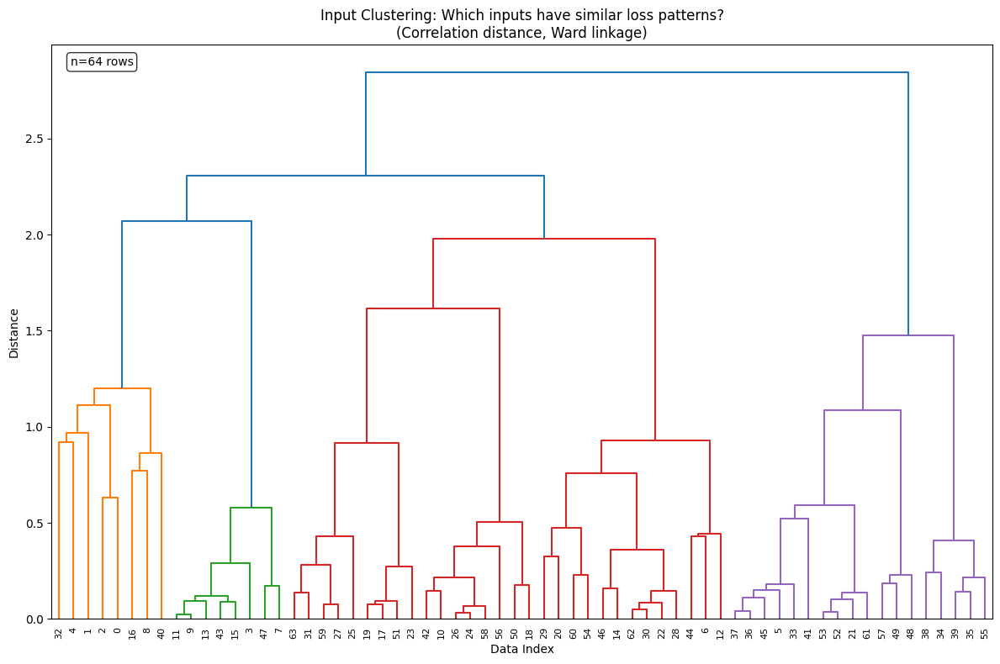


=== Clustering Models (Columns) ===


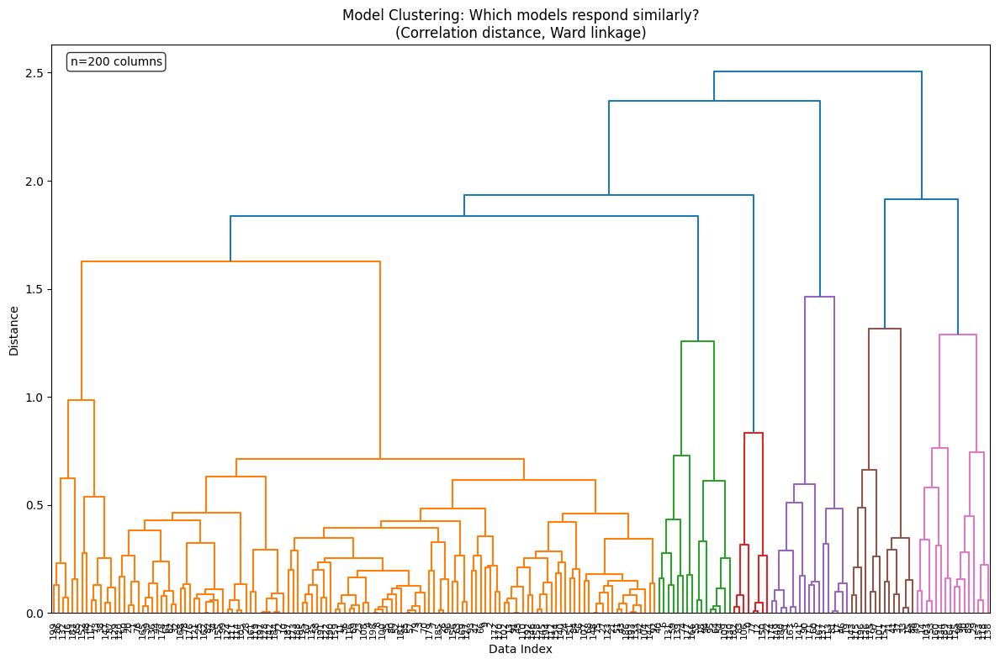

In [71]:
Z_inputs, Z_models, clean_matrix = visualize_loss_matrix_dendrograms(loss_matrix)

import pickle

# Save data for the external tool
with open('dendrogram_data.pkl', 'wb') as f:
    pickle.dump({
        'Z_models': Z_models, 
        'loss_matrix': clean_matrix,
        'sparsities': sparsities
    }, f)
# # Now you can use Z_models for the interactive dendrogram
# interactive_dend = create_interactive_dendrogram(
#     Z_models,      # This comes from visualize_loss_matrix_dendrograms
#     clean_matrix,  # The cleaned loss matrix (no NaN rows/cols)
#     plot_function=my_custom_plot
# )


In [72]:
import numpy as np
from itertools import permutations
import matplotlib.pyplot as plt
from scipy.optimize import linear_sum_assignment
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage, dendrogram
import time

def permutation_invariant_distance_bruteforce(pattern1, pattern2, metric='euclidean'):
    """
    Compute minimum distance between two patterns under all permutations.
    
    For 6 states, this checks all 6! = 720 permutations.
    
    Parameters:
    -----------
    pattern1, pattern2 : array-like, shape (6,)
        Loss patterns for 6 states
    metric : str
        'euclidean', 'manhattan', 'cosine', etc.
    
    Returns:
    --------
    min_distance : float
        Minimum distance under any permutation
    best_permutation : tuple
        The permutation that achieves minimum distance
    """
    pattern1 = np.array(pattern1)
    pattern2 = np.array(pattern2)
    
    min_distance = float('inf')
    best_perm = None
    
    # Try all 6! = 720 permutations
    for perm in permutations(range(len(pattern1))):
        permuted_pattern2 = pattern2[list(perm)]
        
        if metric == 'euclidean':
            dist = np.linalg.norm(pattern1 - permuted_pattern2)
        elif metric == 'manhattan':
            dist = np.sum(np.abs(pattern1 - permuted_pattern2))
        elif metric == 'cosine':
            # Cosine distance = 1 - cosine similarity
            dot_product = np.dot(pattern1, permuted_pattern2)
            norms = np.linalg.norm(pattern1) * np.linalg.norm(permuted_pattern2)
            dist = 1 - (dot_product / norms) if norms > 0 else 0
        elif metric == 'correlation':
            # 1 - absolute correlation (symmetric under sign flip)
            if len(np.unique(pattern1)) > 1 and len(np.unique(permuted_pattern2)) > 1:
                corr = np.corrcoef(pattern1, permuted_pattern2)[0, 1]
                dist = 1 - abs(corr)  # Use absolute correlation for symmetry
            else:
                dist = 1.0  # No variation in one pattern
        else:
            raise ValueError(f"Unknown metric: {metric}")
        
        if dist < min_distance:
            min_distance = dist
            best_perm = perm
    
    return min_distance, best_perm

def permutation_invariant_distance_hungarian(pattern1, pattern2, metric='euclidean'):
    """
    Compute minimum distance using Hungarian algorithm (O(n³)).
    
    This is faster for larger n, but for n=6 brute force is fine.
    """
    pattern1 = np.array(pattern1)
    pattern2 = np.array(pattern2)
    n = len(pattern1)
    
    # Create cost matrix
    cost_matrix = np.zeros((n, n))
    
    for i in range(n):
        for j in range(n):
            if metric == 'euclidean':
                cost_matrix[i, j] = (pattern1[i] - pattern2[j])**2
            elif metric == 'manhattan':
                cost_matrix[i, j] = abs(pattern1[i] - pattern2[j])
            elif metric == 'cosine':
                # For single elements, cosine doesn't make sense
                # Fall back to absolute difference
                cost_matrix[i, j] = abs(pattern1[i] - pattern2[j])
    
    # Solve assignment problem
    row_ind, col_ind = linear_sum_assignment(cost_matrix)
    
    min_cost = cost_matrix[row_ind, col_ind].sum()
    
    if metric == 'euclidean':
        min_distance = np.sqrt(min_cost)
    else:
        min_distance = min_cost
    
    return min_distance, col_ind

def compare_algorithms():
    """Compare brute force vs Hungarian algorithm"""
    # Generate random test patterns
    np.random.seed(42)
    pattern1 = np.random.rand(6)
    pattern2 = np.random.rand(6)
    
    print("Test patterns:")
    print(f"Pattern 1: {pattern1}")
    print(f"Pattern 2: {pattern2}")
    
    # Test different metrics
    metrics = ['euclidean', 'manhattan']
    
    for metric in metrics:
        print(f"\n--- {metric.upper()} METRIC ---")
        
        # Brute force
        start_time = time.time()
        bf_dist, bf_perm = permutation_invariant_distance_bruteforce(pattern1, pattern2, metric)
        bf_time = time.time() - start_time
        
        # Hungarian
        start_time = time.time()
        hung_dist, hung_perm = permutation_invariant_distance_hungarian(pattern1, pattern2, metric)
        hung_time = time.time() - start_time
        
        print(f"Brute force: distance={bf_dist:.4f}, time={bf_time:.6f}s")
        print(f"Hungarian:   distance={hung_dist:.4f}, time={hung_time:.6f}s")
        print(f"Match: {np.isclose(bf_dist, hung_dist)}")

def permutation_invariant_pdist(patterns, metric='euclidean'):
    """
    Compute pairwise permutation-invariant distances for clustering.
    
    Parameters:
    -----------
    patterns : array-like, shape (n_patterns, 6)
        Each row is a loss pattern for 6 states
    metric : str
        Distance metric to use
    
    Returns:
    --------
    distances : array, shape (n_patterns * (n_patterns - 1) / 2,)
        Condensed distance matrix suitable for scipy clustering
    """
    patterns = np.array(patterns)
    n_patterns = patterns.shape[0]
    
    # Compute all pairwise distances
    distances = []
    
    for i in range(n_patterns):
        for j in range(i + 1, n_patterns):
            dist, _ = permutation_invariant_distance_hungarian(
                patterns[i], patterns[j], metric
            )
            distances.append(dist)
    
    return np.array(distances)

def create_permutation_invariant_dendrogram(loss_matrix, metric='euclidean'):
    """
    Create dendrogram using permutation-invariant distances.
    
    Parameters:
    -----------
    loss_matrix : array, shape (n_inputs, n_models)
        Loss matrix where each column is a model's loss pattern
    metric : str
        Distance metric
    
    Returns:
    --------
    Z : array
        Linkage matrix for dendrogram
    distances : array
        Pairwise distances used
    """
    # Transpose so each row is a model's pattern across inputs
    patterns = loss_matrix.T
    
    print(f"Computing permutation-invariant distances for {patterns.shape[0]} models...")
    print(f"Each model has {patterns.shape[1]} loss values")
    
    # Compute permutation-invariant distances
    start_time = time.time()
    distances = permutation_invariant_pdist(patterns, metric)
    compute_time = time.time() - start_time
    
    print(f"Computed {len(distances)} pairwise distances in {compute_time:.2f}s")
    
    # Create linkage matrix
    Z = linkage(distances, method='ward')
    
    return Z, distances

def demo_permutation_invariance():
    """Demonstrate why permutation invariance matters"""
    # Create two similar patterns that are just permuted
    original = np.array([0.1, 0.3, 0.8, 0.2, 0.9, 0.4])
    permuted = np.array([0.3, 0.8, 0.1, 0.9, 0.4, 0.2])  # Permutation of original
    different = np.array([0.7, 0.1, 0.5, 0.3, 0.6, 0.8])  # Actually different
    
    print("DEMO: Why permutation invariance matters")
    print("="*50)
    print(f"Original:  {original}")
    print(f"Permuted:  {permuted} (just a reordering)")
    print(f"Different: {different} (actually different)")
    
    # Standard Euclidean distance
    std_dist_perm = np.linalg.norm(original - permuted)
    std_dist_diff = np.linalg.norm(original - different)
    
    # Permutation-invariant distance
    pi_dist_perm, _ = permutation_invariant_distance_bruteforce(original, permuted)
    pi_dist_diff, _ = permutation_invariant_distance_bruteforce(original, different)
    
    print(f"\nStandard Euclidean distances:")
    print(f"  Original vs Permuted:  {std_dist_perm:.4f}")
    print(f"  Original vs Different: {std_dist_diff:.4f}")
    print(f"  Problem: Permuted seems more different than it really is!")
    
    print(f"\nPermutation-invariant distances:")
    print(f"  Original vs Permuted:  {pi_dist_perm:.4f}")
    print(f"  Original vs Different: {pi_dist_diff:.4f}")
    print(f"  Correct: Permuted is much closer (should be ~0)!")

def visualize_permutation_effect(loss_matrix):
    """
    Compare regular vs permutation-invariant clustering.
    """
    print("Creating comparison of clustering methods...")
    
    # Regular clustering
    regular_distances = pdist(loss_matrix.T, metric='euclidean')
    regular_Z = linkage(regular_distances, method='ward')
    
    # Permutation-invariant clustering
    pi_Z, pi_distances = create_permutation_invariant_dendrogram(loss_matrix)
    
    # Plot comparison
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))
    
    # Regular dendrogram
    dendrogram(regular_Z, ax=ax1)
    ax1.set_title('Regular Euclidean Distance\n(State order matters)')
    ax1.set_xlabel('Model Index')
    
    # Permutation-invariant dendrogram  
    dendrogram(pi_Z, ax=ax2)
    ax2.set_title('Permutation-Invariant Distance\n(State order ignored)')
    ax2.set_xlabel('Model Index')
    
    plt.tight_layout()
    plt.show()
    
    return regular_Z, pi_Z

print("Permutation-Invariant Distance Metrics for State Symmetry")
print("="*60)

# Demo why this matters
demo_permutation_invariance()

print("\n" + "="*60)

# Compare algorithms
compare_algorithms()

Permutation-Invariant Distance Metrics for State Symmetry
DEMO: Why permutation invariance matters
Original:  [0.1 0.3 0.8 0.2 0.9 0.4]
Permuted:  [0.3 0.8 0.1 0.9 0.4 0.2] (just a reordering)
Different: [0.7 0.1 0.5 0.3 0.6 0.8] (actually different)

Standard Euclidean distances:
  Original vs Permuted:  1.2490
  Original vs Different: 0.8660
  Problem: Permuted seems more different than it really is!

Permutation-invariant distances:
  Original vs Permuted:  0.0000
  Original vs Different: 0.3317
  Correct: Permuted is much closer (should be ~0)!

Test patterns:
Pattern 1: [0.37454012 0.95071431 0.73199394 0.59865848 0.15601864 0.15599452]
Pattern 2: [0.05808361 0.86617615 0.60111501 0.70807258 0.02058449 0.96990985]

--- EUCLIDEAN METRIC ---
Brute force: distance=0.3311, time=0.002075s
Hungarian:   distance=0.3311, time=0.000072s
Match: True

--- MANHATTAN METRIC ---
Brute force: distance=0.7227, time=0.002661s
Hungarian:   distance=0.7227, time=0.000043s
Match: True


In [73]:
def create_dendrogram_visualization_mimimum(matrix, metric='euclidean', method='ward', 
                                  title="Dendrogram Clustering", axis=0, info=None):
    """
    Create a dendrogram visualization where distance between entries 
    corresponds to the height of branches in the tree.
    
    Args:
        matrix: 2D array to cluster
        metric: distance metric ('correlation', 'cosine', 'euclidean', 'hamming')
        method: linkage method ('ward', 'complete', 'average', 'single')
        title: plot title
        axis: 0 for rows, 1 for columns
    """
    from scipy.cluster.hierarchy import dendrogram, linkage
    from scipy.spatial.distance import pdist
    
    # Select rows or columns
    data = matrix if axis == 0 else matrix.T
    
    # Create the dendrogram
    Z, distances = create_permutation_invariant_dendrogram(matrix, metric='euclidean')

    plt.figure(figsize=(24, 16))
    
    dendrogram(
        Z,
        orientation='top',
        distance_sort='descending',
        show_leaf_counts=True,
        leaf_font_size=8,
        color_threshold=0.7 * max(Z[:, 2])  # Color threshold at 70% of max distance
    )
    
    plt.title(f"{title}\n({metric.title()} distance, {method.title()} linkage)")
    plt.xlabel("Data Index")
    plt.ylabel("Distance")
    
    # Add some info
    n_items = data.shape[0]
    plt.text(0.02, 0.98, f"n={n_items} {'rows' if axis==0 else 'columns'}", 
             transform=plt.gca().transAxes, verticalalignment='top',
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    plt.tight_layout()
    plt.savefig(f'dendrogram_{metric}_{method}_{info}.svg', format='svg', dpi=1200)
    plt.show()
    
    return Z

Computing permutation-invariant distances for 200 models...
Each model has 64 loss values
Computed 19900 pairwise distances in 29.30s


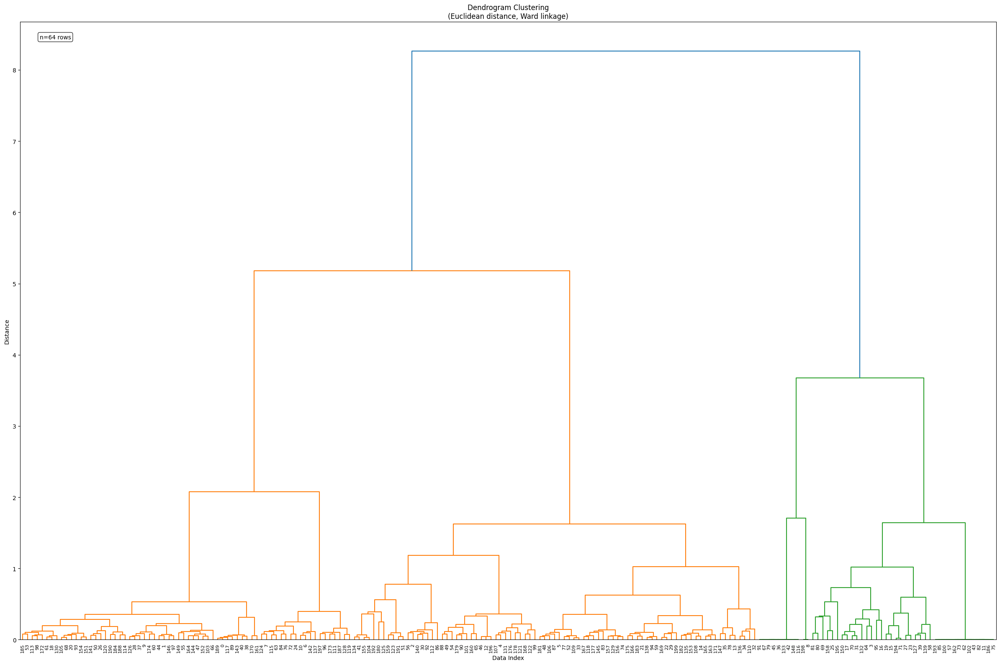

Computing permutation-invariant distances for 200 models...
Each model has 64 loss values
Computed 19900 pairwise distances in 29.78s


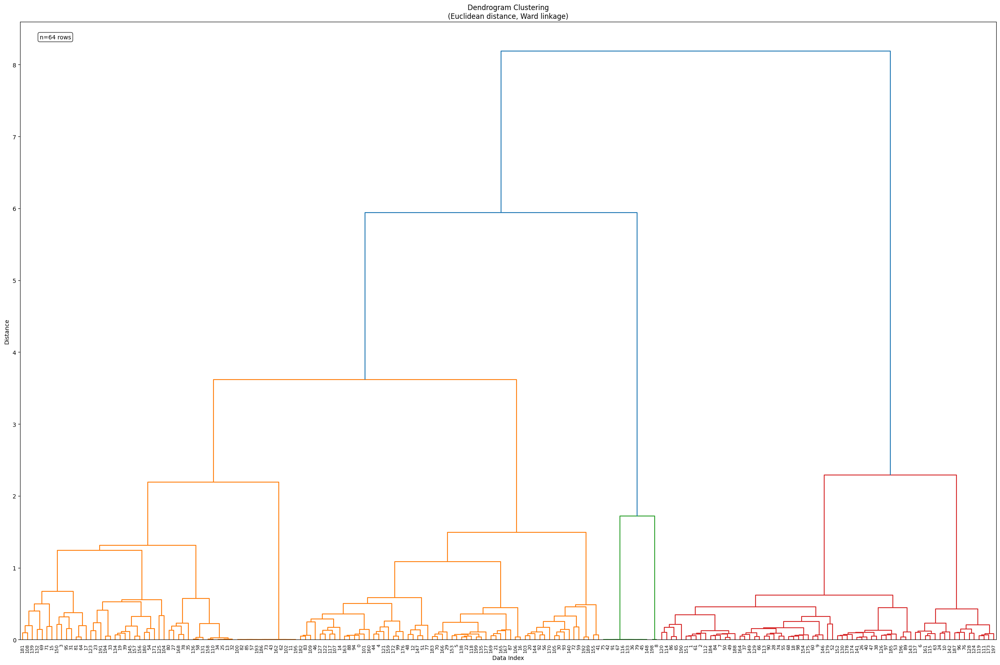

Computing permutation-invariant distances for 200 models...
Each model has 64 loss values
Computed 19900 pairwise distances in 29.80s


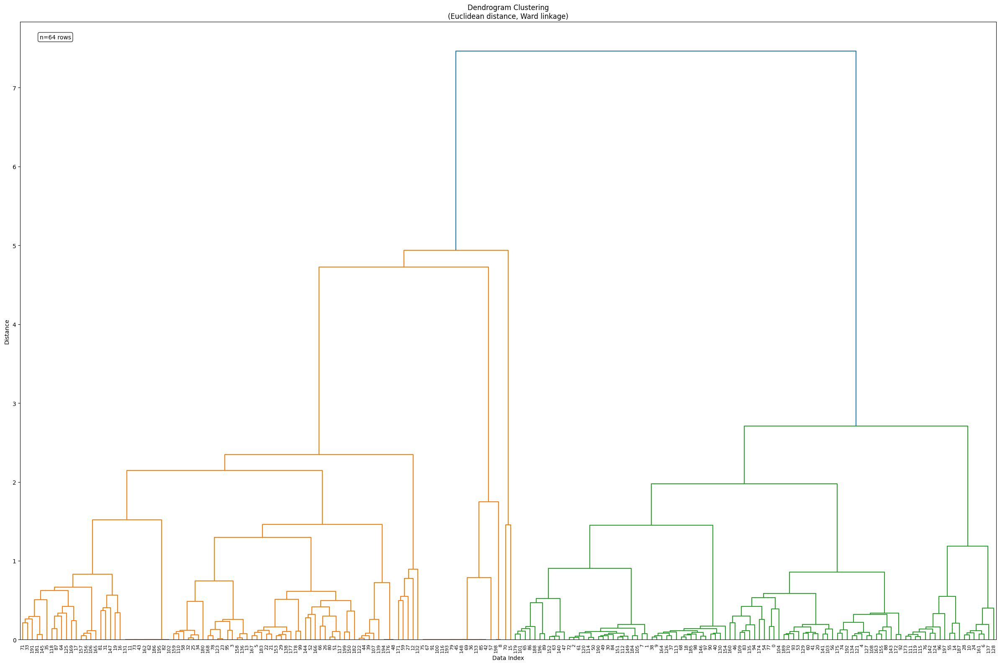

Computing permutation-invariant distances for 200 models...
Each model has 64 loss values
Computed 19900 pairwise distances in 29.39s


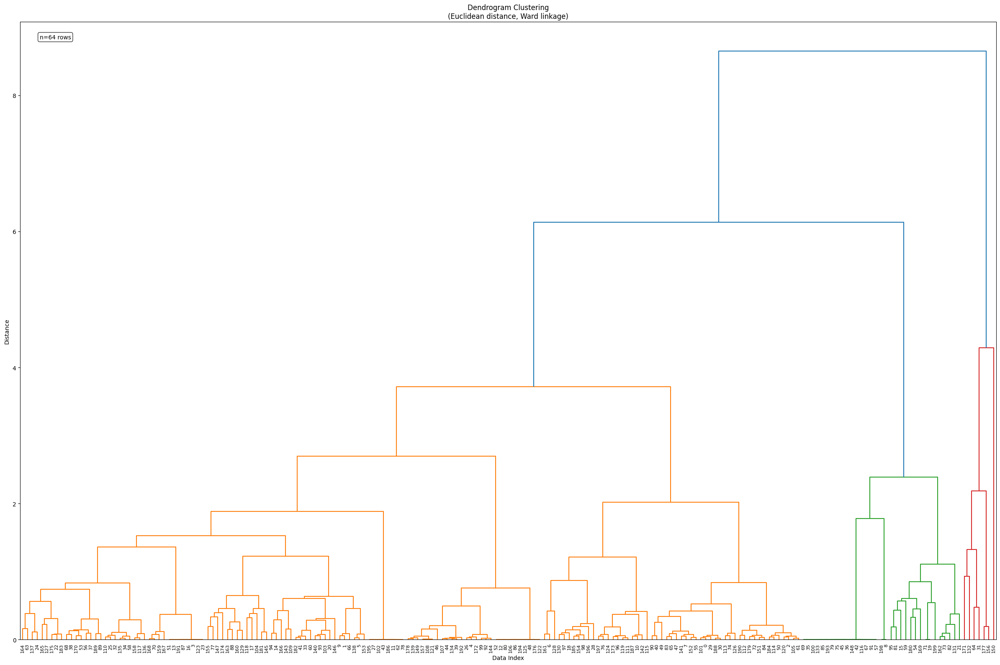

Computing permutation-invariant distances for 200 models...
Each model has 64 loss values
Computed 19900 pairwise distances in 28.96s


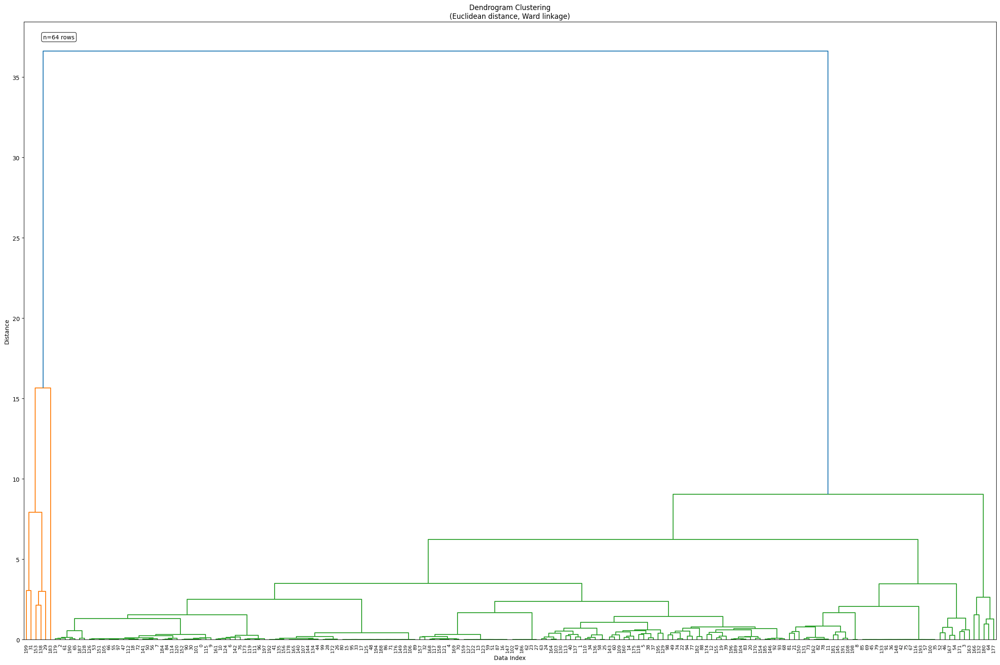

Computing permutation-invariant distances for 200 models...
Each model has 64 loss values


KeyboardInterrupt: 

In [74]:
for i, loss_matrix in enumerate(loss_matrices):
    create_dendrogram_visualization_mimimum(loss_matrix, info=f'{sparsities[i][0]:.3f}')

The above looks cool! My first guess would be that the really close ones are actually the ones that are really close!

Plotting index 43
Sparsity: 0.426
Loss at step -1: 0.42822265625


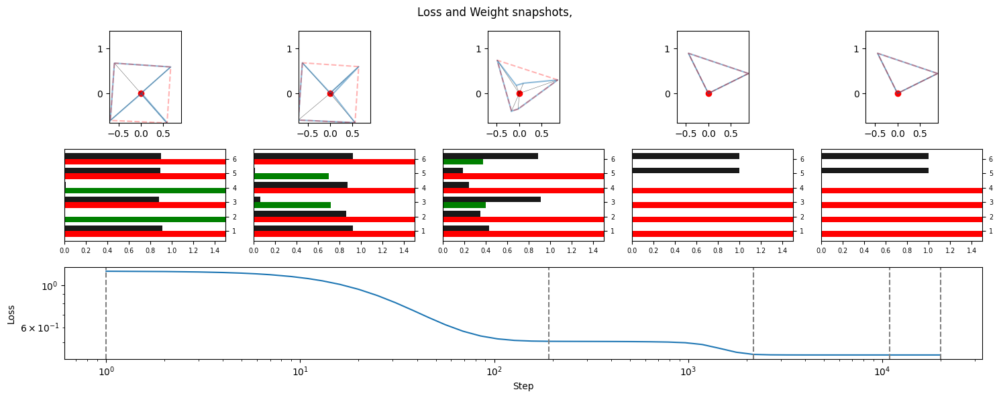

In [185]:
plot_specific_index(results_1_13, 43)

Plotting index 102
Sparsity: 0.426
Loss at step -1: 0.4378255307674408


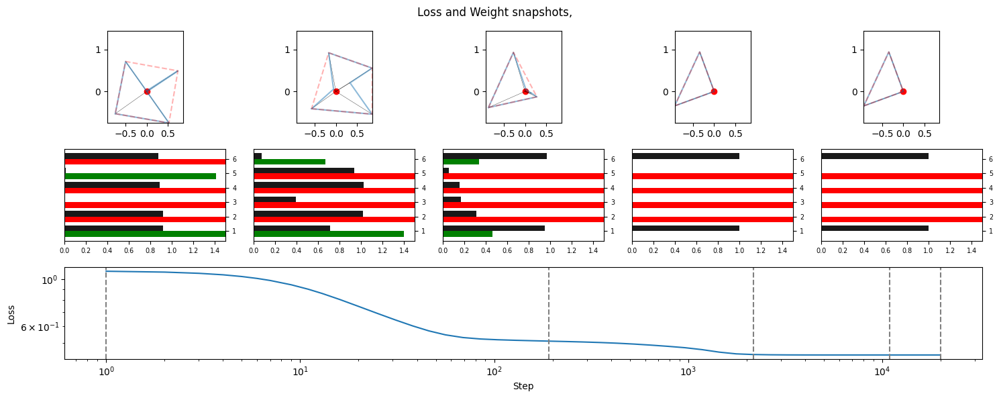

In [186]:
plot_specific_index(results_1_13, 102)

Plotting index 100
Sparsity: 0.426
Loss at step -1: 0.4357096254825592


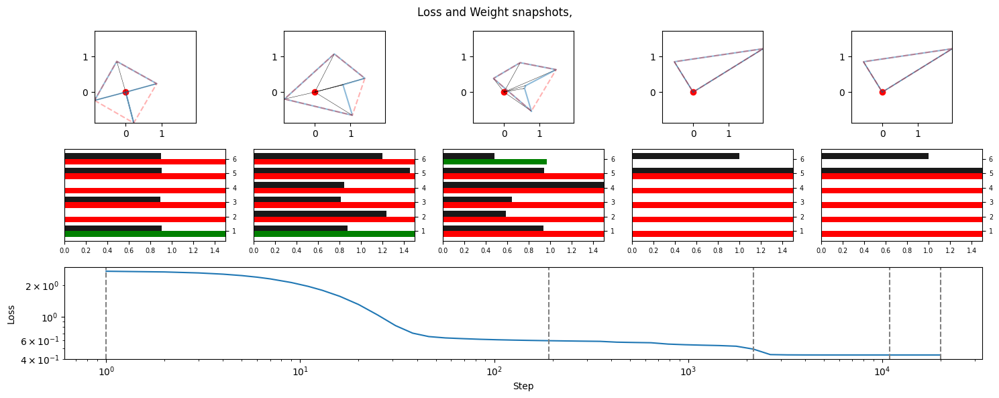

In [187]:
plot_specific_index(results_1_13, 100)

Plotting index 100
Sparsity: 0.426
Loss at step -1: 0.4357096254825592


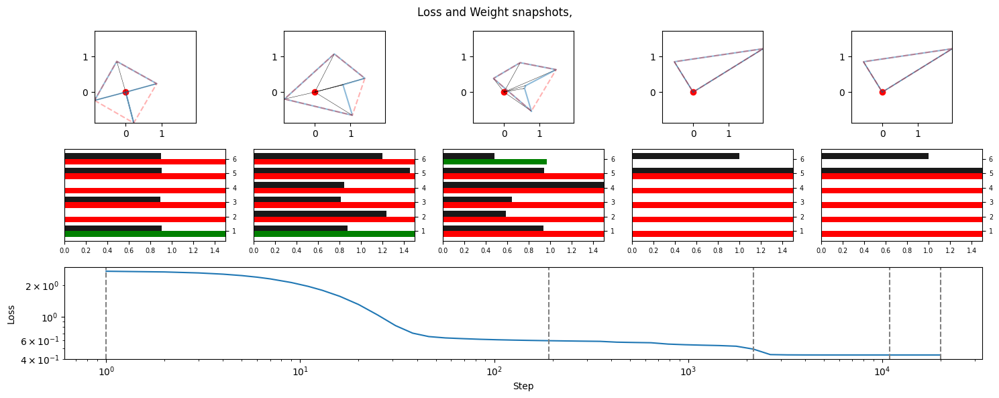

In [188]:
plot_specific_index(results_1_13, 100)

In [ ]:
plot_specific_index(results_1_13, 133)

Plotting index 8
Sparsity: 0.426
Loss at step -1: 0.6360676884651184


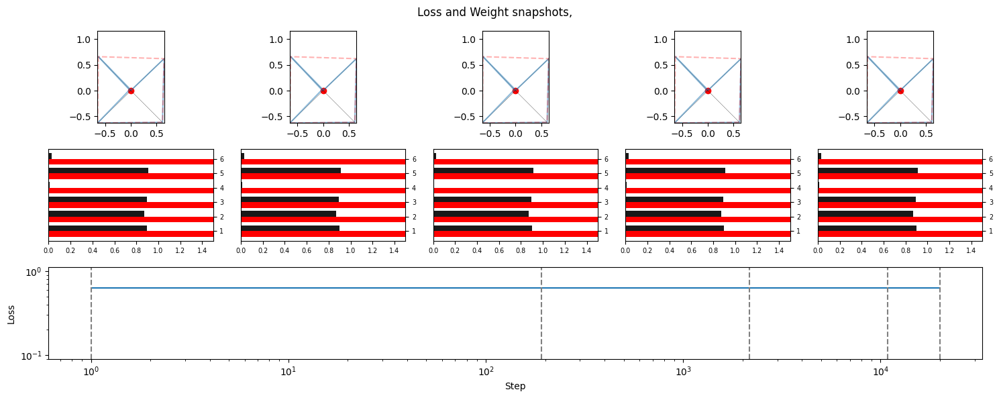

In [189]:
plot_specific_index(results_1_13, 8)

Plotting index 198
Sparsity: 0.426
Loss at step -1: 0.63623046875


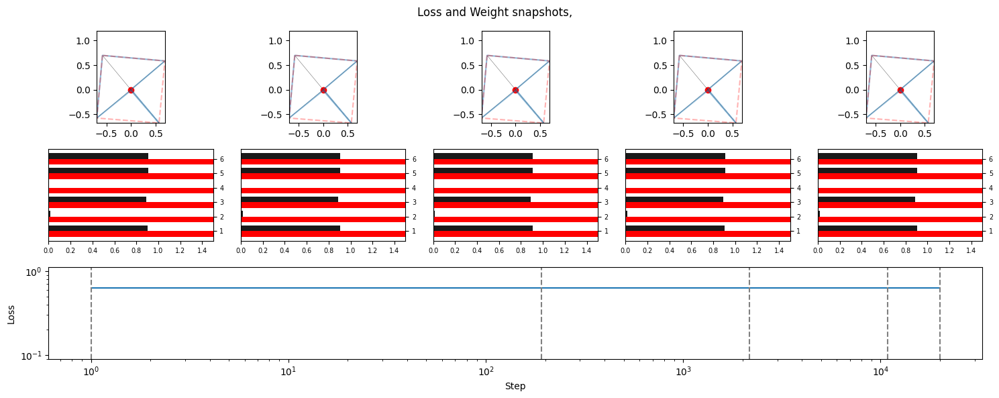

In [190]:
plot_specific_index(results_1_13, 198)

Plotting index 116
Sparsity: 0.426
Loss at step -1: 0.541015625


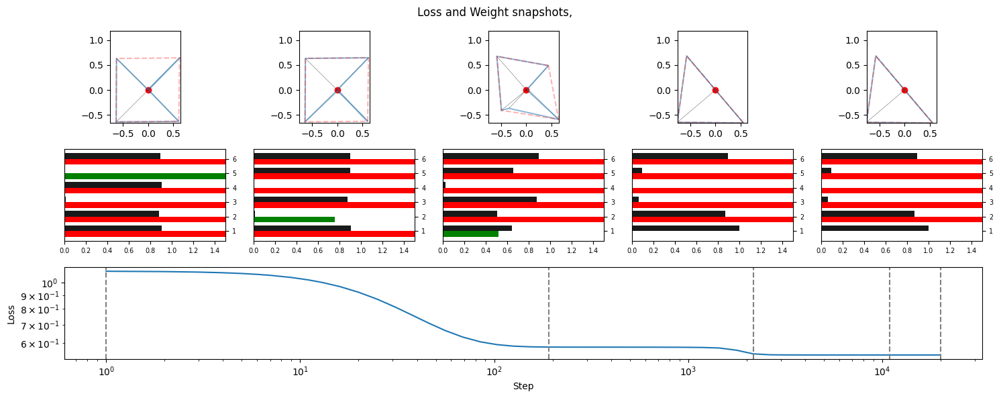

In [191]:
plot_specific_index(results_1_13, 116)

Plotting index 148
Sparsity: 0.426
Loss at step -1: 0.54248046875


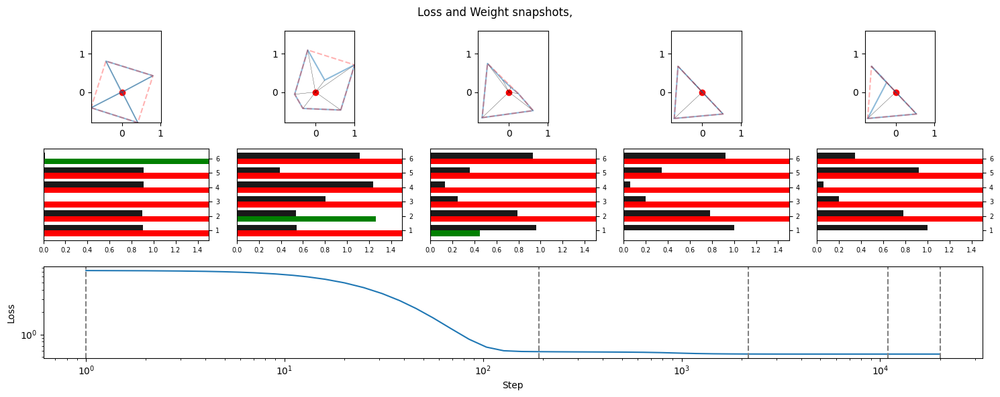

In [193]:
plot_specific_index(results_1_13, 148)

Plotting index 185
Sparsity: 0.426
Loss at step -1: 0.18991583585739136


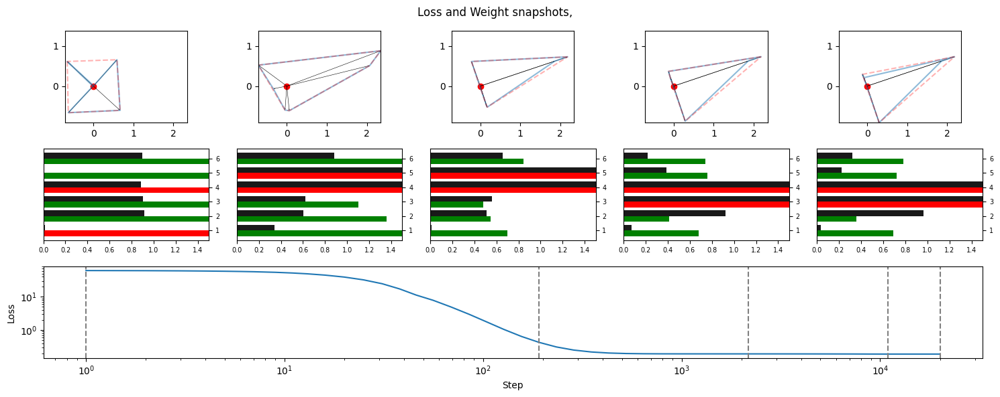

In [195]:
plot_specific_index(results_1_13, 185)

Plotting index 53
Sparsity: 0.426
Loss at step -1: 0.18834556639194489


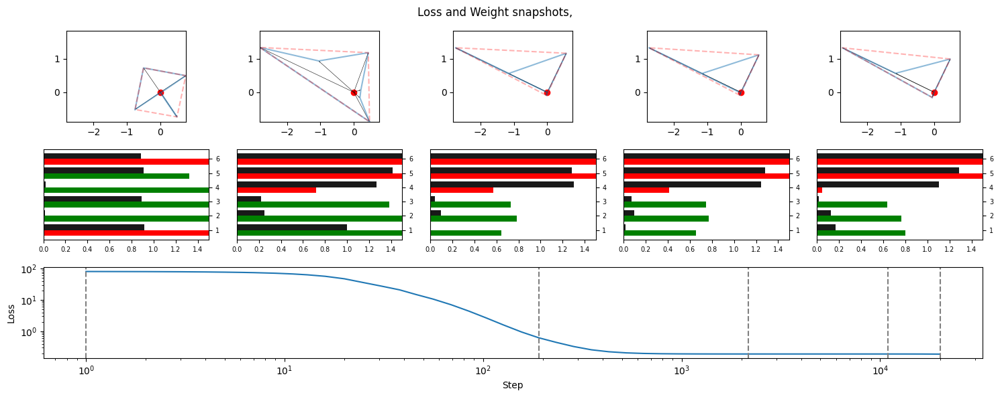

In [196]:
plot_specific_index(results_1_13, 53)

Plotting index 189
Sparsity: 0.426
Loss at step -1: 0.1927308589220047


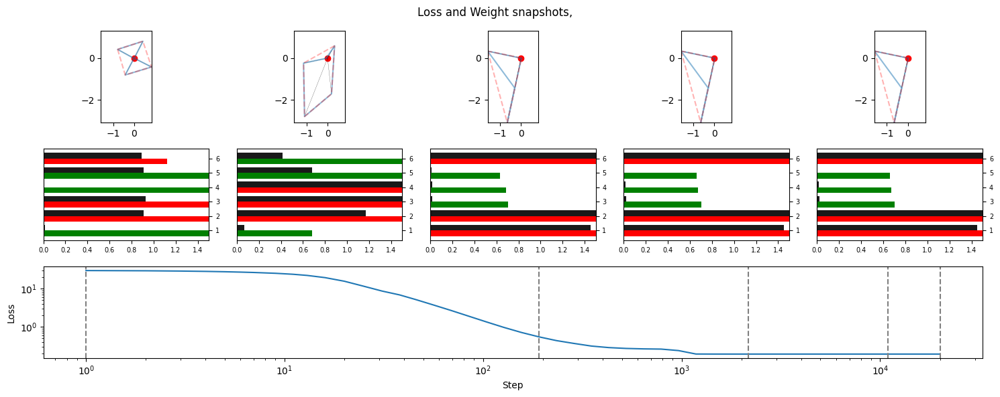

In [197]:
plot_specific_index(results_1_13, 189)

Plotting index 0
Sparsity: 0.426
Loss at step -1: 0.18979541957378387


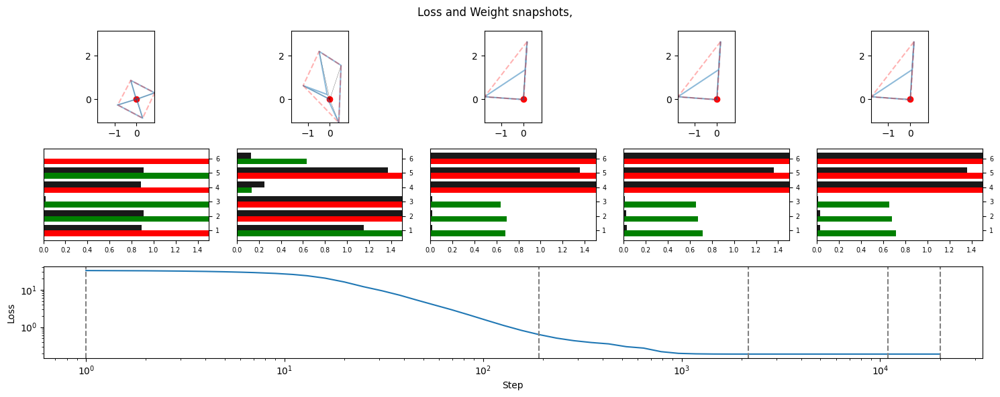

In [198]:
plot_specific_index(results_1_13, 0)

Plotting index 7
Sparsity: 0.426
Loss at step -1: 0.1511111855506897


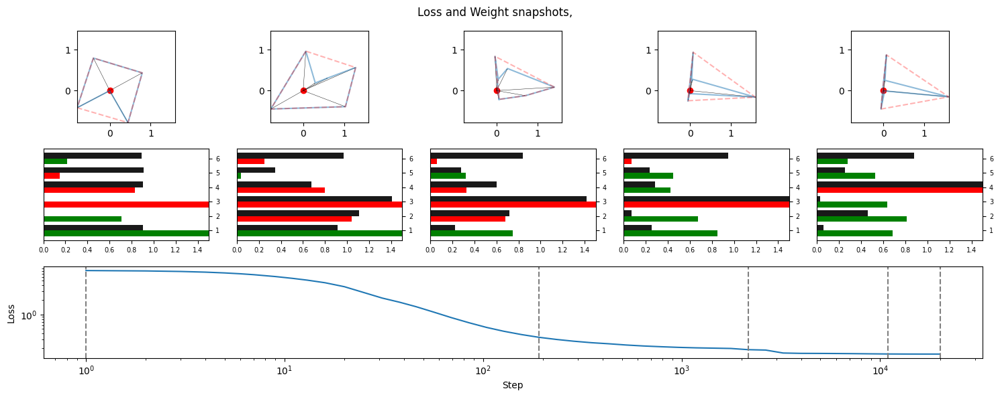

In [199]:
plot_specific_index(results_1_13, 7)

Plotting index 124
Sparsity: 0.426
Loss at step -1: 0.15214647352695465


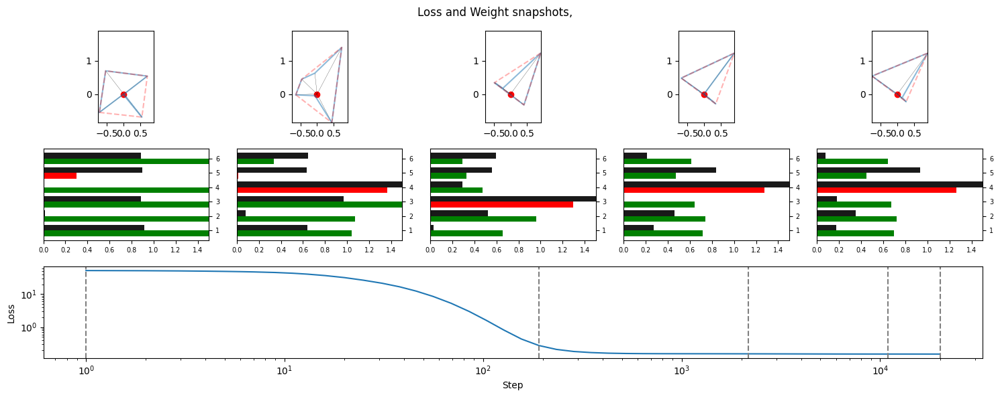

In [200]:
plot_specific_index(results_1_13, 124)

Plotting index 134
Sparsity: 0.426
Loss at step -1: 0.25976476073265076


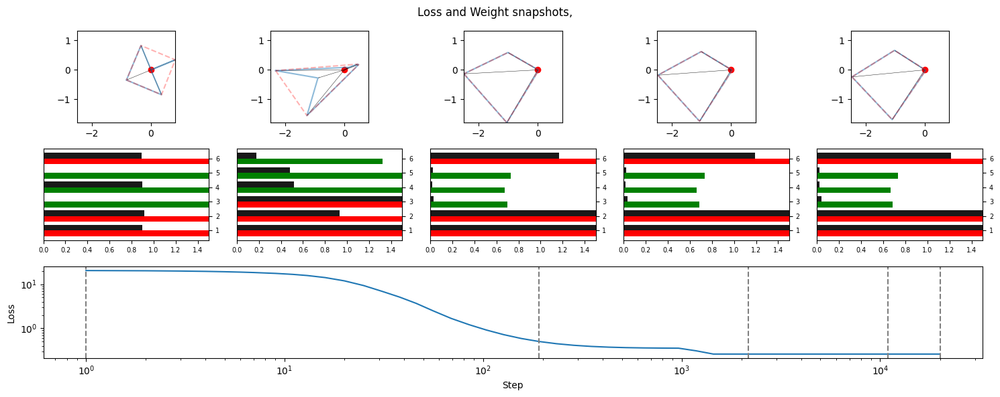

In [201]:
plot_specific_index(results_1_13, 134)

Plotting index 41
Sparsity: 0.426
Loss at step -1: 0.25262650847435


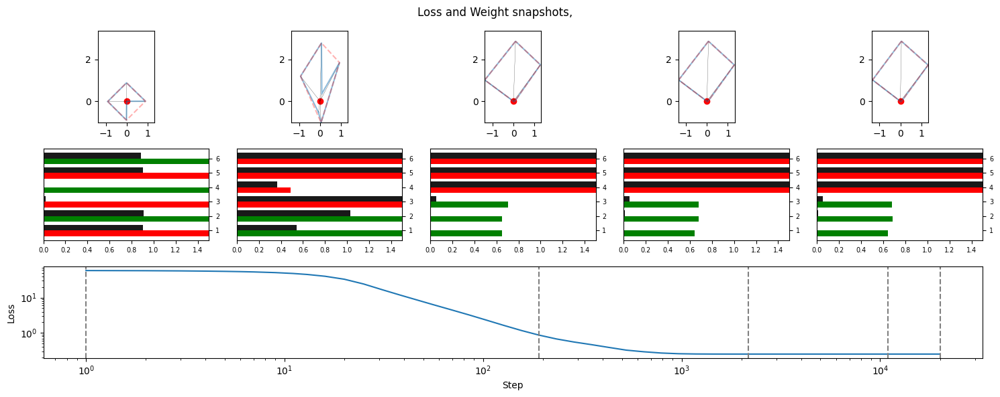

In [202]:
plot_specific_index(results_1_13, 41)

Plotting index 88
Sparsity: 0.426
Loss at step -1: 0.24557803571224213


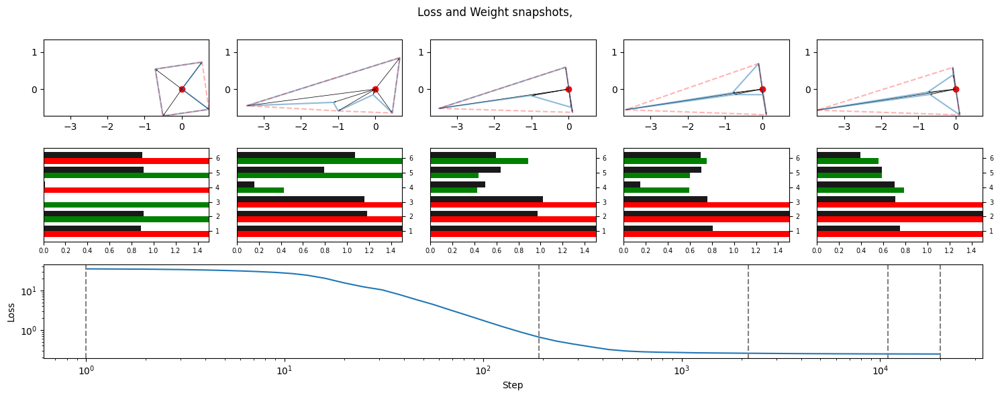

In [204]:
plot_specific_index(results_1_13, 88)

Observations:
- the solutions that are closest to each other seem to be the bad solutions that are stuck. The solutions that are good are all subtly different from each other. I guess this is sort of the intuition where all of the bad solutions have found their local optimium and a better optimum is really hard to find from there, while the others have fund a basin where it is not as easy to be stuck and there are various directions where it is possible to improve.

Plotting index 300
Sparsity: 0.671
Loss at step -1: 0.3001302182674408


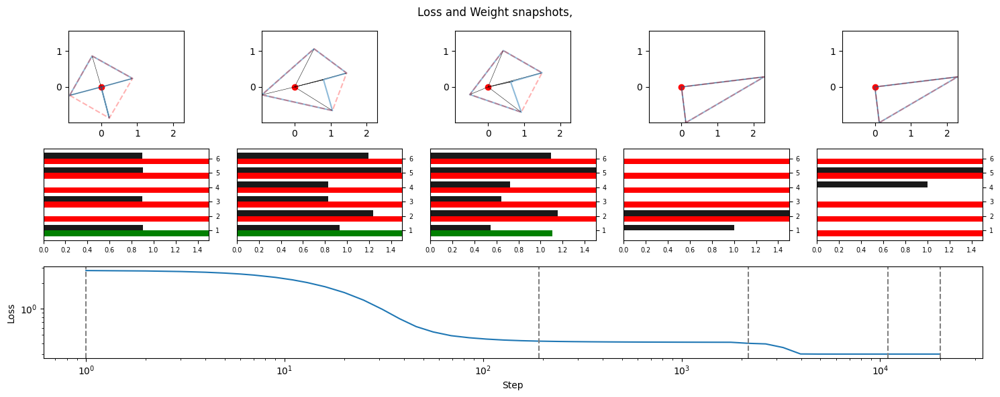

In [ ]:
plot_specific_index(results_1_13, 100 + 200)

Plotting index 282
Sparsity: 0.671
Loss at step -1: 0.29052734375


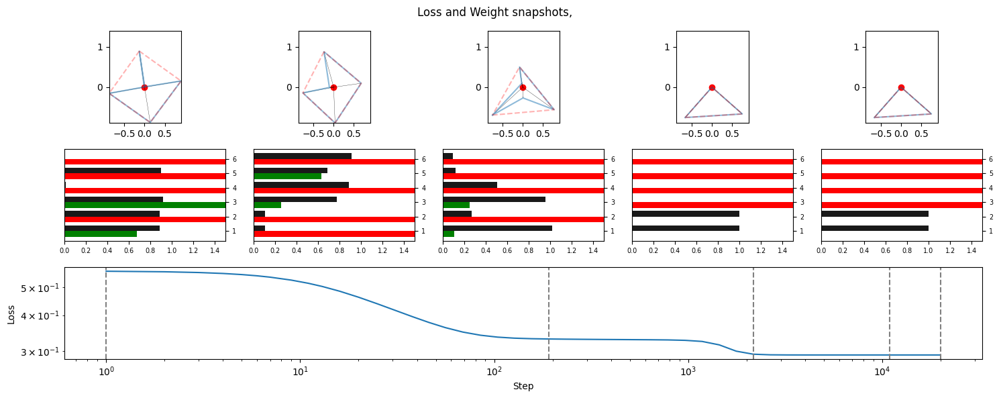

In [207]:
plot_specific_index(results_1_13, 82 + 200)

Plotting index 75
Sparsity: 0.426
Loss at step -1: 0.4287109375


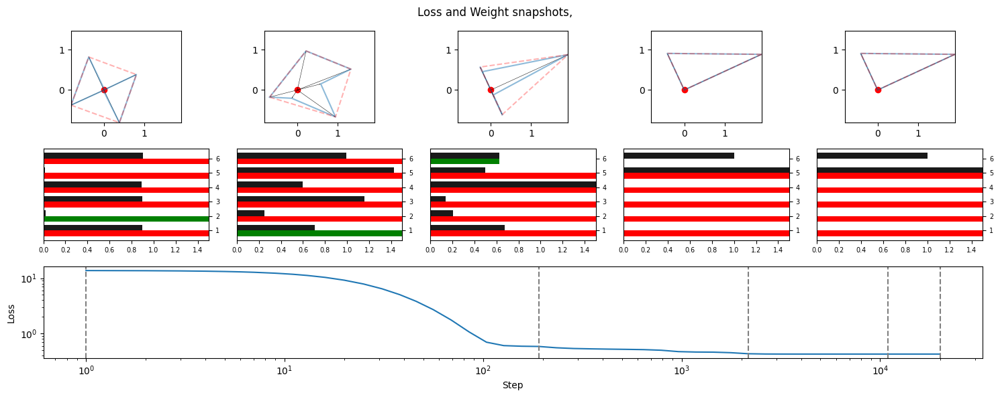

In [208]:
plot_specific_index(results_1_13, 75)

Plotting index 242
Sparsity: 0.671
Loss at step -1: 0.3728841245174408


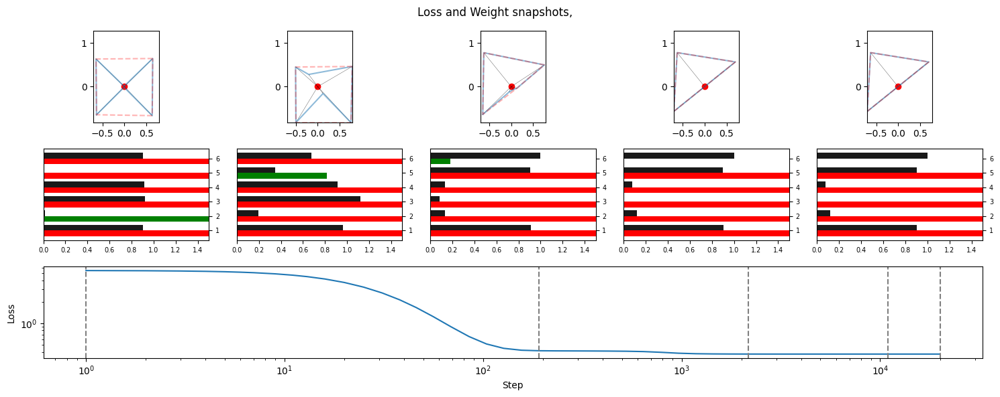

In [210]:
plot_specific_index(results_1_13, 42 + 200)

In [223]:
import numpy as np
import pandas as pd
from scipy.cluster.hierarchy import fcluster
import matplotlib.pyplot as plt

def generate_binary_sequences(n_bits=5):
    """Generate all binary sequences of length n_bits"""
    sequences = []
    for i in range(2**n_bits):
        # Convert to binary string, remove '0b' prefix, pad with zeros
        binary = format(i, f'0{n_bits}b')
        sequences.append(binary)
    return sequences

sparsity_index = 1  # Change this to select different sparsity group
index = 42  # Change this to select different model index
index2 = 75
diff = loss_matrices[sparsity_index][:,index] - loss_matrices[sparsity_index][:,index2]
pairs = sorted(zip(loss_matrices[sparsity_index][index], generate_binary_sequences(6), diff))

In [224]:
pairs

[(np.float32(0.041081753), '101100', np.float32(0.0)),
 (np.float32(0.06006102), '000100', np.float32(0.0)),
 (np.float32(0.08058142), '110001', np.float32(-0.16666666)),
 (np.float32(0.08356804), '000000', np.float32(2.63908e-11)),
 (np.float32(0.08379683), '100110', np.float32(0.16666666)),
 (np.float32(0.09834977), '110010', np.float32(0.16666666)),
 (np.float32(0.099896885), '111100', np.float32(0.0)),
 (np.float32(0.11207038), '000001', np.float32(-0.16666667)),
 (np.float32(0.11709479), '101001', np.float32(-0.16666666)),
 (np.float32(0.12398758), '000111', np.float32(0.0)),
 (np.float32(0.14822215), '111111', np.float32(0.0)),
 (np.float32(0.15777661), '001010', np.float32(0.16666667)),
 (np.float32(0.1592383), '000110', np.float32(0.16666667)),
 (np.float32(0.15996839), '101110', np.float32(0.16666669)),
 (np.float32(0.16083464), '100101', np.float32(-0.16666666)),
 (np.float32(0.16120698), '111101', np.float32(-0.16666663)),
 (np.float32(0.1694762), '010100', np.float32(0.0)),

Plotting index 381
Sparsity: 0.671
Loss at step -1: 0.2857745587825775


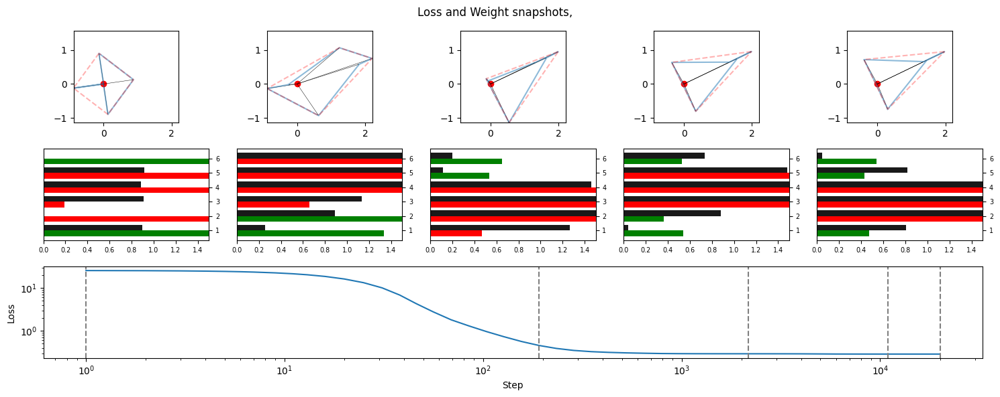

In [229]:
plot_specific_index(results_1_13, 181+200)

Plotting index 308
Sparsity: 0.671
Loss at step -1: 0.2796729505062103


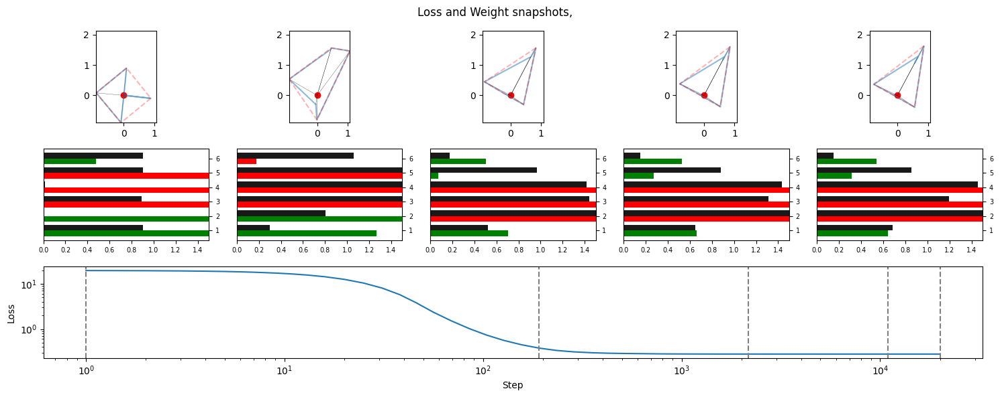

In [230]:
plot_specific_index(results_1_13, 108+200)

Plotting index 232
Sparsity: 0.671
Loss at step -1: 0.2537531554698944


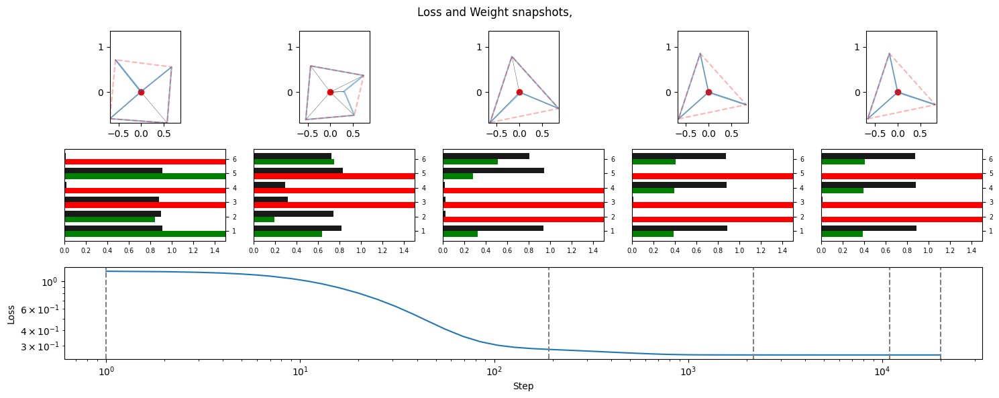

In [231]:
plot_specific_index(results_1_13, 32+200)

Plotting index 213
Sparsity: 0.671
Loss at step -1: 0.24872376024723053


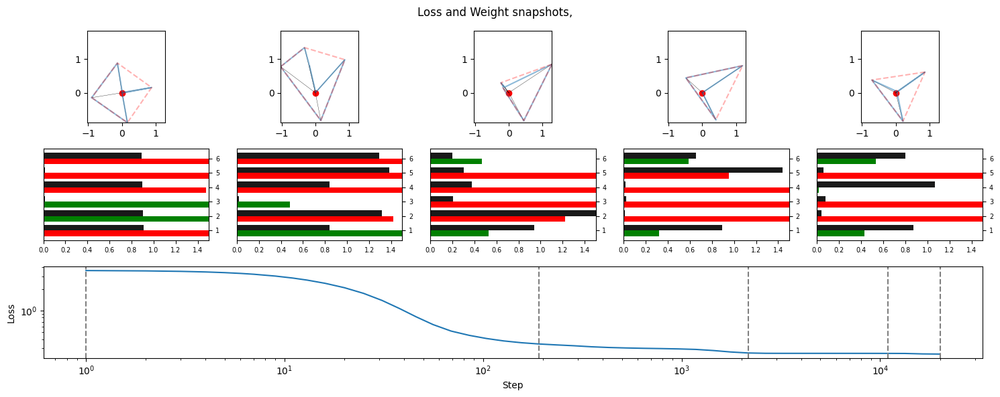

In [232]:
plot_specific_index(results_1_13, 13+ 200)

Plotting index 320
Sparsity: 0.671
Loss at step -1: 0.1827327013015747


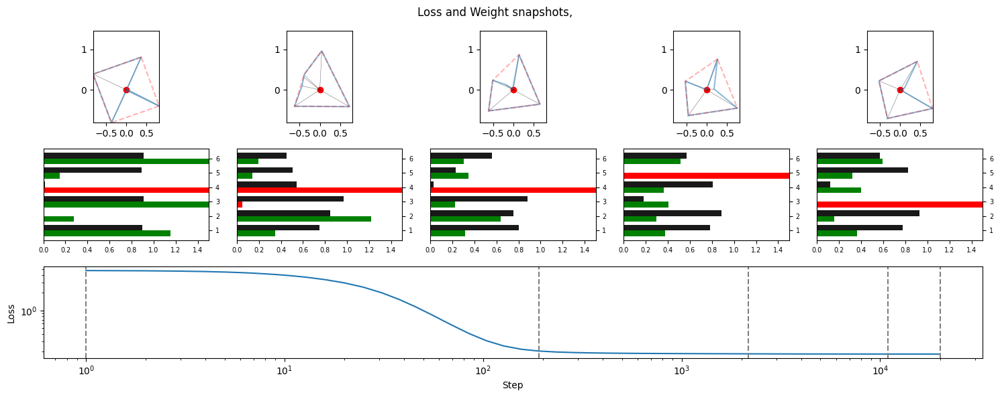

In [233]:
plot_specific_index(results_1_13, 120+200)

Plotting index 314
Sparsity: 0.671
Loss at step -1: 0.1815444678068161


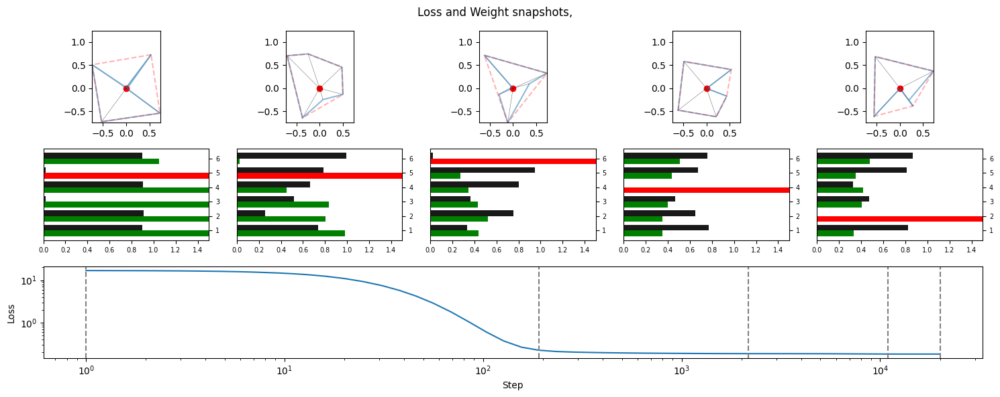

In [236]:
plot_specific_index(results_1_13, 114+200)

Plotting index 286
Sparsity: 0.671
Loss at step -1: 0.18201589584350586


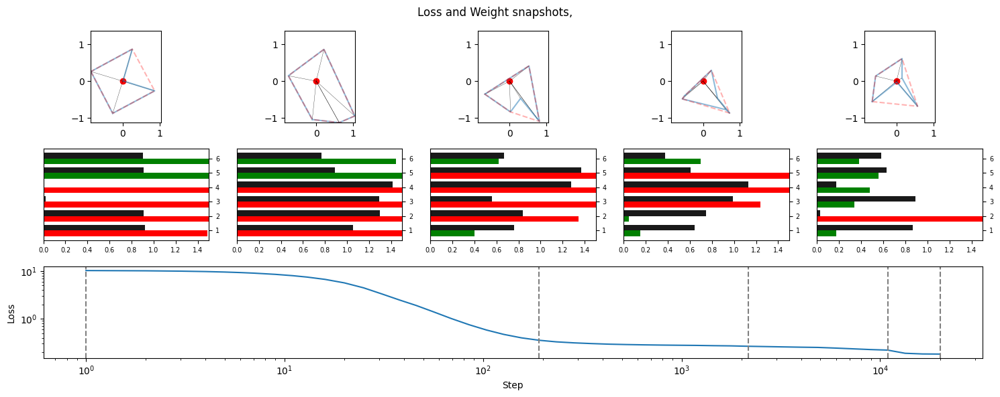

In [237]:
plot_specific_index(results_1_13, 86+200)

Plotting index 265
Sparsity: 0.671
Loss at step -1: 0.18452797830104828


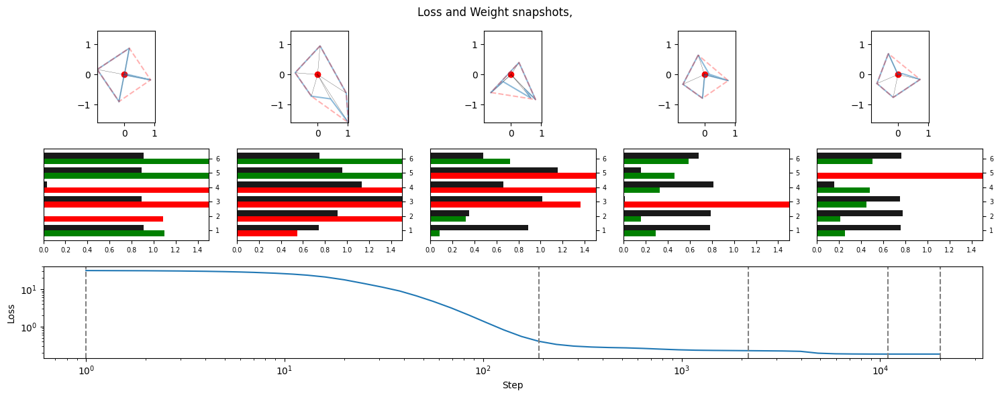

In [238]:

plot_specific_index(results_1_13, 65+200)


=== Visualizing first 2000 models ===

=== Creating loss matrix for first 2000 models ===
Processing 2000 models...
Processing model 0...
Processing model 50...
Processing model 100...
Processing model 150...
Processing model 200...
Processing model 250...
Processing model 300...
Processing model 350...
Processing model 400...
Processing model 450...
Processing model 500...
Processing model 550...
Processing model 600...
Processing model 650...
Processing model 700...
Processing model 750...
Processing model 800...
Processing model 850...
Processing model 900...
Processing model 950...
Processing model 1000...
Processing model 1050...
Processing model 1100...
Processing model 1150...
Processing model 1200...
Processing model 1250...
Processing model 1300...
Processing model 1350...
Processing model 1400...
Processing model 1450...
Processing model 1500...
Processing model 1550...
Processing model 1600...
Processing model 1650...
Processing model 1700...
Processing model 1750...
Proces

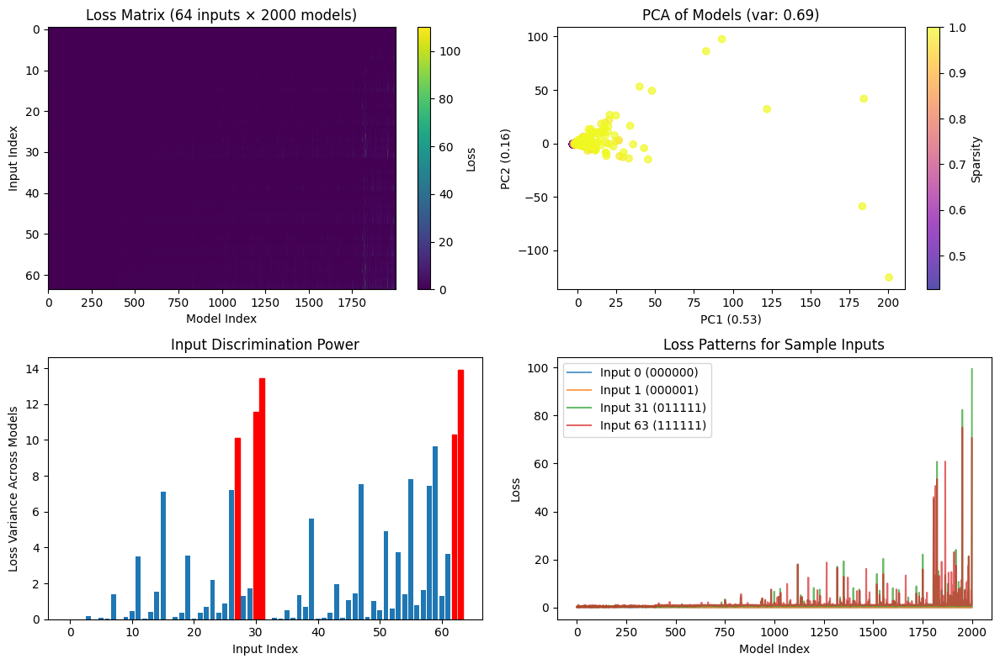


Sparsity range: 0.426 to 1.000
Loss range: 0.0000 to 110.0112

Top 5 discriminative inputs:
  1. Input 27 (011011) - 4 ones - var: 10.1375
  2. Input 62 (111110) - 5 ones - var: 10.2938
  3. Input 30 (011110) - 4 ones - var: 11.5687
  4. Input 31 (011111) - 5 ones - var: 13.4258
  5. Input 63 (111111) - 6 ones - var: 13.9274


In [ ]:
large_loss_matrix, large_sparsities = visualize_first_sparsity(results_1_13, max_models=2000)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from scipy.spatial import ConvexHull
from scipy.cluster.hierarchy import dendrogram, linkage
import torch
from collections import defaultdict, Counter

def calculate_convex_hull_vertices(W):
    """
    Calculate the number of vertices of the convex hull of the points represented by the columns of W.
    
    Parameters:
    W (torch.Tensor): A 2xN matrix where each column represents a point in 2D space.
    
    Returns:
    int: The number of vertices of the convex hull.
    """
    if W.shape[0] != 2:
        raise ValueError("The weight matrix W must have 2 rows.")
    
    # Convert the tensor to a numpy array if it isn't already
    if isinstance(W, torch.Tensor):
        W = W.cpu().detach().numpy()
    
    hull = ConvexHull(W.T)
    return len(hull.vertices)

def classify_5_gon(W, b, differentiate_5_plus=False):
    """
    Classify a 5-gon based on the weights and biases. 
    """
    # Convert tensor to numpy if it isn't already
    if isinstance(W, torch.Tensor):
        W = W.cpu().detach().numpy()
    
    if W.shape[0] == 2:
        W = W.T
    # Compute the convex hull
    hull = ConvexHull(W)
    
    # Check if the number of vertices is equal to 5
    if len(hull.vertices) != 5:
        return "not a 5-gon"
    
    # Convert biases to a numpy array if it isn't already
    if isinstance(b, torch.Tensor):
        b = b.cpu().detach().numpy()
    # Check if any of the non-vertex biases are large negative
    non_vertex_biases = np.delete(b, hull.vertices)
    # Check for any positive bias that is not part of the convex hull vertices
    non_hull_positive_bias = np.any(non_vertex_biases > 0)
    if not non_hull_positive_bias:
        return 5
    elif non_hull_positive_bias and differentiate_5_plus:
        return "5+"
    elif non_hull_positive_bias and not differentiate_5_plus:
        return 5
    else:
        return 'not a 5-gon'

def classify_kgon(W):
    embedding_w = W["embedding.weight"]
    edges = calculate_convex_hull_vertices(embedding_w)
    if edges == 5:
        return classify_5_gon(embedding_w, W["unembedding.bias"])
    return edges

def analyze_biases(bias_vector, epsilon=0.1):
    """
    Analyze bias vector and count positive, negative, and zero biases.
    
    Parameters:
    -----------
    bias_vector : array-like
        The bias vector to analyze
    epsilon : float
        Tolerance for considering a bias as zero
    
    Returns:
    --------
    dict: Counts of positive, negative, zero biases
    """
    if isinstance(bias_vector, torch.Tensor):
        bias_vector = bias_vector.cpu().detach().numpy()
    
    bias_vector = np.array(bias_vector)
    
    positive = np.sum(bias_vector > epsilon)
    negative = np.sum(bias_vector < -epsilon)
    zero = np.sum(np.abs(bias_vector) <= epsilon)
    
    return {
        'positive': int(positive),
        'negative': int(negative), 
        'zero': int(zero),
        'total': len(bias_vector)
    }

def classify_all_solutions(results, sparsities, epsilon=0.1):
    """
    Classify all solutions by k-gon type and bias patterns.
    
    Parameters:
    -----------
    results : list
        List of experimental results
    sparsities : array-like
        Array of sparsity values corresponding to results
    epsilon : float
        Tolerance for zero bias classification
    
    Returns:
    --------
    classifications : list
        List of dicts containing classification info for each model
    """
    classifications = []
    
    print(f"Classifying {len(results)} models...")
    
    for i, result in enumerate(results):
        try:
            # Get final weights (last snapshot)
            final_weights = result['weights'][-1]
            
            # Classify k-gon
            kgon_type = classify_kgon(final_weights)
            
            # Analyze biases
            bias_analysis = analyze_biases(final_weights["unembedding.bias"], epsilon)
            
            # Get sparsity
            sparsity = result['parameters']['sparsity']
            
            # Store classification
            classification = {
                'model_index': i,
                'sparsity': sparsity,
                'kgon_type': kgon_type,
                'bias_positive': bias_analysis['positive'],
                'bias_negative': bias_analysis['negative'],
                'bias_zero': bias_analysis['zero'],
                'bias_total': bias_analysis['total'],
                'bias_pattern': f"{bias_analysis['positive']}pos_{bias_analysis['negative']}neg"
            }
            
            classifications.append(classification)
            
        except Exception as e:
            print(f"Error processing model {i}: {e}")
            # Add failed classification
            classifications.append({
                'model_index': i,
                'sparsity': sparsities[i] if i < len(sparsities) else None,
                'kgon_type': 'error',
                'bias_positive': 0,
                'bias_negative': 0,
                'bias_zero': 0,
                'bias_total': 0,
                'bias_pattern': 'error'
            })
    
    return classifications

def create_classification_summary(classifications):
    """
    Create summary statistics of all classifications.
    """
    # Group by sparsity
    by_sparsity = defaultdict(list)
    for cls in classifications:
        by_sparsity[cls['sparsity']].append(cls)
    
    print("CLASSIFICATION SUMMARY")
    print("=" * 60)
    
    for sparsity in sorted(by_sparsity.keys()):
        models = by_sparsity[sparsity]
        print(f"\nSparsity {sparsity} ({len(models)} models):")
        print("-" * 40)
        
        # Count k-gon types
        kgon_counts = Counter([m['kgon_type'] for m in models])
        print("K-gon types:")
        for kgon_type, count in sorted(kgon_counts.items()):
            print(f"  {kgon_type}-gon: {count}")
        
        # Count bias patterns
        bias_patterns = Counter([m['bias_pattern'] for m in models])
        print("Bias patterns:")
        for pattern, count in sorted(bias_patterns.items()):
            print(f"  {pattern}: {count}")
    
    # Overall summary
    print(f"\nOVERALL SUMMARY ({len(classifications)} total models):")
    print("-" * 40)
    all_kgons = Counter([m['kgon_type'] for m in classifications])
    for kgon_type, count in sorted(all_kgons.items()):
        print(f"{kgon_type}-gon: {count}")
    
    return by_sparsity

def create_annotated_dendrogram(results,save_path="annotated_dendrogram.svg", 
                               figsize=(30, 20), dpi=300):
# def create_annotated_dendrogram(Z, classifications, ):
    """
    Create a large annotated dendrogram with k-gon and bias information.
    
    Parameters:
    -----------
    Z : array
        Linkage matrix
    classifications : list
        Classification results
    save_path : str
        Path to save SVG file
    figsize : tuple
        Figure size in inches
    dpi : int
        DPI for the figure
    """
    loss_matrix, _, sparsity = create_loss_matrix_simple(results, max_models=len(results))
    # Create figure
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)

    def ann(idx):
        cls = classifications[idx]
        return f"M{cls['model_index']}_{cls['kgon_type']}-gon_S:{cls['sparsity']:.3f}_{cls['bias_pattern']}"
    # Create dendrogram
    dend = dendrogram(Z, ax=ax, leaf_rotation=90, leaf_font_size=8)
    leaves = dend['leaves']
    
    # Create color map for k-gon types
    unique_kgons = list(set([c['kgon_type'] for c in classifications]))
    colors = plt.cm.Set3(np.linspace(0, 1, len(unique_kgons)))
    kgon_color_map = dict(zip(unique_kgons, colors))
    
    # Annotate leaves
    leaf_positions = np.arange(len(leaves)) * 10  # Position along x-axis
    
    for i, leaf_idx in enumerate(leaves):
        if leaf_idx < len(classifications):
            cls = classifications[leaf_idx]
            
            # Position for annotation
            x_pos = i * 10
            y_pos = -0.05 * ax.get_ylim()[1]  # Below the dendrogram
            
            # K-gon type annotation
            kgon_color = kgon_color_map[cls['kgon_type']]
            
            # Create annotation text
            annotation = f"M{cls['model_index']}_{cls['kgon_type']}-gon_S:{cls['sparsity']:.3f}_{cls['bias_pattern']}"
            
            # Add colored rectangle for k-gon type
            rect = patches.Rectangle((x_pos - 4, y_pos - 0.02 * ax.get_ylim()[1]), 
                                   8, 0.01 * ax.get_ylim()[1], 
                                   facecolor=kgon_color, alpha=0.7)
            ax.add_patch(rect)
            
            # Add text annotation
            ax.text(x_pos, y_pos - 0.03 * ax.get_ylim()[1], annotation, 
                   ha='center', va='top', fontsize=6, rotation=90)
    
    # Create legend for k-gon types
    legend_elements = []
    for kgon_type, color in kgon_color_map.items():
        legend_elements.append(patches.Patch(color=color, label=f'{kgon_type}-gon'))
    
    ax.legend(handles=legend_elements, loc='upper right', fontsize=10)
    
    # Set title and labels
    ax.set_title('Annotated Dendrogram with K-gon Classifications and Bias Patterns', 
                fontsize=16)
    ax.set_xlabel('Model Index (with k-gon type and bias pattern)', fontsize=12)
    ax.set_ylabel('Distance', fontsize=12)
    
    # Adjust layout
    plt.tight_layout()
    
    # Save as SVG
    print(f"Saving annotated dendrogram to {save_path}...")
    plt.savefig(save_path, format='svg', dpi=dpi, bbox_inches='tight')
    plt.show()
    
    return fig, ax

def quick_classification_test(results, n_models=50):
    """
    Quick test on first n_models to verify the classification works.
    """
    print(f"Testing classification on first {n_models} models...")
    
    test_results = results[:n_models]
    sparsities = [r['parameters']['sparsity'] for r in test_results]
    
    classifications = classify_all_solutions(test_results, sparsities)
    summary = create_classification_summary(classifications)
    
    return classifications, summary

# Example usage
if __name__ == "__main__":
    print("K-gon Classification and Analysis Tool")
    print("Usage:")
    print("1. classifications = classify_all_solutions(results, sparsities)")
    print("2. summary = create_classification_summary(classifications)")
    print("3. create_annotated_dendrogram(Z, classifications, 'large_dendrogram.svg')")
    print("4. Or test first: quick_classification_test(results, n_models=50)")

K-gon Classification and Analysis Tool
Usage:
1. classifications = classify_all_solutions(results, sparsities)
2. summary = create_classification_summary(classifications)
3. create_annotated_dendrogram(Z, classifications, 'large_dendrogram.svg')
4. Or test first: quick_classification_test(results, n_models=50)


In [100]:
quick_classification_test(results_1_13, n_models=50)

Testing classification on first 50 models...
Classifying 50 models...
CLASSIFICATION SUMMARY

Sparsity 0.426 (50 models):
----------------------------------------
K-gon types:
  3-gon: 17
  4-gon: 26
  5-gon: 7
Bias patterns:
  0pos_4neg: 2
  0pos_5neg: 3
  0pos_6neg: 1
  1pos_4neg: 1
  1pos_5neg: 2
  2pos_4neg: 12
  3pos_3neg: 14
  4pos_2neg: 11
  5pos_1neg: 4

OVERALL SUMMARY (50 total models):
----------------------------------------
3-gon: 17
4-gon: 26
5-gon: 7


([{'model_index': 0,
   'sparsity': np.float64(0.426),
   'kgon_type': 4,
   'bias_positive': 3,
   'bias_negative': 3,
   'bias_zero': 0,
   'bias_total': 6,
   'bias_pattern': '3pos_3neg'},
  {'model_index': 1,
   'sparsity': np.float64(0.426),
   'kgon_type': 4,
   'bias_positive': 4,
   'bias_negative': 2,
   'bias_zero': 0,
   'bias_total': 6,
   'bias_pattern': '4pos_2neg'},
  {'model_index': 2,
   'sparsity': np.float64(0.426),
   'kgon_type': 3,
   'bias_positive': 4,
   'bias_negative': 2,
   'bias_zero': 0,
   'bias_total': 6,
   'bias_pattern': '4pos_2neg'},
  {'model_index': 3,
   'sparsity': np.float64(0.426),
   'kgon_type': 4,
   'bias_positive': 2,
   'bias_negative': 4,
   'bias_zero': 0,
   'bias_total': 6,
   'bias_pattern': '2pos_4neg'},
  {'model_index': 4,
   'sparsity': np.float64(0.426),
   'kgon_type': 4,
   'bias_positive': 3,
   'bias_negative': 3,
   'bias_zero': 0,
   'bias_total': 6,
   'bias_pattern': '3pos_3neg'},
  {'model_index': 5,
   'sparsity': np.f

In [101]:

# create_dendrogram_visualization_mimimum(loss_matrix, info=f'{sparsities[i][0]:.3f}')
small_results = results_random_init[:10]
loss_matrix, _, sparsity = create_loss_matrix_simple(small_results, 10)
Z, distances = create_permutation_invariant_dendrogram(loss_matrix)
create_annotated_dendrogram(Z, classifications = classify_all_solutions(small_results, sparsity),save_path=f"annotated_dendrogram_small.svg")


=== Creating loss matrix for first 10 models ===
Processing 10 models...
Processing model 0...
Computing permutation-invariant distances for 10 models...
Each model has 64 loss values
Computed 45 pairwise distances in 0.07s
Classifying 10 models...
Saving annotated dendrogram to annotated_dendrogram_small.svg...


(<Figure size 9000x6000 with 1 Axes>,
 <Axes: title={'center': 'Annotated Dendrogram with K-gon Classifications and Bias Patterns'}, xlabel='Model Index (with k-gon type and bias pattern)', ylabel='Distance'>)

In [97]:

# create_dendrogram_visualization_mimimum(loss_matrix, info=f'{sparsities[i][0]:.3f}')
small_results = results_random_init[:10]
loss_matrix, _, sparsity = create_loss_matrix_simple(small_results, 10)
Z, distances = create_permutation_invariant_dendrogram(loss_matrix)
create_annotated_dendrogram(Z, classifications = classify_all_solutions(small_results, sparsity),save_path=f"annotated_dendrogram_small.svg")


=== Creating loss matrix for first 10 models ===
Processing 10 models...
Processing model 0...
Computing permutation-invariant distances for 10 models...
Each model has 64 loss values
Computed 45 pairwise distances in 0.07s
Classifying 10 models...
Saving annotated dendrogram to annotated_dendrogram_small.svg...


(<Figure size 9000x6000 with 1 Axes>,
 <Axes: title={'center': 'Annotated Dendrogram with K-gon Classifications and Bias Patterns'}, xlabel='Model Index (with k-gon type and bias pattern)', ylabel='Distance'>)

Computing permutation-invariant distances for 200 models...
Each model has 64 loss values
Computed 19900 pairwise distances in 28.41s
Classifying 200 models...
Saving annotated dendrogram to annotated_dendrogram_0.svg...


Computing permutation-invariant distances for 200 models...
Each model has 64 loss values
Computed 19900 pairwise distances in 28.82s
Classifying 200 models...
Saving annotated dendrogram to annotated_dendrogram_1.svg...


Computing permutation-invariant distances for 200 models...
Each model has 64 loss values
Computed 19900 pairwise distances in 28.66s
Classifying 200 models...
Saving annotated dendrogram to annotated_dendrogram_2.svg...


Computing permutation-invariant distances for 200 models...
Each model has 64 loss values
Computed 19900 pairwise distances in 28.58s
Classifying 200 models...


KeyboardInterrupt: 

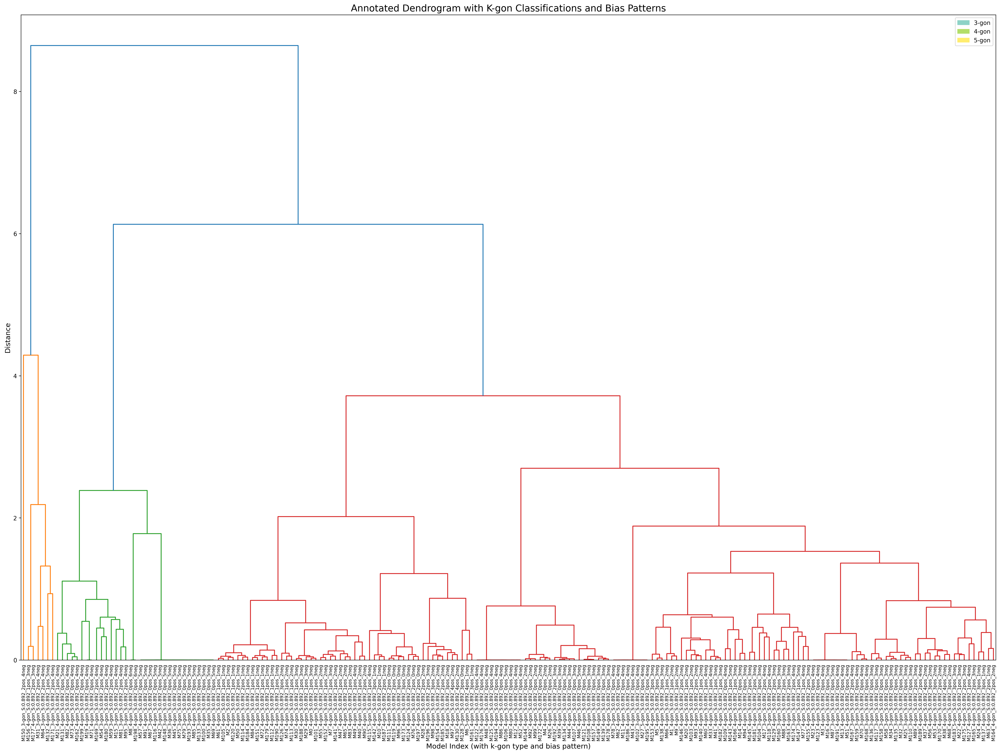

In [98]:
for i, loss_matrix in enumerate(loss_matrices):
    # create_dendrogram_visualization_mimimum(loss_matrix, info=f'{sparsities[i][0]:.3f}')
    Z, distances = create_permutation_invariant_dendrogram(loss_matrix)
    create_annotated_dendrogram(Z, classifications = classify_all_solutions(results_1_13[i*200:(i+1)*200], sparsities[i]),save_path=f"annotated_dendrogram_{i}.svg")

In [245]:
Z, distances = create_permutation_invariant_dendrogram(large_loss_matrix[:,:10])

Computing permutation-invariant distances for 10 models...
Each model has 64 loss values
Computed 45 pairwise distances in 0.11s


In [94]:
create_annotated_dendrogram(Z, 
                            classifications=classify_all_solutions(results_1_13, large_sparsities),
                            save_path="large_dendrogram.svg",
                            figsize=(30, 20), dpi=300)

NameError: name 'large_sparsities' is not defined